# Client: ABC Tech | Category: ITSM - ML Project Ref: PM-PR-0012

## Business Case:

* ABC Tech is an mid-size organisation operation in IT-enabled business segment over a decade. On an average ABC Tech receives 22-25k IT incidents/tickets , which were handled to best practice Information Technology Infrastructure Library (ITIL) frameworkwith incident management , problem management, change management and configuration management processes. These ITIL practices attained matured process level and a recent audit confirmed that further improvement initiatives may not yield return of investment.

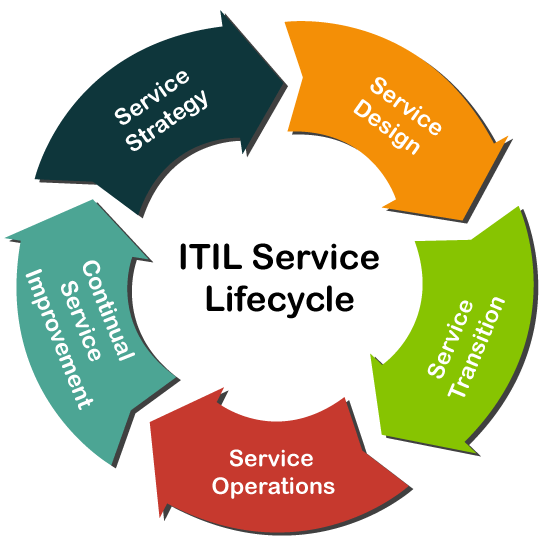

* ABC Tech management is looking for ways to improve the incident management process as recent customer survey results shows that incident management is rated as poor.
* Machine Learning as way to improve ITSM processes ABC Tech management recently attended Machine Learning conference on ML for   ITSM.Machine learning looks prospective to improve ITSM processes through prediction and automation. They came up with 4 key     areas, where ML can help ITSM process in ABC Tech.

## Problem Statement

   1) Predicting High Priority Tickets: ABC Tech aims to develop an ML model that can predict high-priority tickets,                  specifically those categorized as priority 1 and 2. This prediction will allow them to take proactive measures to address        issues or incidents before they escalate.

   2) Forecasting Incident Volume: The organization plans to use ML to forecast the incident volume in different fields on a           quarterly and annual basis. This predictive capability will help them better allocate resources and plan for the required       technology upgrades.

   3) Auto-Tagging Tickets: ABC Tech intends to implement a text classification ML model to automatically assign correct               priorities and departments to incoming tickets. This automation will reduce reassignment and related delays in ticket           handling.

   4) Predicting RFC and ITSM Asset Misconfigurations: The organization aims to create predictive models for Request for Change       (RFC) and detect potential failures or misconfigurations in ITSM assets. Identifying these issues in advance will help in       preventing disruptions and improving overall ITSM asset management.

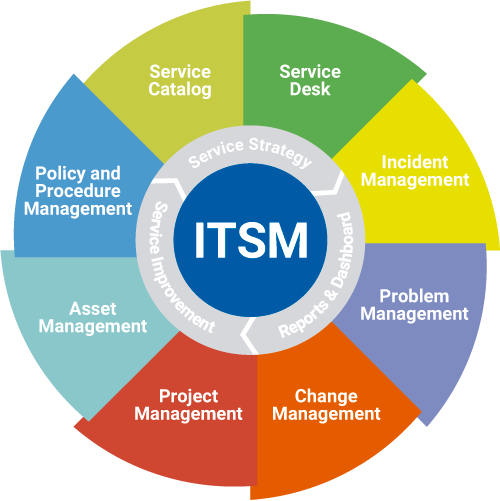

## Domain Analysis

* The dataset that ABC Tech plans to use for these ML initiatives comprises a total of approximately 46,000 records spanning the   years 2012, 2013, and 2014. The data is stored in a MySQL database with read-only access, and the relevant connection details   are provided.
* Here's a summary of some key fields in the dataset:

1) CI_Name: Configuration Item Name
2) CI_Cat: Configuration Item Category
3) CI_Subcat: Configuration Item Subcategory
4) Incident_ID: Incident Identifier
5) Status: Incident Status (e.g., Closed)
6) Impact: Impact level
7) Urgency: Urgency level
8) Priority: Incident Priority
9) Category: Incident Category
10) KB_number: Knowledge Base Number
11) Alert_Status: Alert Status
12) No_of_Reassignments: Number of Reassignments
13) Open_Time: Incident Open Time
14) Reopen_Time: Incident Reopen Time
15) Resolved_Time: Incident Resolved Time
16) Close_Time: Incident Close Time
17) Handle_Time_hrs: Time taken to handle the incident (in hours)
18) Closure_Code: Code for incident closure
19) No_of_Related_Interactions: Number of Related Interactions
20) Related_Interaction: Identifier for Related Interaction
21) No_of_Related_Incidents: Number of Related Incidents
22) No_of_Related_Changes: Number of Related Changes
23) Related_Change: Identifier for Related Change

In [ ]:
# installing pymysql and mysql-connector package for making connections to database server
!pip install pymysql
!pip install mysql-connector

## Important Library

In [446]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
import warnings
warnings.filterwarnings("ignore")
import mysql.connector
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,f1_score,precision_score,classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

## MySQL Database Server

In [190]:
connection = mysql.connector.connect(
    host="18.136.157.135",
    user="dm_team",
    password="DM!$Team@&27920!",
    database="project_itsm"
)

In [ ]:
# getting all tables of bank goodcredit
db_tables=pd.read_sql_query('show tables',connection)
print(db_tables)

In [ ]:
data_view=pd.read_sql_query('select* from dataset_list',connection)

In [ ]:
data_view

In [ ]:
data_view.to_csv("ITSM",index=False)

In [447]:
data=pd.read_csv("ITSM")
pd.set_option('display.max_columns',None)

## Basic checks

In [448]:
data.head(10)

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
0,SUB000508,subapplication,Web Based Application,WBS000162,IM0000004,Closed,4,4,4.0,0.601292,incident,KM0000553,closed,26.0,05-02-2012 13:32,NaN,04-11-2013 13:50,04-11-2013 13:51,"3,87,16,91,111",Other,1.0,SD0000007,2.0,NaN,NaN
1,WBA000124,application,Web Based Application,WBS000088,IM0000005,Closed,3,3,3.0,0.415050,incident,KM0000611,closed,33.0,12-03-2012 15:44,02-12-2013 12:31,02-12-2013 12:36,02-12-2013 12:36,"4,35,47,86,389",Software,1.0,SD0000011,1.0,NaN,NaN
2,DTA000024,application,Desktop Application,WBS000092,IM0000006,Closed,NS,3,NaN,0.517551,request for information,KM0000339,closed,3.0,29-03-2012 12:36,NaN,13-01-2014 15:12,13-01-2014 15:13,"4,84,31,19,444",No error - works as designed,1.0,SD0000017,NaN,NaN,NaN
3,WBA000124,application,Web Based Application,WBS000088,IM0000011,Closed,4,4,4.0,0.642927,incident,KM0000611,closed,13.0,17-07-2012 11:49,NaN,14-11-2013 09:31,14-11-2013 09:31,"4,32,18,33,333",Operator error,1.0,SD0000025,NaN,NaN,NaN
4,WBA000124,application,Web Based Application,WBS000088,IM0000012,Closed,4,4,4.0,0.345258,incident,KM0000611,closed,2.0,10-08-2012 11:01,NaN,08-11-2013 13:55,08-11-2013 13:55,"3,38,39,03,333",Other,1.0,SD0000029,NaN,NaN,NaN
5,WBA000124,application,Web Based Application,WBS000088,IM0000013,Closed,4,4,4.0,0.006676,incident,KM0000611,closed,4.0,10-08-2012 11:27,NaN,08-11-2013 13:54,08-11-2013 13:54,"3,38,34,36,944",Other,1.0,SD0000031,NaN,NaN,NaN
6,WBA000082,application,Web Based Application,WBS000055,IM0000014,Closed,4,4,4.0,0.192907,incident,KM0000401,closed,2.0,15-08-2012 14:17,NaN,27-12-2013 10:59,27-12-2013 10:59,"3,70,31,91,389",Unknown,1.0,SD0000033,NaN,NaN,NaN
7,WBA000124,application,Web Based Application,WBS000088,IM0000015,Closed,4,4,4.0,0.996468,incident,KM0000611,closed,5.0,22-08-2012 16:31,NaN,08-11-2013 14:09,08-11-2013 14:09,"3,29,46,24,167",Other,1.0,SD0000034,NaN,NaN,NaN
8,WBA000124,application,Web Based Application,WBS000088,IM0000017,Closed,NS,3,NaN,0.269574,incident,KM0000611,closed,2.0,29-08-2012 15:59,NaN,08-11-2013 14:02,08-11-2013 14:02,"0,862777778",Other,1.0,SD0000036,NaN,NaN,NaN
9,WBA000082,application,Web Based Application,WBS000055,IM0000018,Closed,4,4,4.0,0.306670,incident,KM0000401,closed,2.0,03-09-2012 16:04,NaN,08-11-2013 14:33,08-11-2013 14:35,"3,21,15,26,944",No error - works as designed,1.0,SD0000037,NaN,NaN,NaN


In [449]:
data.sample(200)

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
28398,SUB000456,subapplication,Web Based Application,WBS000073,IM0028673,Closed,4,4,4.0,0.996772,incident,KM0001736,closed,0.0,16-01-2014 12:37,NaN,16-01-2014 13:12,16-01-2014 13:12,"0,575833333",User error,1.0,SD0086549,NaN,NaN,NaN
2939,SUB000456,subapplication,Web Based Application,WBS000073,IM0003057,Closed,4,4,4.0,0.441046,incident,KM0000741,closed,0.0,07-10-2013 10:12,NaN,07-10-2013 11:41,07-10-2013 11:41,"1,49,22,22,222",Software,1.0,SD0006693,NaN,NaN,NaN
32893,SUB000456,subapplication,Web Based Application,WBS000073,IM0033190,Closed,4,4,4.0,0.617724,incident,KM0000751,closed,0.0,31-01-2014 18:07,NaN,NaN,03-02-2014 08:12,"0,711944444",Other,1.0,SD0100901,NaN,NaN,NaN
44667,SBA000834,application,Server Based Application,WBS000223,IM0045075,Closed,4,4,4.0,0.259624,incident,KM0000979,closed,2.0,20-03-2014 15:36,NaN,24-03-2014 09:55,24-03-2014 09:56,"1,53,36,94,444",Data,1.0,SD0139142,NaN,NaN,NaN
27887,WBA000058,application,Web Based Application,WBS000073,IM0028160,Closed,4,4,4.0,0.155585,incident,KM0001685,closed,0.0,14-01-2014 16:48,NaN,14-01-2014 16:58,14-01-2014 16:58,"0,171388889",Software,1.0,SD0084872,NaN,NaN,NaN
578,DTA000616,application,Desktop Application,WBS000092,IM0000667,Closed,4,4,4.0,0.354227,incident,KM0001526,closed,2.0,23-09-2013 14:54,NaN,11-10-2013 12:41,11-10-2013 13:24,"1,05,77,97,222",Other,1.0,SD0000876,NaN,2.0,#MULTIVALUE
29812,SBA000462,application,Server Based Application,WBS000073,IM0030095,Closed,4,4,4.0,0.499382,incident,KM0001829,closed,0.0,22-01-2014 09:08,NaN,22-01-2014 11:25,22-01-2014 11:25,"2,28,47,22,222",Other,1.0,SD0090930,NaN,NaN,NaN
40395,SBA000607,application,Server Based Application,WBS000263,IM0040733,Closed,4,4,4.0,0.834294,incident,KM0001106,closed,3.0,03-03-2014 13:21,NaN,04-03-2014 10:33,04-03-2014 10:34,"7,71,19,44,444",Other,1.0,SD0124832,NaN,NaN,NaN
11433,SUB000545,subapplication,Web Based Application,WBS000073,IM0011613,Closed,5,5,5.0,0.050907,incident,KM0000795,closed,2.0,06-11-2013 16:37,NaN,11-11-2013 13:34,11-11-2013 13:34,"1,81,11,11,111",Other,1.0,SD0032305,NaN,NaN,NaN
20745,SBA000263,application,Server Based Application,WBS000072,IM0020978,Closed,5,5,5.0,0.123727,request for information,KM0001113,closed,10.0,11-12-2013 15:29,NaN,24-12-2013 12:14,24-12-2013 12:14,"9,12,43,88,889",Other,1.0,SD0061474,NaN,NaN,NaN


# Domain Analysis:
Certainly! Domain analysis is an essential step in any data science or machine learning project. It involves gaining a deep understanding of the domain-specific aspects of the problem you're trying to solve. In this case, we're analyzing the domain of IT Service Management (ITSM) within the context of ABC Tech's business case. Here's a domain analysis for ITSM:

### 1. IT Service Management (ITSM):

* Definition: IT Service Management (ITSM) refers to a set of practices and processes used by organizations to design, deliver, manage, and improve IT services for their customers and end-users.
* Importance: ITSM ensures that IT services are aligned with business goals, reliable, and efficiently delivered, leading to enhanced customer satisfaction and business performance.
### 2. Incident Management:

* Definition: Incident Management is a core ITSM process that involves identifying, categorizing, prioritizing, and resolving incidents to restore normal service operations as quickly as possible.
* Challenges: Common challenges in incident management include handling a high volume of incidents, determining incident priorities, minimizing response times, and reducing the impact on end-users.
### 3. Priority in ITSM:

* Definition: Priority is a classification system used to categorize incidents based on their severity and impact on business operations. In ITIL (IT Infrastructure Library) framework, there are typically four priority levels: Priority 1 (Critical), Priority 2 (High), Priority 3 (Medium), and Priority 4 (Low).
* Importance: Prioritizing incidents helps organizations allocate resources effectively and respond to critical issues promptly.
### 4. ITIL Framework:

* Definition: ITIL is a widely adopted framework for ITSM that provides best practices and guidelines for managing IT services, including incident management, problem management, change management, and configuration management.
* Maturity Levels: ITIL processes can mature over time, starting from ad-hoc practices and progressing to well-defined, controlled, and optimized processes. A mature ITIL framework leads to improved service quality and efficiency.
### 5. Machine Learning in ITSM:

* Application: Machine learning can be applied to ITSM processes to predict incidents, automate ticket classification, forecast resource needs, and detect anomalies or misconfigurations in IT assets.
* Benefits: ML can enhance incident response, reduce manual workload, improve service quality, and proactively identify issues before they impact operations.
### 6. Data Considerations:

* Data Sources: Data for ITSM projects typically come from various sources, including incident tracking systems, service logs, configuration databases, and customer feedback.
* Data Quality: Data quality is critical, as inaccurate or incomplete data can lead to incorrect predictions and decisions.
* Privacy and Compliance: ITSM data often contains sensitive information, so privacy and compliance with data protection regulations (e.g., GDPR) are crucial considerations.
### 7. Metrics and KPIs:

* Key Metrics: Key Performance Indicators (KPIs) in ITSM include Mean Time to Resolve (MTTR), Incident Response Time, Incident Closure Rate, and Customer Satisfaction.
* Monitoring: Continuous monitoring of KPIs helps organizations assess the effectiveness of their ITSM processes and make improvements.
### 8. Stakeholders:

* Internal Stakeholders: IT teams, IT managers, incident responders, change management teams.
  External Stakeholders: End-users, customers, auditors (for compliance).
### 9. Challenges:

* Scalability: Handling a large volume of incidents efficiently can be challenging.
* Data Integration: Integrating data from disparate sources can be complex.
* Change Management: Implementing ML solutions may require organizational and cultural changes.

In [450]:
pd.set_option('display.max_rows',None)
data.No_of_Related_Incidents.value_counts()

No_of_Related_Incidents
1.0     1057
2.0       74
3.0       20
4.0       13
5.0        8
6.0        8
9.0        6
8.0        5
11.0       4
12.0       4
7.0        4
17.0       3
16.0       3
10.0       2
24.0       2
14.0       1
25.0       1
23.0       1
54.0       1
26.0       1
21.0       1
63.0       1
13.0       1
15.0       1
Name: count, dtype: int64

In [451]:
import datetime

In [452]:
data.shape

(46606, 25)

In [453]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46606 entries, 0 to 46605
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CI_Name                     46606 non-null  object 
 1   CI_Cat                      46495 non-null  object 
 2   CI_Subcat                   46495 non-null  object 
 3   WBS                         46606 non-null  object 
 4   Incident_ID                 46606 non-null  object 
 5   Status                      46606 non-null  object 
 6   Impact                      46606 non-null  object 
 7   Urgency                     46606 non-null  object 
 8   Priority                    45226 non-null  float64
 9   number_cnt                  46606 non-null  float64
 10  Category                    46606 non-null  object 
 11  KB_number                   46606 non-null  object 
 12  Alert_Status                46606 non-null  object 
 13  No_of_Reassignments         466

In [454]:
data.describe()

,Priority,number_cnt,No_of_Reassignments,No_of_Related_Interactions,No_of_Related_Incidents,No_of_Related_Changes
count,45226.000000,46606.000000,46605.000000,46492.000000,1222.000000,560.000000
mean,4.215805,0.499658,1.131831,1.149897,1.669394,1.058929
std,0.705624,0.288634,2.269774,2.556338,3.339687,0.403596
min,1.000000,0.000023,0.000000,1.000000,1.000000,1.000000
25%,4.000000,0.248213,0.000000,1.000000,1.000000,1.000000
50%,4.000000,0.500269,0.000000,1.000000,1.000000,1.000000
75%,5.000000,0.749094,2.000000,1.000000,1.000000,1.000000
max,5.000000,0.999997,46.000000,370.000000,63.000000,9.000000


In [455]:
data.describe(include='O')

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Category,KB_number,Alert_Status,Open_Time,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,Related_Interaction,Related_Change
count,46606,46495,46495,46606,46606,46606,46606,46606,46606,46606,46606,46606,2284,44826,46606,46605,46146,46606,560
unique,3019,12,64,274,46606,2,6,11,4,1825,1,34636,2244,33627,34528,30638,14,43060,232
top,SUB000456,application,Server Based Application,WBS000073,IM0000004,Closed,4,4,incident,KM0001106,closed,24-03-2014 08:54,29-10-2013 15:03,10-10-2013 12:53,02-10-2013 15:20,0,Other,#MULTIVALUE,C00003013
freq,3050,32900,18811,13342,1,46597,22556,15526,37748,1106,46606,7,2,7,21,236,16470,3434,110


* Unique value will be 1 for constant column.Here, Alert_Status is the constant feature. so we drop the column.

In [456]:
data.isnull().sum().sort_values(ascending=False)

Related_Change                46046
No_of_Related_Changes         46046
No_of_Related_Incidents       45384
Reopen_Time                   44322
Resolved_Time                  1780
Priority                       1380
Closure_Code                    460
No_of_Related_Interactions      114
CI_Subcat                       111
CI_Cat                          111
Handle_Time_hrs                   1
No_of_Reassignments               1
Related_Interaction               0
Close_Time                        0
CI_Name                           0
Open_Time                         0
KB_number                         0
Category                          0
number_cnt                        0
Urgency                           0
Impact                            0
Status                            0
Incident_ID                       0
WBS                               0
Alert_Status                      0
dtype: int64

In [457]:
data.dtypes

CI_Name                        object
CI_Cat                         object
CI_Subcat                      object
WBS                            object
Incident_ID                    object
Status                         object
Impact                         object
Urgency                        object
Priority                      float64
number_cnt                    float64
Category                       object
KB_number                      object
Alert_Status                   object
No_of_Reassignments           float64
Open_Time                      object
Reopen_Time                    object
Resolved_Time                  object
Close_Time                     object
Handle_Time_hrs                object
Closure_Code                   object
No_of_Related_Interactions    float64
Related_Interaction            object
No_of_Related_Incidents       float64
No_of_Related_Changes         float64
Related_Change                 object
dtype: object

In [458]:
data.duplicated().sum()

0

In [459]:
print(data["CI_Subcat"].unique().tolist())

['Web Based Application', 'Desktop Application', 'Server Based Application', 'SAP', 'Client Based Application', 'Citrix', 'Standard Application', 'Windows Server', 'Laptop', 'Linux Server', nan, 'Monitor', 'Automation Software', 'SAN', 'Banking Device', 'Desktop', 'Database', 'Oracle Server', 'Keyboard', 'Printer', 'Exchange', 'System Software', 'VDI', 'Encryption', 'Omgeving', 'MigratieDummy', 'Scanner', 'Controller', 'DataCenterEquipment', 'KVM Switches', 'Switch', 'Database Software', 'Network Component', 'Unix Server', 'Lines', 'ESX Cluster', 'zOS Server', 'SharePoint Farm', 'NonStop Server', 'Application Server', 'Security Software', 'Thin Client', 'zOS Cluster', 'Router', 'VMWare', 'Net Device', 'Neoview Server', 'MQ Queue Manager', 'UPS', 'Number', 'Iptelephony', 'Windows Server in extern beheer', 'Modem', 'X86 Server', 'ESX Server', 'Virtual Tape Server', 'IPtelephony', 'NonStop Harddisk', 'Firewall', 'RAC Service', 'zOS Systeem', 'Instance', 'NonStop Storage', 'Protocol', 'Tap

In [460]:
pd.set_option("display.max_rows", None);
print(data["CI_Subcat"].value_counts())

CI_Subcat
Server Based Application           18811
Web Based Application              15311
Desktop Application                 3876
Laptop                              1921
SAP                                 1199
Banking Device                       916
Citrix                               767
SAN                                  549
Client Based Application             492
Desktop                              423
DataCenterEquipment                  277
System Software                      272
Monitor                              212
Database                             211
Windows Server                       153
Controller                           146
Exchange                             130
Printer                               88
Omgeving                              86
Standard Application                  85
Scanner                               64
MigratieDummy                         60
Linux Server                          55
Automation Software                   55
Encryp

# Basic Checks Report:
## Overview:
When working with IT Service Management (ITSM) data or any dataset, it's essential to perform basic data checks to ensure the quality and integrity of the data. These basic checks help identify issues early on and ensure that your analysis or project is based on reliable data.

* Data Shape: We Check the dimensions of the dataset, i.e., the number of rows and columns, using data.shape. Data Contains 46606 Rows and 25 columns. Data Types: We Verified that the data types of each column are as expected usingdata.dtypes.Priority,number_cnt,No_of_Related_Interactions,No_of_Related_Incidents,No_of_Related_Changes,No_of_Reassignments are in float64 and remaining columns are in object.

* Descriptive Statistics: We Used data.describe().T to get summary statistics (mean, min, max, etc.) for numerical columns. Use data.describe(include='O').T for a summary of categorical columns.

* Unique Values: Checked the number of unique values in categorical columns using data['column'].unique(). here, One constant columns are there. so we dropped that column.

* Value Counts: Examined the distribution of categorical values using df['column'].value_counts().

The goal is to ensure that our data is clean, complete, and suitable for analysis or further processing.

# Data Preprocessing

In [461]:
data.columns

Index(['CI_Name', 'CI_Cat', 'CI_Subcat', 'WBS', 'Incident_ID', 'Status',
       'Impact', 'Urgency', 'Priority', 'number_cnt', 'Category', 'KB_number',
       'Alert_Status', 'No_of_Reassignments', 'Open_Time', 'Reopen_Time',
       'Resolved_Time', 'Close_Time', 'Handle_Time_hrs', 'Closure_Code',
       'No_of_Related_Interactions', 'Related_Interaction',
       'No_of_Related_Incidents', 'No_of_Related_Changes', 'Related_Change'],
      dtype='object')

In [462]:
data.No_of_Related_Changes.unique()

array([nan,  1.,  2.,  3.,  9.])

### CHECK MISSING VALUE

In [463]:
data.isnull().sum()

CI_Name                           0
CI_Cat                          111
CI_Subcat                       111
WBS                               0
Incident_ID                       0
Status                            0
Impact                            0
Urgency                           0
Priority                       1380
number_cnt                        0
Category                          0
KB_number                         0
Alert_Status                      0
No_of_Reassignments               1
Open_Time                         0
Reopen_Time                   44322
Resolved_Time                  1780
Close_Time                        0
Handle_Time_hrs                   1
Closure_Code                    460
No_of_Related_Interactions      114
Related_Interaction               0
No_of_Related_Incidents       45384
No_of_Related_Changes         46046
Related_Change                46046
dtype: int64

In [464]:
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=["Missing_Value","Missing_Percentage"])
    return null_value
missing_value(data)

,Missing_Value,Missing_Percentage
CI_Name,0,0.000000
CI_Cat,111,0.238167
CI_Subcat,111,0.238167
WBS,0,0.000000
Incident_ID,0,0.000000
Status,0,0.000000
Impact,0,0.000000
Urgency,0,0.000000
Priority,1380,2.960992
number_cnt,0,0.000000


## Insight

* The dataset has several columns with missing values, and here are the details:

   1) 'No_of_Related_Changes' and 'Related_Change' both have 98.80% missing values.
   2) 'No_of_Related_Incidents' has 97.38% missing values.
   3) 'Reopen_Time' has 95.10% missing values.
   4) 'Resolved_Time' has 3.82% missing values.
   5) 'Priority' has 2.96% missing values.
   6) 'Handle_Time_hrs' has 1.00% missing values.
   7) 'Closure_Code' has 0.99% missing values.
   8) 'No_of_Related_Interactions' has 0.24% missing values.
   9) 'CI_Cat' and 'CI_Subcat' both have 0.24% missing values.
   10) 'No_of_Reassignments' has a negligible amount of missing values (0.002%).
* Given the high percentage of missing values in some columns, it may be appropriate to drop those columns, especially if they are not critical to the analysis. For columns with a lower percentage of missing values, we could consider imputation strategies.

### Based on the percentage of missing values, we can consider the following strategies:

* For columns with a very high percentage of missing values ('Related_Change', 'Reopen_Time'), it may be best to drop these columns as imputation would not be reliable.
* For columns with a moderate amount of missing values ('Resolved_Time', 'Priority', 'Handle_Time_hrs', 'Closure_Code'), we       could consider imputation based on the distribution of the data or using a central tendency measure (mean, median, or mode).
* For columns with very few missing values ('No_of_Related_Interactions', 'CI_Cat', 'CI_Subcat', 'No_of_Reassignments'), we       could impute missing values or simply remove the rows with missing data if they are not significant in number.

   I will proceed with this plan, starting with the removal of columns with a high percentage of missing values. Then, I will address the columns with fewer missing values using appropriate imputation methods.

In [465]:
num_data=data.select_dtypes(include=["float64","int64"]).columns
num_data

Index(['Priority', 'number_cnt', 'No_of_Reassignments',
       'No_of_Related_Interactions', 'No_of_Related_Incidents',
       'No_of_Related_Changes'],
      dtype='object')

In [466]:
cat_data=data.select_dtypes(include=["O"]).columns
cat_data

Index(['CI_Name', 'CI_Cat', 'CI_Subcat', 'WBS', 'Incident_ID', 'Status',
       'Impact', 'Urgency', 'Category', 'KB_number', 'Alert_Status',
       'Open_Time', 'Reopen_Time', 'Resolved_Time', 'Close_Time',
       'Handle_Time_hrs', 'Closure_Code', 'Related_Interaction',
       'Related_Change'],
      dtype='object')

In [467]:
# Drop columns with a high percentage of missing values
data.drop(["Reopen_Time","Related_Change"],axis=1,inplace=True)

# Replacing Null Values

## Replacing Null Values for No_of_Related_Changes

In [468]:
data.No_of_Related_Changes.isnull().sum()

46046

In [469]:
data['No_of_Related_Changes'].value_counts()

No_of_Related_Changes
1.0    536
2.0     21
3.0      2
9.0      1
Name: count, dtype: int64

In [470]:
data['No_of_Related_Changes'] = data['No_of_Related_Changes'].fillna(2)

In [471]:
data['No_of_Related_Changes'].value_counts()

No_of_Related_Changes
2.0    46067
1.0      536
3.0        2
9.0        1
Name: count, dtype: int64

## Replacing Null Values for No_of_Related_Incidents

In [472]:
data.No_of_Related_Incidents.isnull().sum()

45384

In [473]:
data['No_of_Related_Incidents'].value_counts()

No_of_Related_Incidents
1.0     1057
2.0       74
3.0       20
4.0       13
5.0        8
6.0        8
9.0        6
8.0        5
11.0       4
12.0       4
7.0        4
17.0       3
16.0       3
10.0       2
24.0       2
14.0       1
25.0       1
23.0       1
54.0       1
26.0       1
21.0       1
63.0       1
13.0       1
15.0       1
Name: count, dtype: int64

In [474]:
data["No_of_Related_Incidents"].median()

1.0

In [475]:
data.loc[data['No_of_Related_Incidents'].isnull()==True,'No_of_Related_Incidents']=data['No_of_Related_Incidents'].median()

In [476]:
data['No_of_Related_Incidents'].value_counts()

No_of_Related_Incidents
1.0     46441
2.0        74
3.0        20
4.0        13
5.0         8
6.0         8
9.0         6
8.0         5
11.0        4
12.0        4
7.0         4
17.0        3
16.0        3
10.0        2
24.0        2
14.0        1
25.0        1
23.0        1
54.0        1
26.0        1
21.0        1
63.0        1
13.0        1
15.0        1
Name: count, dtype: int64

## Replacing Null Values for Resolved_Time

In [477]:
data.Resolved_Time.isnull().sum()

1780

In [478]:
data['Resolved_Time'].value_counts()

Resolved_Time
10-10-2013 12:53    7
06-11-2013 05:12    6
16-12-2013 09:47    6
10-03-2014 09:41    6
31-03-2014 09:20    6
26-03-2014 10:24    6
21-01-2014 08:29    6
12-02-2014 10:59    6
20-11-2013 16:36    6
10-03-2014 09:42    6
08-01-2014 11:15    5
19-03-2014 08:31    5
10-03-2014 10:14    5
31-01-2014 11:58    5
23-12-2013 15:09    5
17-10-2013 15:54    5
13-01-2014 14:50    5
07-01-2014 13:57    5
17-03-2014 14:50    5
12-02-2014 14:22    5
19-11-2013 11:22    5
18-12-2013 09:39    5
14-02-2014 14:47    5
12-11-2013 13:38    5
19-02-2014 12:24    5
29-11-2013 12:13    5
09-01-2014 15:34    5
31-03-2014 09:54    5
05-11-2013 08:34    5
03-10-2013 15:33    5
18-11-2013 09:19    5
15-11-2013 10:31    5
02-01-2014 16:23    5
18-11-2013 14:01    5
03-12-2013 15:39    5
06-01-2014 13:53    5
20-01-2014 15:42    5
29-10-2013 11:34    5
13-01-2014 13:33    5
23-12-2013 14:43    5
24-02-2014 11:14    5
04-11-2013 12:17    5
30-10-2013 14:48    5
12-12-2013 12:09    5
07-10-2013 12:50  

In [479]:
data["Resolved_Time"].mode()

0    10-10-2013 12:53
Name: Resolved_Time, dtype: object

In [480]:
data.loc[data['Resolved_Time'].isnull()==True,'Resolved_Time']=data['Resolved_Time'].mode()[0]

In [481]:
data['Resolved_Time'].value_counts()

Resolved_Time
10-10-2013 12:53    1787
16-12-2013 09:47       6
10-03-2014 09:42       6
06-11-2013 05:12       6
26-03-2014 10:24       6
10-03-2014 09:41       6
12-02-2014 10:59       6
21-01-2014 08:29       6
20-11-2013 16:36       6
31-03-2014 09:20       6
13-03-2014 10:49       5
03-12-2013 15:39       5
12-12-2013 12:09       5
10-03-2014 10:14       5
04-11-2013 12:17       5
06-01-2014 13:53       5
18-11-2013 10:42       5
18-03-2014 15:35       5
20-01-2014 15:42       5
20-12-2013 15:47       5
18-12-2013 09:39       5
12-02-2014 14:22       5
13-01-2014 13:33       5
09-01-2014 15:34       5
24-02-2014 10:47       5
31-01-2014 11:58       5
02-01-2014 16:23       5
29-10-2013 11:34       5
07-10-2013 12:50       5
08-01-2014 11:15       5
12-11-2013 13:38       5
23-12-2013 14:43       5
18-11-2013 14:01       5
14-02-2014 14:47       5
13-01-2014 14:50       5
30-10-2013 14:48       5
23-12-2013 15:09       5
15-11-2013 10:31       5
17-10-2013 15:54       5
18-11-2013 

# Replacing Null Values for Priority

In [482]:
data.Priority.isnull().sum()

1380

In [483]:
data['Priority'].value_counts()

Priority
4.0    22717
5.0    16486
3.0     5323
2.0      697
1.0        3
Name: count, dtype: int64

In [484]:
# Impute missing values for 'Priority' with the mode
data.loc[data['Priority'].isnull()==True,'Priority']=data['Priority'].mode()[0]

In [485]:
data['Priority'].value_counts()

Priority
4.0    24097
5.0    16486
3.0     5323
2.0      697
1.0        3
Name: count, dtype: int64

# Replacing Null Values for Handle_Time_hrs

In [486]:
data.Handle_Time_hrs.isnull().sum()

1

In [487]:
data['Handle_Time_hrs'].value_counts()

Handle_Time_hrs
0                 236
0,034444444        23
0,018333333        22
0,016666667        19
0,021388889        19
0,009722222        19
0,029166667        18
0,017777778        18
0,026388889        17
0,014722222        17
0,020555556        17
0,037777778        17
0,011666667        16
0,014444444        16
0,020277778        16
0,018611111        16
0,013888889        16
0,017222222        16
0,015555556        16
0,025              16
0,026944444        15
0,013611111        15
0,05               15
0,025833333        15
0,015833333        15
0,021666667        15
0,0075             14
0,049444444        14
0,014166667        14
0,013333333        14
0,01               14
0,020833333        14
0,023611111        14
0,013055556        13
0,040277778        13
0,036388889        13
0,028055556        13
0,036944444        13
0,016111111        13
0,021111111        13
0,026666667        13
0,021944444        13
0,023055556        13
0,038055556        13
0,011944444     

In [488]:
# Impute missing values for 'Handle_Time_hrs' with the median
data['Handle_Time_hrs'] = data['Handle_Time_hrs'].str.replace(',', '') # Remove commas from the string
data.loc[data['Handle_Time_hrs'].isnull()==True,'Handle_Time_hrs']=data['Handle_Time_hrs'].median()

In [489]:
data['Handle_Time_hrs'].value_counts()

Handle_Time_hrs
0               236
0034444444       23
0018333333       22
0021388889       19
0009722222       19
0016666667       19
0017777778       18
0029166667       18
0020555556       17
0014722222       17
0037777778       17
0026388889       17
0011666667       16
0014444444       16
0018611111       16
0013888889       16
0015555556       16
0020277778       16
0017222222       16
0025             16
0013611111       15
005              15
0025833333       15
0026944444       15
0015833333       15
0021666667       15
0014166667       14
0013333333       14
0049444444       14
001              14
0020833333       14
0023611111       14
00075            14
0021944444       13
0016111111       13
0026666667       13
0036944444       13
0028055556       13
0013055556       13
0038055556       13
0011944444       13
0036388889       13
0021111111       13
0040277778       13
0023055556       13
0024722222       12
0025555556       12
0019722222       12
0024166667       12
0009

# Replacing Null Values for Closure_Code

In [490]:
data.Closure_Code.isnull().sum()

460

In [491]:
data['Closure_Code'].value_counts()

Closure_Code
Other                           16470
Software                        13027
User error                       3554
No error - works as designed     3530
Hardware                         2999
Data                             2209
Unknown                          1590
Operator error                   1539
User manual not used              765
Inquiry                           162
Referred                          158
Questions                         132
Kwaliteit van de output            10
Overig                              1
Name: count, dtype: int64

In [492]:
data["Closure_Code"].mode()

0    Other
Name: Closure_Code, dtype: object

In [493]:
# Impute missing values for 'Closure_Code' with the mode
data.loc[data['Closure_Code'].isnull()==True,'Closure_Code']=data['Closure_Code'].mode()[0]

In [494]:
data['Closure_Code'].value_counts()

Closure_Code
Other                           16930
Software                        13027
User error                       3554
No error - works as designed     3530
Hardware                         2999
Data                             2209
Unknown                          1590
Operator error                   1539
User manual not used              765
Inquiry                           162
Referred                          158
Questions                         132
Kwaliteit van de output            10
Overig                              1
Name: count, dtype: int64

# Replacing Null Values for CI_Cat

In [495]:
data.CI_Cat.isnull().sum()

111

In [496]:
data['CI_Cat'].value_counts()

CI_Cat
application             32900
subapplication           7782
computer                 3643
storage                   703
hardware                  442
software                  333
database                  214
displaydevice             212
officeelectronics         152
networkcomponents         107
applicationcomponent        5
Phone                       2
Name: count, dtype: int64

In [497]:
data["CI_Cat"].mode()

0    application
Name: CI_Cat, dtype: object

In [498]:
# Impute missing values for 'CI_Cat' with the mode
data.loc[data['CI_Cat'].isnull()==True,'CI_Cat']=data['CI_Cat'].mode()[0]

In [499]:
data['CI_Cat'].value_counts()

CI_Cat
application             33011
subapplication           7782
computer                 3643
storage                   703
hardware                  442
software                  333
database                  214
displaydevice             212
officeelectronics         152
networkcomponents         107
applicationcomponent        5
Phone                       2
Name: count, dtype: int64

# Replacing Null Values for CI_Subcat

In [500]:
data.CI_Subcat.isnull().sum()

111

In [501]:
data['CI_Subcat'].value_counts()

CI_Subcat
Server Based Application           18811
Web Based Application              15311
Desktop Application                 3876
Laptop                              1921
SAP                                 1199
Banking Device                       916
Citrix                               767
SAN                                  549
Client Based Application             492
Desktop                              423
DataCenterEquipment                  277
System Software                      272
Monitor                              212
Database                             211
Windows Server                       153
Controller                           146
Exchange                             130
Printer                               88
Omgeving                              86
Standard Application                  85
Scanner                               64
MigratieDummy                         60
Linux Server                          55
Automation Software                   55
Encryp

In [502]:
data["CI_Subcat"].mode()

0    Server Based Application
Name: CI_Subcat, dtype: object

In [503]:
# Impute missing values for 'CI_Subcat' with the mode
data.loc[data['CI_Subcat'].isnull()==True,'CI_Subcat']=data['CI_Subcat'].mode()[0]

In [504]:
data['CI_Subcat'].value_counts()

CI_Subcat
Server Based Application           18922
Web Based Application              15311
Desktop Application                 3876
Laptop                              1921
SAP                                 1199
Banking Device                       916
Citrix                               767
SAN                                  549
Client Based Application             492
Desktop                              423
DataCenterEquipment                  277
System Software                      272
Monitor                              212
Database                             211
Windows Server                       153
Controller                           146
Exchange                             130
Printer                               88
Omgeving                              86
Standard Application                  85
Scanner                               64
MigratieDummy                         60
Linux Server                          55
Automation Software                   55
Encryp

# Replacing Null Values for No_of_Related_Interactions

In [505]:
data.No_of_Related_Interactions.isnull().sum()

114

In [506]:
data['No_of_Related_Interactions'].value_counts()

No_of_Related_Interactions
1.0      43058
2.0       2736
3.0        429
4.0        124
5.0         30
6.0         16
7.0         12
8.0          6
12.0         6
9.0          5
20.0         5
13.0         4
42.0         3
22.0         3
19.0         3
10.0         3
15.0         3
39.0         2
26.0         2
11.0         2
33.0         2
44.0         2
17.0         2
16.0         2
14.0         2
23.0         2
45.0         2
18.0         2
34.0         2
29.0         2
28.0         2
55.0         1
43.0         1
25.0         1
27.0         1
370.0        1
40.0         1
37.0         1
57.0         1
118.0        1
24.0         1
74.0         1
41.0         1
30.0         1
88.0         1
31.0         1
54.0         1
288.0        1
21.0         1
Name: count, dtype: int64

In [507]:
data["No_of_Related_Interactions"].mode()

0    1.0
Name: No_of_Related_Interactions, dtype: float64

In [508]:
# Impute missing values for 'No_of_Related_Interactions' with the mode
data.loc[data['No_of_Related_Interactions'].isnull()==True,'No_of_Related_Interactions']=data['No_of_Related_Interactions'].mode()[0]

In [509]:
data['No_of_Related_Interactions'].value_counts()

No_of_Related_Interactions
1.0      43172
2.0       2736
3.0        429
4.0        124
5.0         30
6.0         16
7.0         12
8.0          6
12.0         6
9.0          5
20.0         5
13.0         4
42.0         3
22.0         3
19.0         3
10.0         3
15.0         3
39.0         2
26.0         2
11.0         2
33.0         2
44.0         2
17.0         2
16.0         2
14.0         2
23.0         2
45.0         2
18.0         2
34.0         2
29.0         2
28.0         2
55.0         1
43.0         1
25.0         1
27.0         1
370.0        1
40.0         1
37.0         1
57.0         1
118.0        1
24.0         1
74.0         1
41.0         1
30.0         1
88.0         1
31.0         1
54.0         1
288.0        1
21.0         1
Name: count, dtype: int64

# Replacing Null Values for No_of_Reassignments

In [510]:
data.No_of_Reassignments.isnull().sum()

1

In [511]:
data['No_of_Reassignments'].value_counts()

No_of_Reassignments
0.0     27468
1.0      7268
2.0      5378
3.0      2191
4.0      1606
5.0       721
6.0       622
7.0       329
8.0       246
9.0       170
10.0      146
11.0      101
13.0       61
12.0       58
14.0       47
15.0       43
17.0       27
16.0       25
18.0       14
21.0       11
22.0       10
25.0       10
19.0       10
20.0        7
26.0        7
23.0        5
24.0        3
32.0        3
33.0        3
30.0        3
27.0        2
46.0        1
42.0        1
39.0        1
37.0        1
45.0        1
38.0        1
34.0        1
29.0        1
31.0        1
36.0        1
Name: count, dtype: int64

In [512]:
data["No_of_Reassignments"].mode()

0    0.0
Name: No_of_Reassignments, dtype: float64

In [513]:
# Impute missing values for 'No_of_Reassignments' with the mode
data.loc[data['No_of_Reassignments'].isnull()==True,'No_of_Reassignments']=data['No_of_Reassignments'].mode()[0]

In [514]:
data['No_of_Reassignments'].value_counts()

No_of_Reassignments
0.0     27469
1.0      7268
2.0      5378
3.0      2191
4.0      1606
5.0       721
6.0       622
7.0       329
8.0       246
9.0       170
10.0      146
11.0      101
13.0       61
12.0       58
14.0       47
15.0       43
17.0       27
16.0       25
18.0       14
21.0       11
22.0       10
25.0       10
19.0       10
20.0        7
26.0        7
23.0        5
24.0        3
32.0        3
33.0        3
30.0        3
27.0        2
46.0        1
42.0        1
39.0        1
37.0        1
45.0        1
38.0        1
34.0        1
29.0        1
31.0        1
36.0        1
Name: count, dtype: int64

# Replacing Null Values for Impact

In [515]:
data.Impact.isnull().sum()

0

In [516]:
data['Impact'].value_counts()

Impact
4     22556
5     16741
3      5234
NS     1380
2       692
1         3
Name: count, dtype: int64

In [517]:
data["Impact"].mode()

0    4
Name: Impact, dtype: object

In [518]:
#replacing ns as a mode
data.loc[data['Impact']=='NS','Impact']=data['Impact'].mode()[0]

In [519]:
data['Impact'].value_counts()

Impact
4    23936
5    16741
3     5234
2      692
1        3
Name: count, dtype: int64

# Convert date-time format

In [520]:
data["Open_Time"]=pd.to_datetime(data["Open_Time"], format="%d-%m-%Y %H:%M")
data['Resolved_Time']=pd.to_datetime(data['Resolved_Time'], format="%d-%m-%Y %H:%M")
data['Close_Time']=pd.to_datetime(data['Close_Time'], format="%d-%m-%Y %H:%M")

# Replacing Null Values for Urgency

In [521]:
data.Urgency.isnull().sum()

0

In [522]:
data.Urgency.value_counts()

Urgency
4               15526
5               12284
4                7062
5                4495
3                4419
3                2117
2                 538
2                 158
1                   5
1                   1
5 - Very Low        1
Name: count, dtype: int64

In [523]:
data.drop(data.loc[data['Urgency']=='5 - Very Low'].index,axis=0,inplace=True)

In [524]:
data.loc[data["Urgency"]=="4","Urgency"]=data["Urgency"].mode()[0]
data.loc[data["Urgency"]=="5","Urgency"]=data["Urgency"].mode()[0]
data.loc[data["Urgency"]=="3","Urgency"]=data["Urgency"].mode()[0]
data.loc[data["Urgency"]=="2","Urgency"]=data["Urgency"].mode()[0]
data.loc[data["Urgency"]=="1","Urgency"]=data["Urgency"].mode()[0]

In [525]:
data.Urgency.value_counts()

Urgency
4    29363
5    12284
3     4419
2      538
1        1
Name: count, dtype: int64

In [526]:
data.columns

Index(['CI_Name', 'CI_Cat', 'CI_Subcat', 'WBS', 'Incident_ID', 'Status',
       'Impact', 'Urgency', 'Priority', 'number_cnt', 'Category', 'KB_number',
       'Alert_Status', 'No_of_Reassignments', 'Open_Time', 'Resolved_Time',
       'Close_Time', 'Handle_Time_hrs', 'Closure_Code',
       'No_of_Related_Interactions', 'Related_Interaction',
       'No_of_Related_Incidents', 'No_of_Related_Changes'],
      dtype='object')

# Select last 3 Digit

In [527]:
data["WBS"]=data["WBS"].apply(lambda x: x[-3:])
data["KB_number"]=data["KB_number"].apply(lambda x: x[-3:])
data["CI_Name"]=data["CI_Name"].apply(lambda x: x[-3:])
data["Incident_ID"]=data["Incident_ID"].apply(lambda x: x[-3:])
data["Related_Interaction"]=data["Related_Interaction"].apply(lambda x: x[-3:])

In [528]:
data.dtypes

CI_Name                               object
CI_Cat                                object
CI_Subcat                             object
WBS                                   object
Incident_ID                           object
Status                                object
Impact                                object
Urgency                               object
Priority                             float64
number_cnt                           float64
Category                              object
KB_number                             object
Alert_Status                          object
No_of_Reassignments                  float64
Open_Time                     datetime64[ns]
Resolved_Time                 datetime64[ns]
Close_Time                    datetime64[ns]
Handle_Time_hrs                       object
Closure_Code                          object
No_of_Related_Interactions           float64
Related_Interaction                   object
No_of_Related_Incidents              float64
No_of_Rela

## Change data types

In [529]:
data['No_of_Related_Interactions']=data['No_of_Related_Interactions'].astype(int)
data['No_of_Reassignments']=data['No_of_Reassignments'].astype(int)
data['KB_number']=data['KB_number'].astype(int)
data['number_cnt']=data['number_cnt'].astype(float)
data['Priority']=data['Priority'].astype(int)
data['Urgency']=data['Urgency'].astype(int)
data['Impact']=data['Impact'].astype(int)
data['WBS']=data['WBS'].astype(int)

In [530]:
data.drop('Handle_Time_hrs',axis=1,inplace=True)

In [531]:
data['Handle_Time_hrs_conv']=abs(data['Close_Time']-data['Open_Time']) 

In [532]:
a=[]
for i in data['Handle_Time_hrs_conv'].index:
    a.append((data['Handle_Time_hrs_conv'][i].total_seconds())/3600)

In [533]:
data['Handle_Time_hrs_conv']=a

In [534]:
print(data["Resolved_Time"].isnull().sum())
print(data["Priority"].isnull().sum())
print(data["Closure_Code"].isnull().sum())
print(data.No_of_Related_Interactions.isnull().sum())
print(data.CI_Cat.isnull().sum())
print(data.CI_Subcat.isnull().sum())
print(data.No_of_Reassignments.isnull().sum())
print(data.Impact.unique())

0
0
0
0
0
0
0
[4 3 5 2 1]


In [535]:
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=["Missing_Value","Missing_Percentage"])
    return null_value
missing_value(data)

,Missing_Value,Missing_Percentage
CI_Name,0,0.0
CI_Cat,0,0.0
CI_Subcat,0,0.0
WBS,0,0.0
Incident_ID,0,0.0
Status,0,0.0
Impact,0,0.0
Urgency,0,0.0
Priority,0,0.0
number_cnt,0,0.0


* The missing values have been addressed as follows:

   1) Columns with a high percentage of missing values have been dropped.
   2) Missing values in 'Resolved_Time' were imputed with the median.
   3) Missing values in 'Priority' were imputed with the mode.
   4) Missing values in 'Handle_Time_hrs' were imputed with the median.
   5) Missing values in 'Closure_Code' were imputed with the mode.
   6) Rows with missing values in columns with very few missing values ('No_of_Related_Interactions', 'CI_Cat', 'CI_Subcat',           'No_of_Reassignments') have been removed.
* There are no remaining missing values in the dataset. The data is now clean and ready for further analysis or modeling.

## Insight

-we have compaletely filled out the missing values and changed the data types
* Priority,Resolved_Time,Closure_Code,CI_Cat,CI_Subcat,No_of_Related_Interactions,No_of_Reassignments,Impact fill the missing     value using Mode
* Handle_Time_hrs,No_of_Related_Incidents fill the missing value using Median
* Changed data types
* Deleted 2 columns

# Check for Outliers

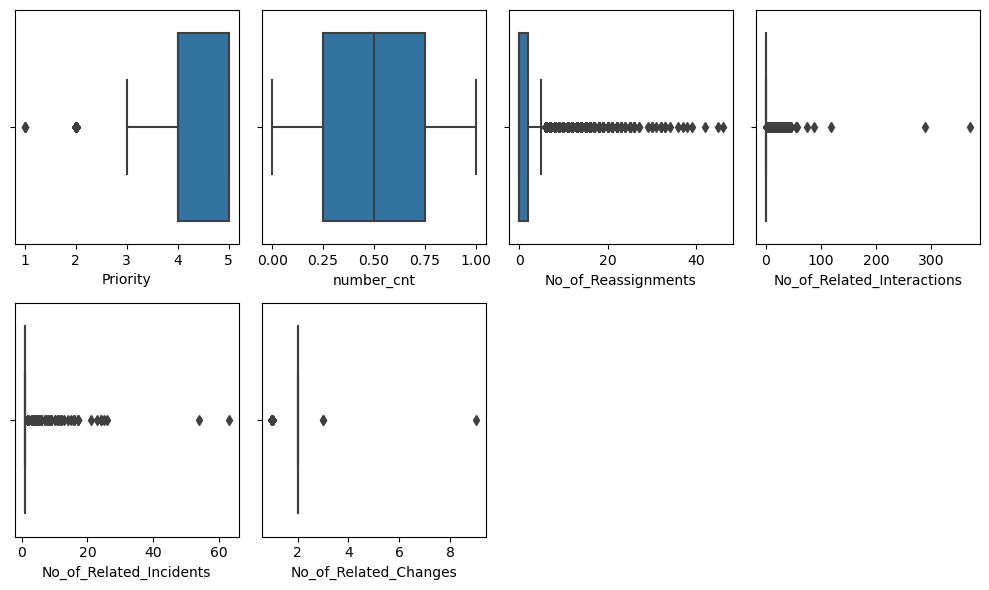

In [536]:
plt.figure(figsize=(10,6))
plotnumber=1
for col in num_data:
    if plotnumber<=8:
        ax=plt.subplot(2,4,plotnumber)
        sns.boxplot(x=data[col])
        plt.xlabel(col,fontsize=10)
    plotnumber+=1
plt.tight_layout()

# Box Plot for number_cnt

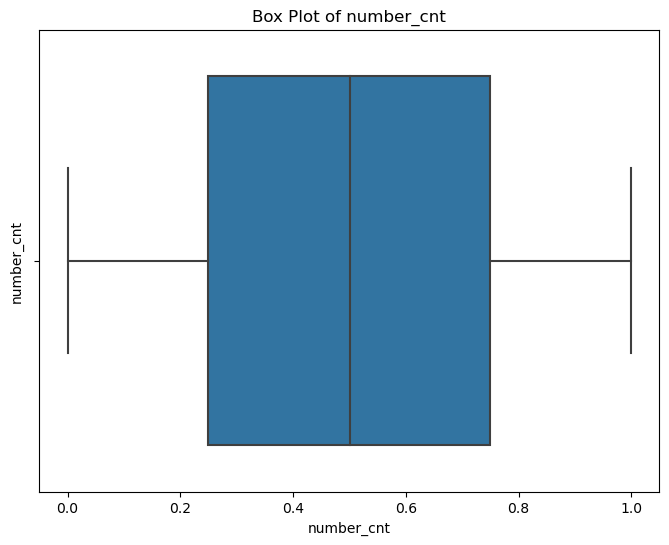

In [537]:
# Create a box plot for the 'number_cnt' column
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['number_cnt'])
plt.title('Box Plot of number_cnt')
plt.ylabel('number_cnt')
plt.show()

# Box Plot for No_of_Reassignments

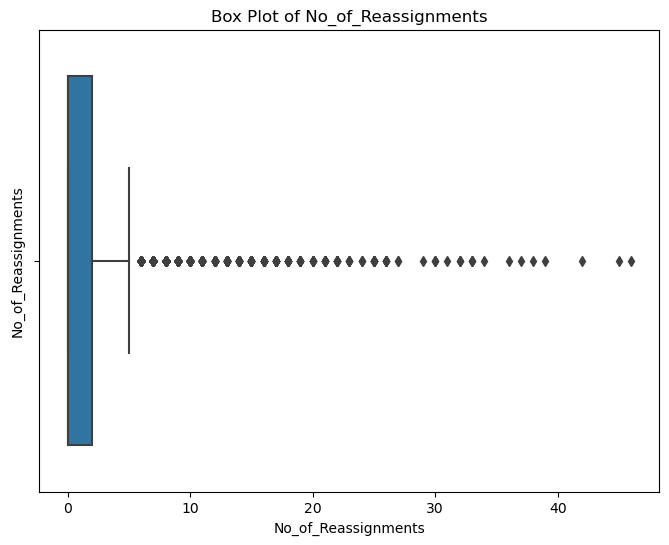

In [538]:
# Create a box plot for the 'number_cnt' column
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['No_of_Reassignments'])
plt.title('Box Plot of No_of_Reassignments')
plt.ylabel('No_of_Reassignments')
plt.show()

## Insights
* Most tickets (0 reassignments) are resolved without being reassigned.
* Reassignments decrease exponentially.
* There is a small peak at 3 reassignments.
* The graph is skewed to the right, meaning more tickets have a few reassignments than many reassignments.

## Outliers Handle for No_of_Reassignments

<Axes: xlabel='No_of_Reassignments', ylabel='Count'>

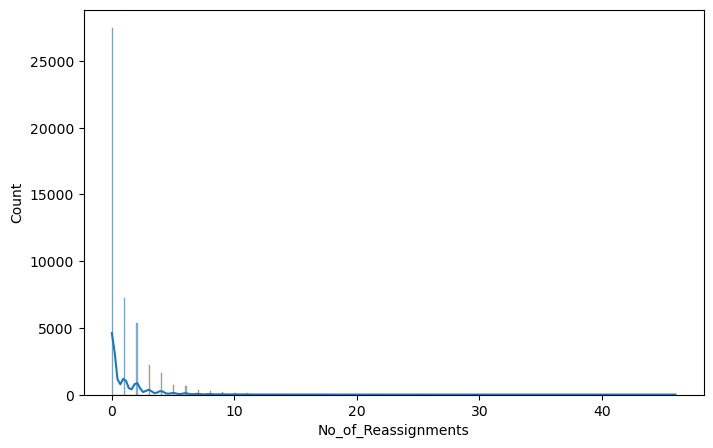

In [539]:
plt.figure(figsize=(8,5))
sns.histplot(data=data,x='No_of_Reassignments',kde=True)

In [540]:
Q1=data["No_of_Reassignments"].quantile(0.25)
print("lower_quartile",Q1)
Q3=data["No_of_Reassignments"].quantile(0.75)
print("upper_quartile",Q3)

lower_quartile 0.0
upper_quartile 2.0


In [541]:
IQR=Q3-Q1
IQR

2.0

In [542]:
lower_limit=Q1-1.5*IQR
print("lower_limit is",lower_limit)
upper_limit=Q3+1.5*IQR
print("upper_limit is",upper_limit)

lower_limit is -3.0
upper_limit is 5.0


In [543]:
data.loc[data["No_of_Reassignments"]>upper_limit]

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Handle_Time_hrs_conv
0,508,subapplication,Web Based Application,162,004,Closed,4,4,4,0.601292,incident,553,closed,26,2012-02-05 13:32:00,2013-11-04 13:50:00,2013-11-04 13:51:00,Other,1,007,2.0,2.0,15312.316667
1,124,application,Web Based Application,88,005,Closed,3,3,3,0.415050,incident,611,closed,33,2012-03-12 15:44:00,2013-12-02 12:36:00,2013-12-02 12:36:00,Software,1,011,1.0,2.0,15116.866667
3,124,application,Web Based Application,88,011,Closed,4,4,4,0.642927,incident,611,closed,13,2012-07-17 11:49:00,2013-11-14 09:31:00,2013-11-14 09:31:00,Operator error,1,025,1.0,2.0,11637.700000
10,124,application,Web Based Application,88,019,Closed,4,4,4,0.439909,incident,611,closed,6,2012-09-21 12:56:00,2013-11-08 14:23:00,2013-11-08 14:23:00,Software,1,040,1.0,1.0,9913.450000
11,124,application,Web Based Application,88,020,Closed,4,4,4,0.291928,incident,611,closed,8,2012-10-01 10:49:00,2013-11-08 14:18:00,2013-11-08 14:22:00,Software,1,042,1.0,2.0,9675.550000
13,124,application,Web Based Application,88,022,Closed,4,4,4,0.592713,incident,611,closed,17,2012-10-15 15:50:00,2013-10-10 12:53:00,2013-11-14 13:33:00,Software,1,043,2.0,2.0,9477.716667
17,535,subapplication,Web Based Application,66,031,Closed,4,4,4,0.151630,incident,928,closed,7,2012-12-05 15:17:00,2013-10-30 08:45:00,2013-10-30 08:45:00,Unknown,1,055,1.0,2.0,7889.466667
18,616,application,Desktop Application,92,033,Closed,3,3,3,0.860255,incident,430,closed,17,2012-12-07 14:34:00,2013-11-30 10:39:00,2013-11-30 10:39:00,Other,2,LUE,1.0,2.0,8588.083333
20,124,application,Web Based Application,88,035,Closed,4,4,4,0.428148,incident,611,closed,6,2012-12-24 16:31:00,2013-11-14 09:49:00,2013-11-14 09:49:00,Referred,1,058,2.0,2.0,7793.300000
23,124,application,Web Based Application,88,042,Closed,4,4,4,0.898982,incident,611,closed,12,2013-01-23 14:39:00,2013-11-08 15:21:00,2013-11-08 15:22:00,No error - works as designed,1,068,1.0,2.0,6936.716667


In [544]:
data.loc[data["No_of_Reassignments"]>upper_limit,"No_of_Reassignments"]=data["No_of_Reassignments"].median()

<Axes: xlabel='No_of_Reassignments'>

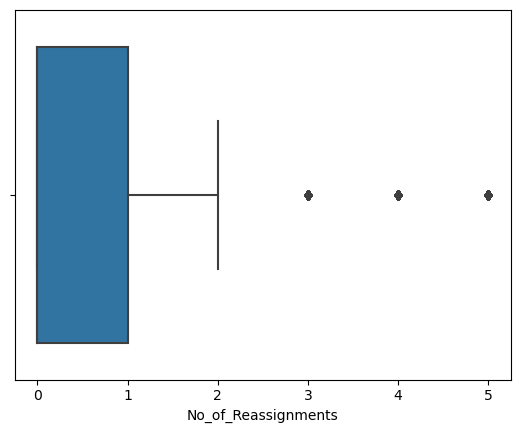

In [545]:
sns.boxplot(x=data.No_of_Reassignments)

## Box Plot for No_of_Related_Interactions

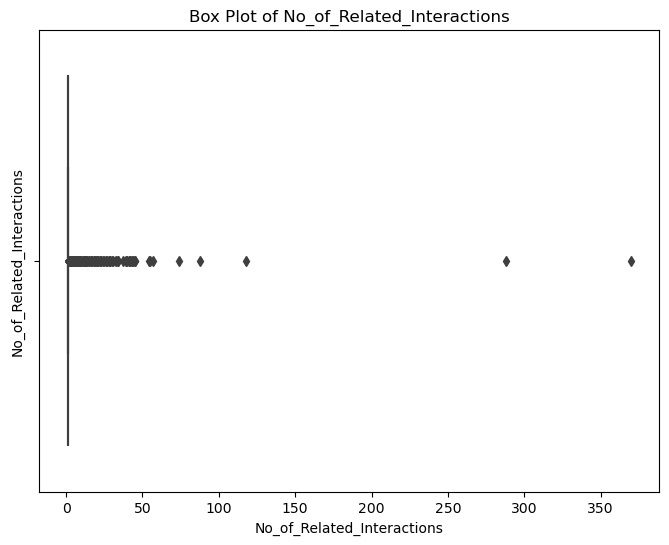

In [546]:
# Create a box plot for the 'No_of_Related_Interactions' column
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['No_of_Related_Interactions'])
plt.title('Box Plot of No_of_Related_Interactions')
plt.ylabel('No_of_Related_Interactions')
plt.show()

<Axes: xlabel='No_of_Related_Interactions', ylabel='Count'>

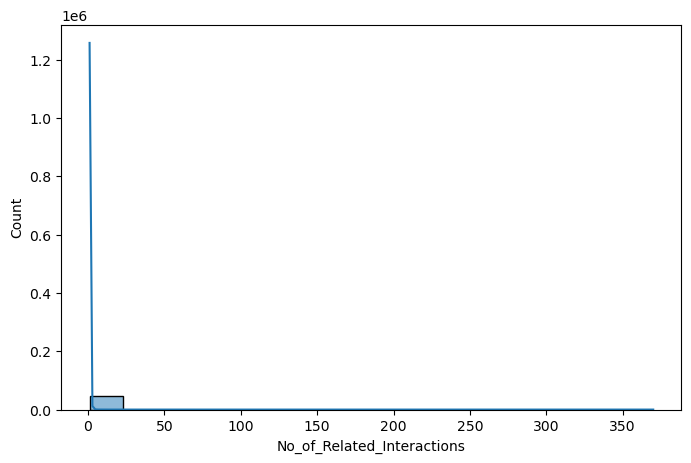

In [547]:
plt.figure(figsize=(8,5))
sns.histplot(data=data,x='No_of_Related_Interactions',kde=True)

## Insights
* Most tickets (0 reassignments) are resolved without being reassigned.
* Reassignments decrease exponentially.
* There is a small peak at 3 reassignments.
* The graph is skewed to the right, meaning more tickets have a few reassignments than many reassignments.

In [548]:
Q1 = data["No_of_Related_Interactions"].quantile(0.25)
print("lower_quantile",Q1)
Q3 = data["No_of_Related_Interactions"].quantile(0.75)
print("upper_quantile",Q3)

lower_quantile 1.0
upper_quantile 1.0


In [549]:
IQR=Q3 - Q1
IQR

0.0

In [550]:
lower_limit = Q1-1.5*IQR
print("lower_limit is",lower_limit)
upper_limit = Q3+1.5*IQR
print("upper_limit is",upper_limit)

lower_limit is 1.0
upper_limit is 1.0


In [551]:
data.loc[data["No_of_Related_Interactions"]>upper_limit]

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Handle_Time_hrs_conv
12,082,application,Web Based Application,55,021,Closed,4,4,4,0.776486,incident,401,closed,5,2012-10-02 12:12:00,2014-02-04 09:38:00,2014-02-04 09:38:00,Software,2,LUE,1.0,2.0,11757.433333
18,616,application,Desktop Application,92,033,Closed,3,3,3,0.860255,incident,430,closed,0,2012-12-07 14:34:00,2013-11-30 10:39:00,2013-11-30 10:39:00,Other,2,LUE,1.0,2.0,8588.083333
19,082,application,Web Based Application,55,034,Closed,5,5,5,0.663615,incident,401,closed,5,2012-12-10 14:44:00,2014-03-28 14:20:00,2014-03-28 14:20:00,Other,2,LUE,1.0,2.0,11351.600000
27,662,application,Server Based Application,71,048,Closed,5,5,5,0.748361,request for information,524,closed,0,2013-02-06 14:07:00,2013-10-17 14:00:00,2013-10-17 14:00:00,No error - works as designed,2,LUE,1.0,2.0,6071.883333
29,263,application,Server Based Application,72,053,Closed,5,5,5,0.853722,request for information,104,closed,2,2013-02-18 11:59:00,2013-10-10 12:53:00,2013-12-04 14:00:00,Other,2,LUE,1.0,2.0,6938.016667
32,433,subapplication,Web Based Application,73,057,Closed,4,4,4,0.121927,incident,791,closed,1,2013-02-25 16:03:00,2014-03-12 10:15:00,2014-03-12 10:16:00,Other,3,LUE,1.0,2.0,9114.216667
34,124,application,Web Based Application,88,059,Closed,4,4,4,0.153093,incident,611,closed,2,2013-02-28 12:23:00,2013-12-03 10:36:00,2013-12-03 10:36:00,Other,2,LUE,1.0,2.0,6670.216667
36,431,subapplication,Web Based Application,66,061,Closed,5,5,5,0.433426,request for information,603,closed,3,2013-03-01 10:19:00,2013-10-10 12:53:00,2014-01-27 12:44:00,Software,2,LUE,1.0,2.0,7970.416667
39,314,application,Server Based Application,54,067,Closed,5,5,5,0.719923,incident,650,closed,0,2013-03-11 09:08:00,2013-10-09 13:41:00,2013-10-09 13:41:00,Other,2,LUE,1.0,2.0,5092.550000
41,124,application,Web Based Application,88,071,Closed,4,4,4,0.640789,incident,611,closed,4,2013-03-15 15:25:00,2014-01-06 11:50:00,2014-01-06 11:51:00,Other,2,LUE,1.0,2.0,7124.433333


In [552]:
data.loc[data["No_of_Related_Interactions"]>upper_limit,"No_of_Related_Interactions"]=data["No_of_Related_Interactions"].median()

<Axes: xlabel='No_of_Related_Interactions'>

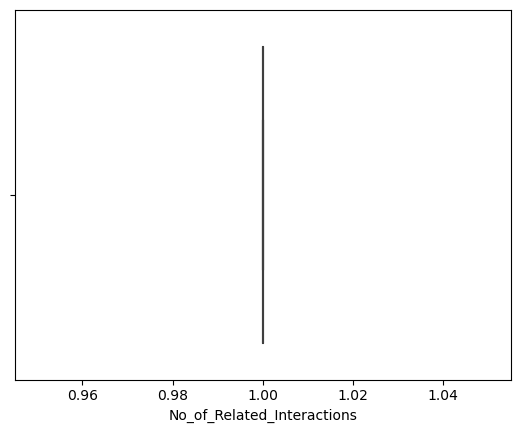

In [553]:
sns.boxplot(x=data.No_of_Related_Interactions)

* Median number of related interactions is 1.
* 75% of tickets have 3 or fewer related interactions.
* There are a few outliers with many related interactions (up to 20).

## Box Plot for No_of_Related_Incidents

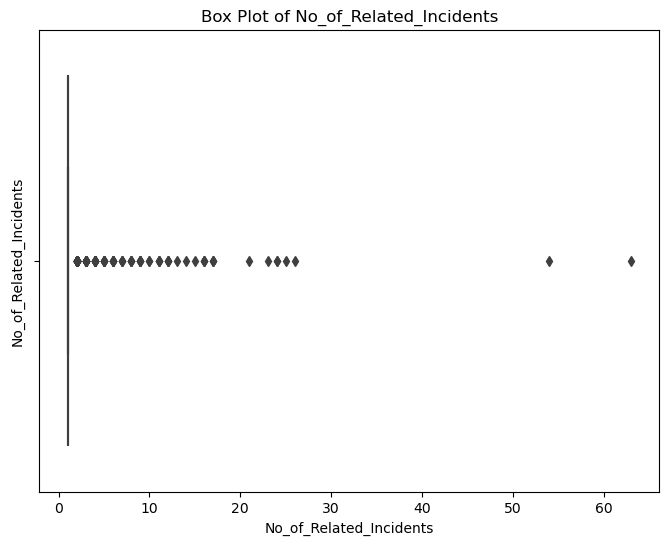

In [554]:
# Create a box plot for the 'No_of_Related_Incidents' column
plt.figure(figsize=(8,6))
sns.boxplot(x=data['No_of_Related_Incidents'])
plt.title('Box Plot of No_of_Related_Incidents')
plt.ylabel('No_of_Related_Incidents')
plt.show()

<Axes: xlabel='No_of_Related_Incidents', ylabel='Count'>

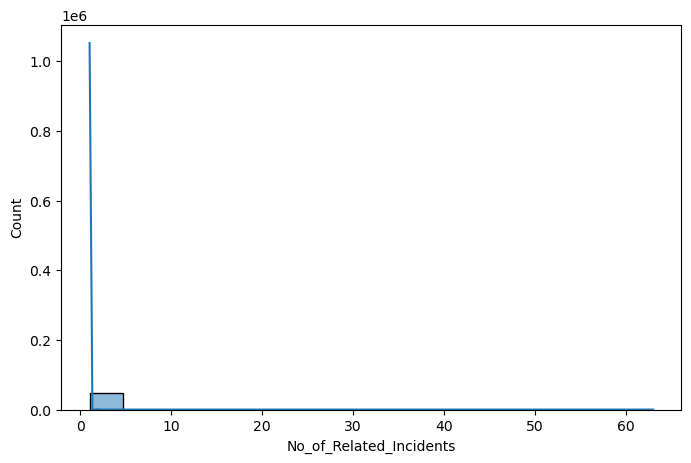

In [555]:
plt.figure(figsize=(8,5))
sns.histplot(data=data,x='No_of_Related_Incidents',kde=True)

## Insights
* The most common number of related incidents is 1.
* The distribution of the number of related incidents is skewed to the right, meaning that there are more incidents with fewer     related incidents than incidents with more related incidents. *The maximum number of related incidents is 53.

In [556]:
Q1=data["No_of_Related_Incidents"].quantile(0.25)
print("lower_quartile",Q1)
Q3=data["No_of_Related_Incidents"].quantile(0.75)
print("upper_quartile",Q3)

lower_quartile 1.0
upper_quartile 1.0


In [557]:
IQR=Q3-Q1
IQR

0.0

In [558]:
lower_limit=Q1-1.5*IQR
print("lower_limit is",lower_limit)
upper_limit=Q3+1.5*IQR
print("upper_limit is",upper_limit)

lower_limit is 1.0
upper_limit is 1.0


In [559]:
data.loc[data["No_of_Related_Incidents"]>upper_limit]

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Handle_Time_hrs_conv
0,508,subapplication,Web Based Application,162,004,Closed,4,4,4,0.601292,incident,553,closed,0,2012-02-05 13:32:00,2013-11-04 13:50:00,2013-11-04 13:51:00,Other,1,007,2.0,2.0,15312.316667
13,124,application,Web Based Application,88,022,Closed,4,4,4,0.592713,incident,611,closed,0,2012-10-15 15:50:00,2013-10-10 12:53:00,2013-11-14 13:33:00,Software,1,043,2.0,2.0,9477.716667
15,082,application,Web Based Application,55,024,Closed,4,4,4,0.701705,incident,401,closed,3,2012-10-23 12:01:00,2013-11-08 14:57:00,2013-11-08 14:58:00,Other,1,046,2.0,2.0,9146.950000
20,124,application,Web Based Application,88,035,Closed,4,4,4,0.428148,incident,611,closed,0,2012-12-24 16:31:00,2013-11-14 09:49:00,2013-11-14 09:49:00,Referred,1,058,2.0,2.0,7793.300000
119,033,application,Standard Application,66,168,Closed,5,5,5,0.875886,incident,575,closed,2,2013-06-26 12:09:00,2013-11-18 09:14:00,2013-11-18 09:15:00,Software,1,195,2.0,1.0,3477.100000
224,462,application,Server Based Application,73,285,Closed,4,4,4,0.835698,incident,681,closed,0,2013-08-12 11:03:00,2013-11-18 10:34:00,2013-11-18 10:34:00,Software,1,LUE,2.0,2.0,2351.516667
266,082,application,Web Based Application,55,331,Closed,4,4,4,0.474401,incident,401,closed,0,2013-08-26 15:38:00,2013-12-31 13:48:00,2013-12-31 13:48:00,Other,1,508,2.0,1.0,3046.166667
306,607,application,Server Based Application,263,375,Closed,5,5,5,0.120110,request for information,592,closed,0,2013-09-03 08:01:00,2013-12-02 15:46:00,2013-12-02 15:46:00,Other,1,568,2.0,2.0,2167.750000
316,033,application,Server Based Application,118,385,Closed,5,5,5,0.278676,incident,172,closed,5,2013-09-04 11:46:00,2013-10-10 12:53:00,2013-12-17 10:56:00,Unknown,1,582,23.0,2.0,2495.166667
347,124,application,Web Based Application,88,418,Closed,3,3,3,0.659781,incident,611,closed,0,2013-09-09 12:56:00,2014-01-29 14:56:00,2014-01-29 14:56:00,Software,1,617,2.0,2.0,3410.000000


In [560]:
data.loc[data["No_of_Related_Incidents"]>upper_limit,"No_of_Related_Incidents"]=data["No_of_Related_Incidents"].median()

<Axes: xlabel='No_of_Related_Incidents'>

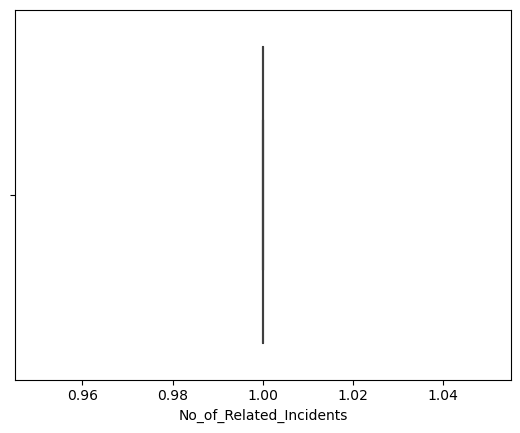

In [561]:
sns.boxplot(x=data.No_of_Related_Incidents)

## Box Plot for No_of_Related_Changes

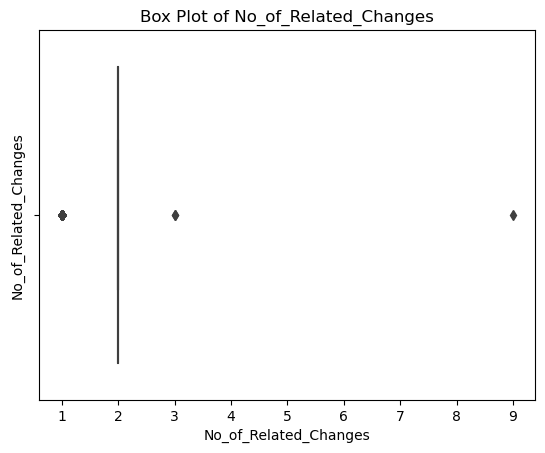

In [562]:
# Create a box plot for the 'No_of_Related_Changes' column
sns.boxplot(x=data['No_of_Related_Changes'])
plt.title('Box Plot of No_of_Related_Changes')
plt.ylabel('No_of_Related_Changes')
plt.show()

<Axes: xlabel='No_of_Related_Changes', ylabel='Count'>

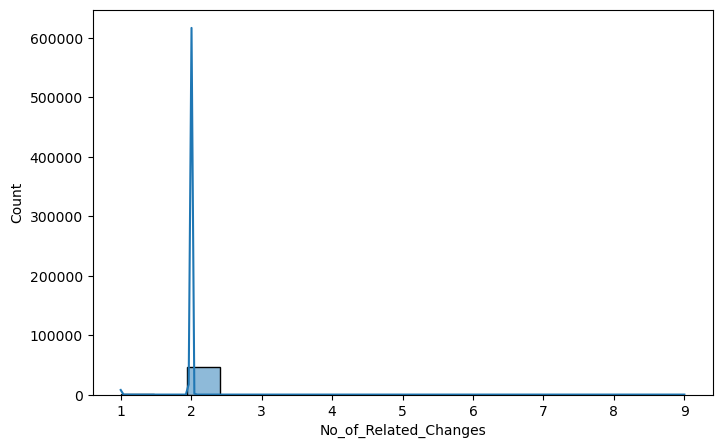

In [563]:
plt.figure(figsize=(8,5))
sns.histplot(data=data,x='No_of_Related_Changes',kde=True)

## Insights
* The most common number of related changes is 1.
* The distribution of the number of related changes is skewed to the right, meaning that there are more changes with fewer         related changes than changes with more related changes.
* The maximum number of related changes is 53.
* The median number of related changes is 2.
* The 75th percentile of the number of related changes is 4.
* The 95th percentile of the number of related changes is 10.

In [564]:
Q1=data["No_of_Related_Changes"].quantile(0.25)
print("lower_quartile",Q1)
Q3=data["No_of_Related_Changes"].quantile(0.75)
print("upper_quartile",Q3)

lower_quartile 2.0
upper_quartile 2.0


In [565]:
IQR=Q3-Q1
IQR

0.0

In [566]:
lower_limit=Q1-1.5*IQR
print("lower_limit is",lower_limit)
upper_limit=Q3+1.5*IQR
print("upper_limit is",upper_limit)

lower_limit is 2.0
upper_limit is 2.0


In [567]:
data.loc[data["No_of_Related_Changes"]>upper_limit]

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,Category,KB_number,Alert_Status,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Handle_Time_hrs_conv
360,124,application,Web Based Application,88,433,Closed,4,4,4,0.261065,incident,611,closed,0,2013-09-10 13:09:00,2013-12-05 10:16:00,2013-12-05 10:17:00,Unknown,1,643,1.0,3.0,2061.133333
24182,479,subapplication,Web Based Application,15,438,Closed,3,3,3,0.870326,incident,456,closed,4,2013-12-30 11:40:00,2014-01-20 12:06:00,2014-01-20 12:06:00,Software,1,LUE,1.0,9.0,504.433333
42082,005,application,Web Based Application,302,443,Closed,4,4,4,0.582007,incident,40,closed,2,2014-03-10 16:17:00,2014-03-26 16:28:00,2014-03-26 16:28:00,Software,1,449,1.0,3.0,384.183333


In [568]:
data.loc[data["No_of_Related_Changes"]>upper_limit,"No_of_Related_Changes"]=data["No_of_Related_Changes"].median()

<Axes: xlabel='No_of_Related_Changes'>

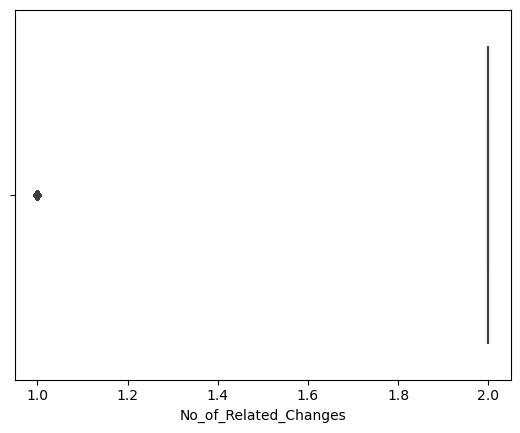

In [569]:
sns.boxplot(x=data.No_of_Related_Changes)

##  EXPLORATORY DATA ANALYSIS 

-Using EDA :Visualize fesatures, insight /observation from the data

## Univariate Analysis - Numerical Data

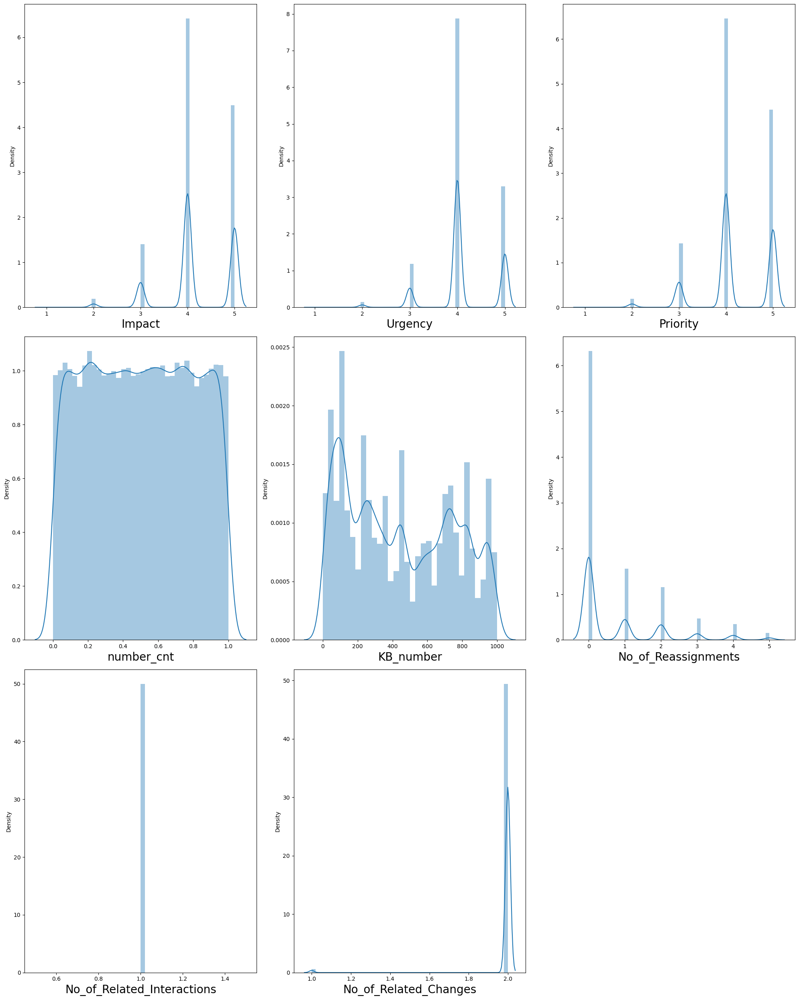

In [570]:
feature_1 = data[['Impact','Urgency', 'Priority', 'number_cnt', 'KB_number', 'No_of_Reassignments', 'No_of_Related_Interactions','No_of_Related_Changes']]
plt.figure(figsize=(20,25)) 
plot1=1
for column in feature_1:
    if plot1<=9:    
        plt.subplot(3,3,plot1) 
        sns.distplot(x=feature_1[column])
        plt.xlabel(column,fontsize=20)
    plot1+=1
plt.tight_layout()
plt.show()

### Visualizing the categorical columns

In [571]:
categorical_columns=data[["Status","Impact","Urgency","Priority","Category","Alert_Status"]]

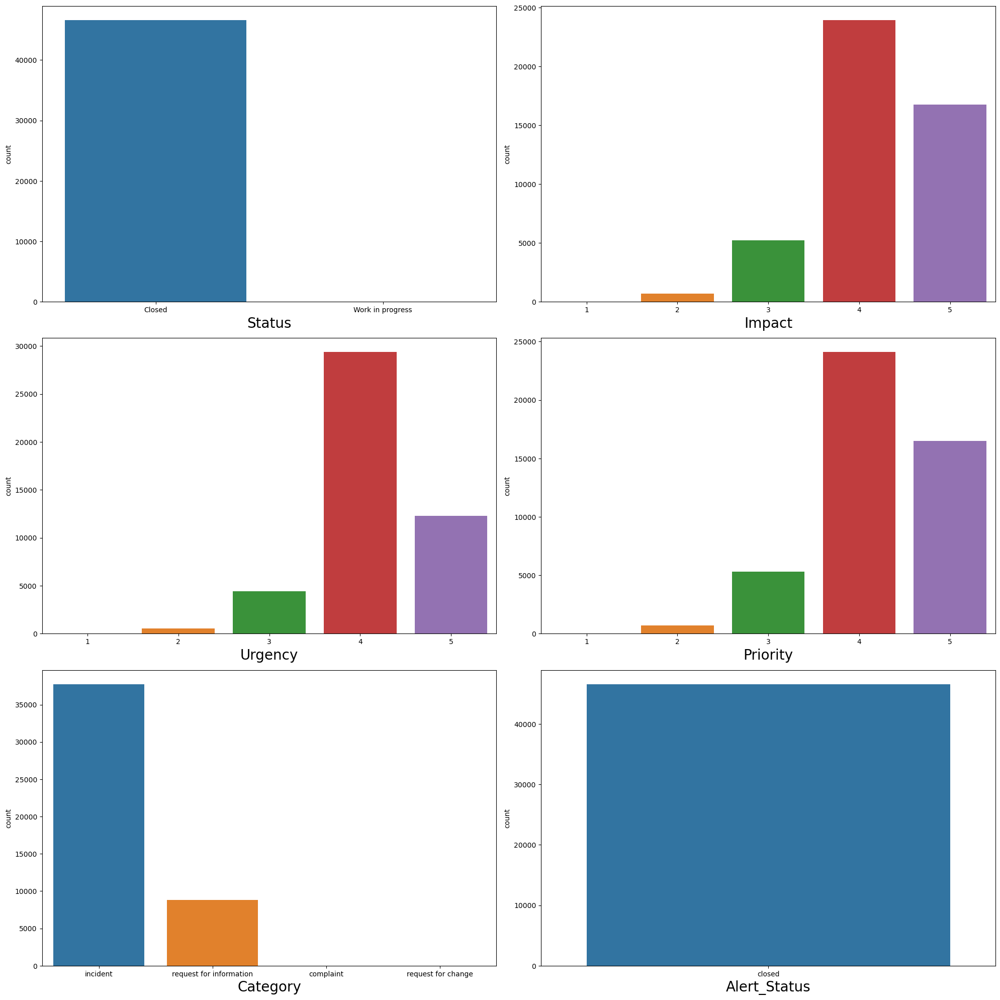

In [572]:
plt.figure(figsize=(20,20))
plotn=1
for column in categorical_columns:
    if plotn<7:
        plt.subplot(3,2,plotn)
        sns.countplot(x=categorical_columns[column])
        plt.xlabel(column,fontsize=20)
    plotn+=1
plt.tight_layout()
plt.show()

## Bivariate Analysis

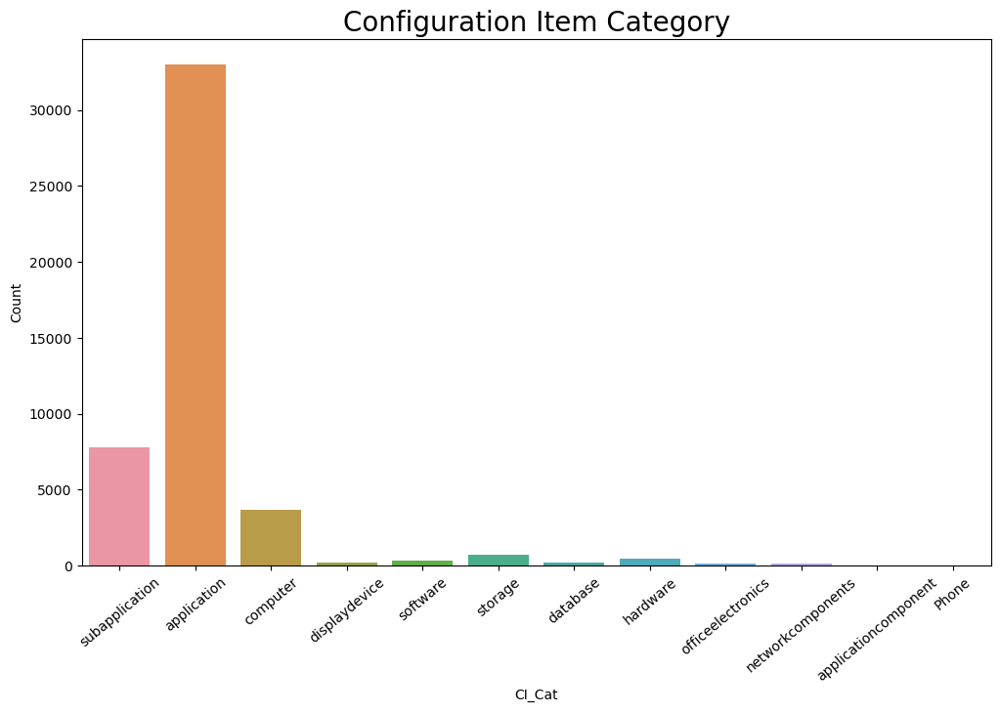

In [573]:
plt.figure(figsize=(12,7))
sns.countplot(x="CI_Cat",data=data)
plt.xlabel("CI_Cat")
plt.ylabel("Count")
plt.title("Configuration Item Category", fontsize = 20)
plt.xticks(rotation=40)
plt.show()

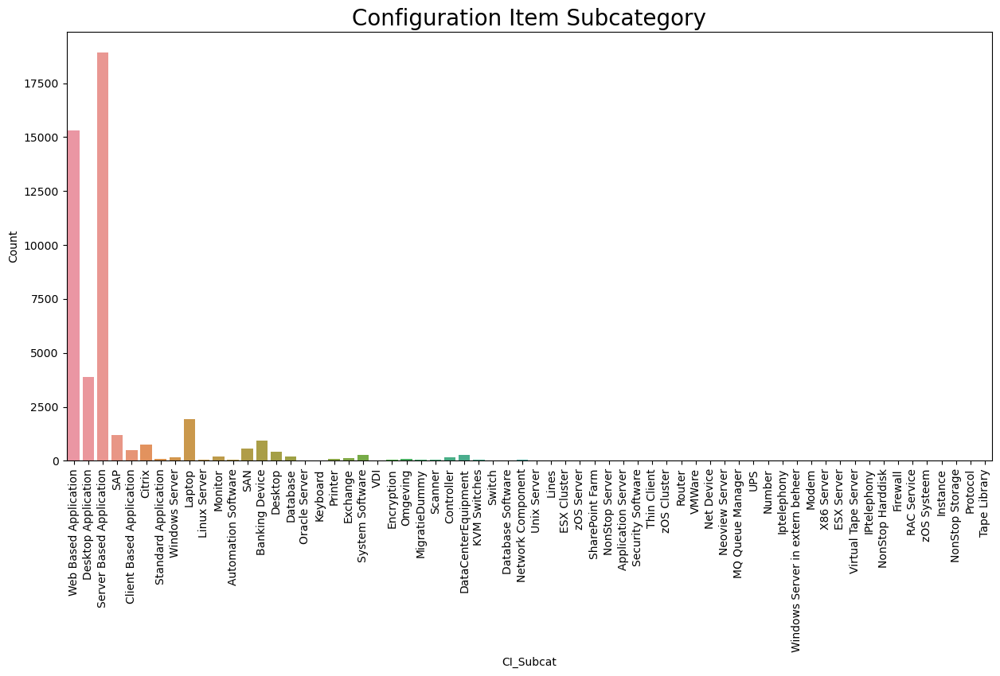

In [574]:
plt.figure(figsize=(15,7))
sns.countplot(x="CI_Subcat",data=data)
plt.xlabel("CI_Subcat")
plt.ylabel("Count")
plt.title("Configuration Item Subcategory", fontsize = 20)
plt.xticks(rotation=90)
plt.show()

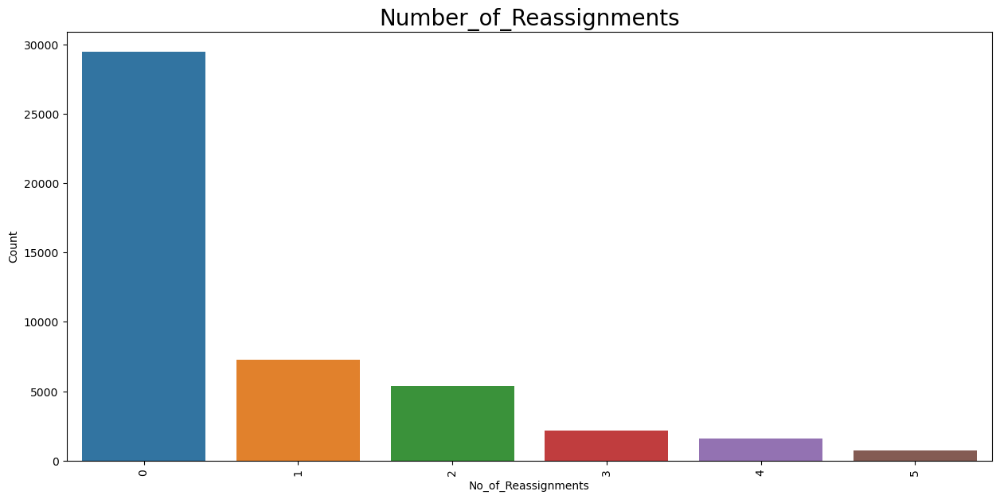

In [575]:
plt.figure(figsize=(15,7))
sns.countplot(x="No_of_Reassignments",data=data)
plt.xlabel("No_of_Reassignments")
plt.ylabel("Count")
plt.title("Number_of_Reassignments", fontsize = 20)
plt.xticks(rotation=90)
plt.show()

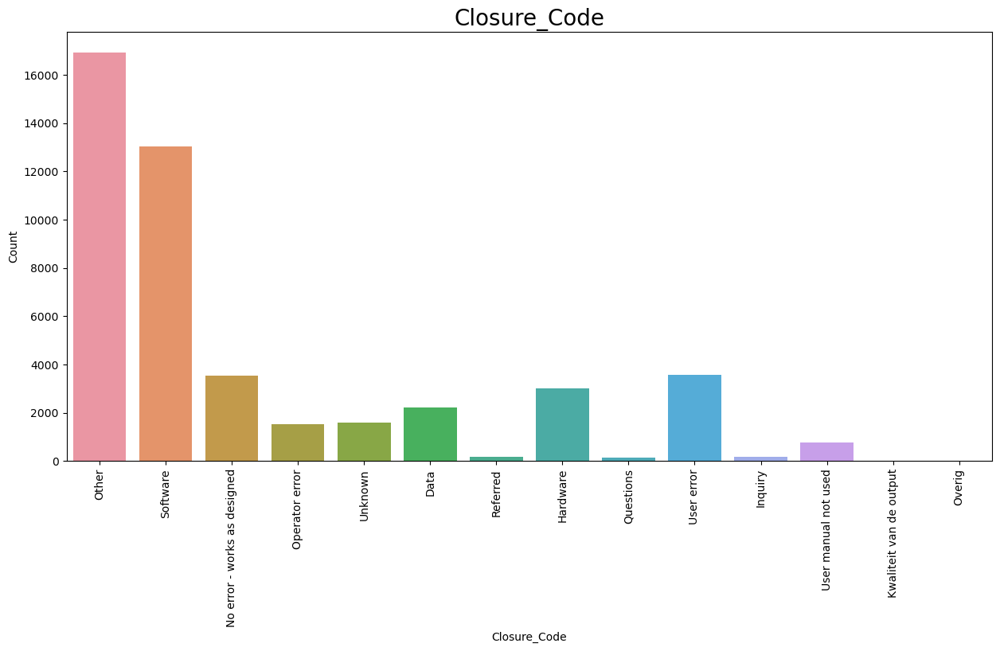

In [576]:
plt.figure(figsize=(15,7))
sns.countplot(x="Closure_Code",data=data)
plt.xlabel("Closure_Code")
plt.ylabel("Count")
plt.title("Closure_Code", fontsize = 20)
plt.xticks(rotation=90)
plt.show()

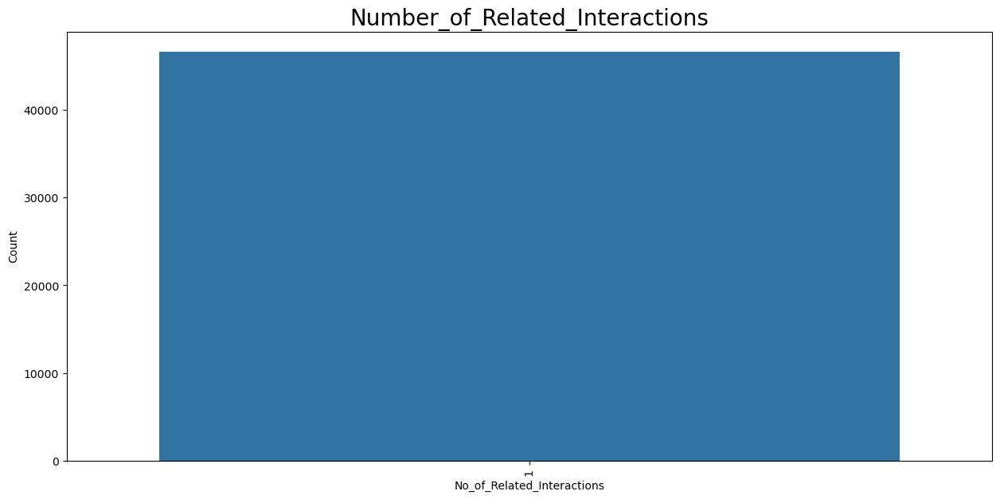

In [577]:
plt.figure(figsize=(15,7))
sns.countplot(x="No_of_Related_Interactions",data=data)
plt.xlabel("No_of_Related_Interactions")
plt.ylabel("Count")
plt.title("Number_of_Related_Interactions", fontsize = 20)
plt.xticks(rotation=90)
plt.show()

## Multivarite Analysis

<Figure size 4000x4500 with 0 Axes>

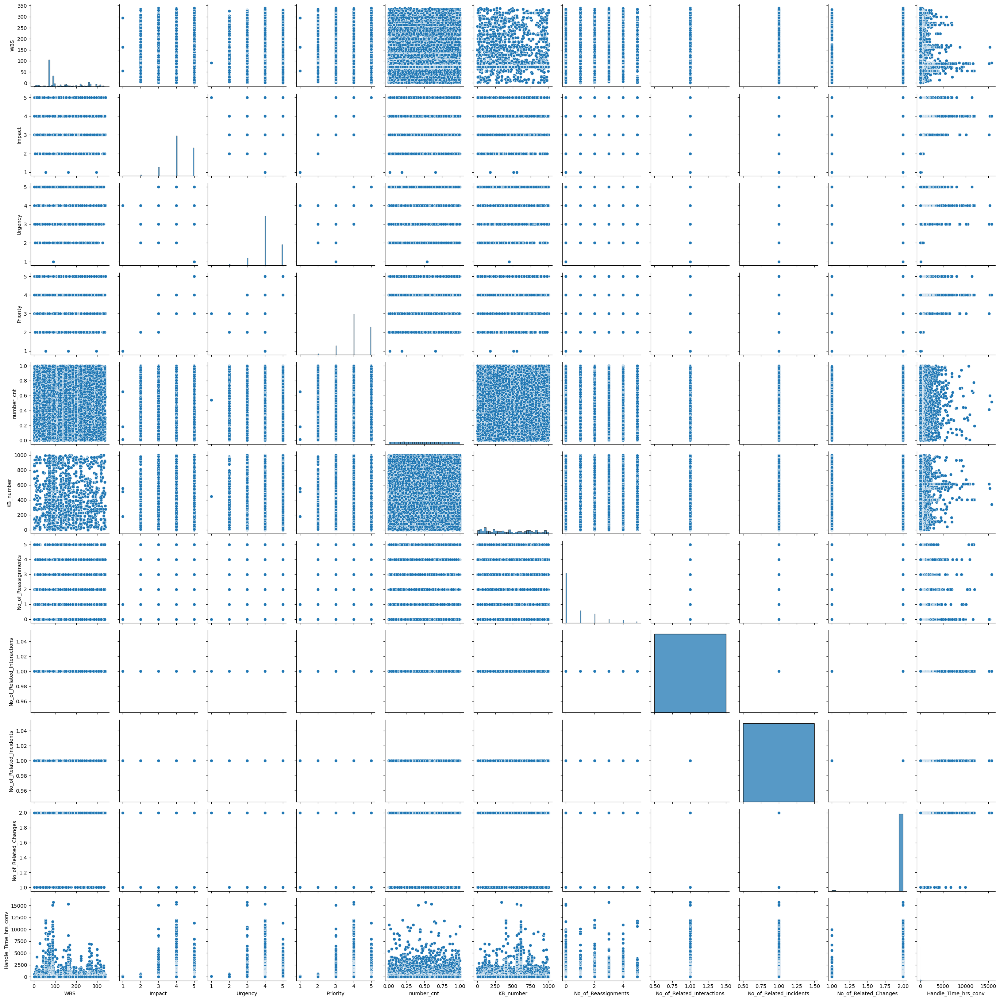

In [122]:
plt.figure(figsize=(40,45))
sns.pairplot(data)
plt.tight_layout()

## FEATURE ENGINEERING

In [578]:
# Label encoding using scikit-learn
label = LabelEncoder()
data["CI_Cat"] = label.fit_transform(data['CI_Cat'])
data["CI_Subcat"] = label.fit_transform(data['CI_Subcat'])
data["Status"] = label.fit_transform(data['Status'])
data["Category"] = label.fit_transform(data['Category'])
data["Closure_Code"] = label.fit_transform(data['Category'])
data["Impact"] = label.fit_transform(data['Category'])
data["Urgency"] = label.fit_transform(data['Category'])
data["Alert_Status"] = label.fit_transform(data['Alert_Status'])

In [579]:
data["CI_Cat"].unique()

array([11,  1,  3,  5,  9, 10,  4,  6,  8,  7,  2,  0])

In [580]:
data["CI_Subcat"].unique()

array([57, 10, 45, 42,  4,  3, 47, 58, 21, 23, 27,  1, 41,  2,  9,  7, 36,
       20, 37, 14, 49, 54, 13, 35, 25, 43,  5,  6, 19, 48,  8, 30, 53, 22,
       11, 62, 46, 32,  0, 44, 51, 61, 40, 55, 29, 28, 24, 52, 34, 18, 59,
       26, 60, 12, 56, 16, 31, 15, 39, 63, 17, 33, 38, 50])

In [581]:
data["Status"].unique()

array([0, 1])

In [582]:
data["Category"].unique()

array([1, 3, 0, 2])

In [583]:
data["Closure_Code"].unique()

array([1, 3, 0, 2], dtype=int64)

In [584]:
data["Urgency"].unique()

array([1, 3, 0, 2], dtype=int64)

In [585]:
data["Impact"].unique()

array([1, 3, 0, 2], dtype=int64)

In [586]:
data.shape

(46605, 23)

## FEATURE SELECTION

#### 1.DROP UNIQUE AND CONSTANT FEATURE

In [587]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46605 entries, 0 to 46605
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   CI_Name                     46605 non-null  object        
 1   CI_Cat                      46605 non-null  int32         
 2   CI_Subcat                   46605 non-null  int32         
 3   WBS                         46605 non-null  int32         
 4   Incident_ID                 46605 non-null  object        
 5   Status                      46605 non-null  int32         
 6   Impact                      46605 non-null  int64         
 7   Urgency                     46605 non-null  int64         
 8   Priority                    46605 non-null  int32         
 9   number_cnt                  46605 non-null  float64       
 10  Category                    46605 non-null  int32         
 11  KB_number                   46605 non-null  int32         


In [588]:
data.drop(["WBS","Status","KB_number","number_cnt","CI_Name","Incident_ID","Alert_Status","No_of_Related_Interactions","No_of_Related_Incidents","Related_Interaction"],axis=1,inplace=True)

In [589]:
data_no_duplicates = data.drop_duplicates()

In [590]:
data.corr()

,CI_Cat,CI_Subcat,Impact,Urgency,Priority,Category,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Changes,Handle_Time_hrs_conv
CI_Cat,1.000000,0.199088,-0.105496,-0.105496,-0.051441,-0.105496,-0.094444,0.032588,0.030190,0.024506,-0.105496,-0.004751,-0.027963
CI_Subcat,0.199088,1.000000,0.030186,0.030186,0.082222,0.030186,-0.005905,0.023106,0.080257,0.040633,0.030186,-0.006209,0.045756
Impact,-0.105496,0.030186,1.000000,1.000000,0.476697,1.000000,0.095214,-0.050170,-0.029736,-0.048306,1.000000,0.037793,0.013220
Urgency,-0.105496,0.030186,1.000000,1.000000,0.476697,1.000000,0.095214,-0.050170,-0.029736,-0.048306,1.000000,0.037793,0.013220
Priority,-0.051441,0.082222,0.476697,0.476697,1.000000,0.476697,0.093408,-0.026469,0.041316,-0.014475,0.476697,0.045171,0.038023
Category,-0.105496,0.030186,1.000000,1.000000,0.476697,1.000000,0.095214,-0.050170,-0.029736,-0.048306,1.000000,0.037793,0.013220
No_of_Reassignments,-0.094444,-0.005905,0.095214,0.095214,0.093408,0.095214,1.000000,-0.058200,-0.000087,-0.007124,0.095214,0.022109,0.153267
Open_Time,0.032588,0.023106,-0.050170,-0.050170,-0.026469,-0.050170,-0.058200,1.000000,0.888686,0.941972,-0.050170,0.023875,-0.322372
Resolved_Time,0.030190,0.080257,-0.029736,-0.029736,0.041316,-0.029736,-0.000087,0.888686,1.000000,0.945754,-0.029736,0.015828,0.019854
Close_Time,0.024506,0.040633,-0.048306,-0.048306,-0.014475,-0.048306,-0.007124,0.941972,0.945754,1.000000,-0.048306,0.016310,0.014104


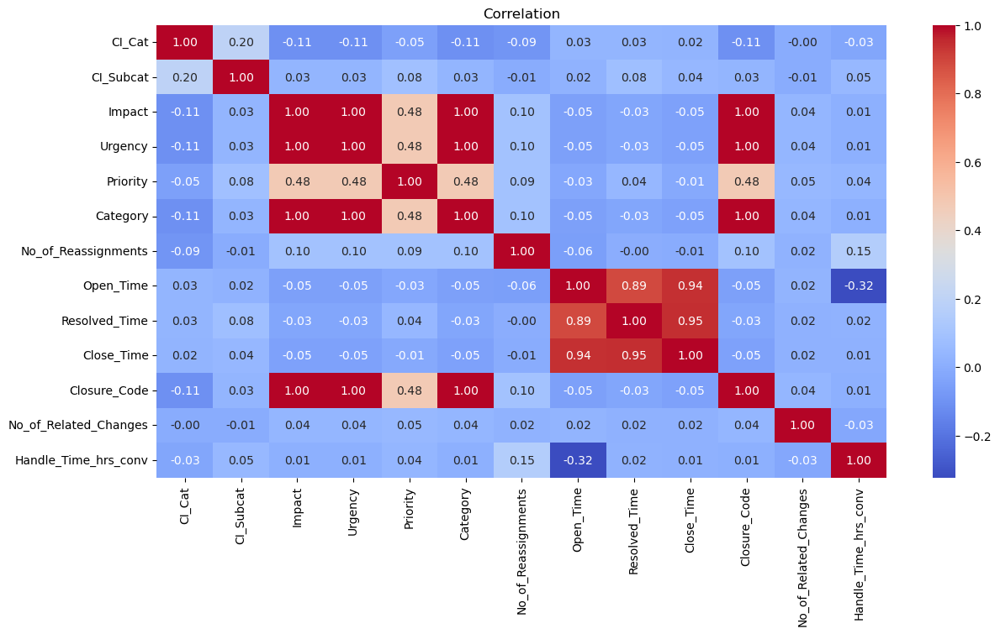

In [591]:
# Create a correlation heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(data.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation')
plt.show()

In [592]:
data.head(5)

,CI_Cat,CI_Subcat,Impact,Urgency,Priority,Category,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Changes,Handle_Time_hrs_conv
0,11,57,1,1,4,1,0,2012-02-05 13:32:00,2013-11-04 13:50:00,2013-11-04 13:51:00,1,2.0,15312.316667
1,1,57,1,1,3,1,0,2012-03-12 15:44:00,2013-12-02 12:36:00,2013-12-02 12:36:00,1,2.0,15116.866667
2,1,10,3,3,4,3,3,2012-03-29 12:36:00,2014-01-13 15:12:00,2014-01-13 15:13:00,3,2.0,15722.616667
3,1,57,1,1,4,1,0,2012-07-17 11:49:00,2013-11-14 09:31:00,2013-11-14 09:31:00,1,2.0,11637.700000
4,1,57,1,1,4,1,2,2012-08-10 11:01:00,2013-11-08 13:55:00,2013-11-08 13:55:00,1,2.0,10922.900000


## MODEL EVALUATION 

## Task 1

### 1) Predicting High Priority Tickets: To predict priority 1 & 2 tickets, so that they can take preventive measures or fix the problem before it surfaces.

In [593]:
df=data.copy()

In [594]:
x=df.drop(["Priority","Urgency","Resolved_Time","Open_Time","Close_Time"],axis=1)

In [595]:
x.head(5)

,CI_Cat,CI_Subcat,Impact,Category,No_of_Reassignments,Closure_Code,No_of_Related_Changes,Handle_Time_hrs_conv
0,11,57,1,1,0,1,2.0,15312.316667
1,1,57,1,1,0,1,2.0,15116.866667
2,1,10,3,3,3,3,2.0,15722.616667
3,1,57,1,1,0,1,2.0,11637.700000
4,1,57,1,1,2,1,2.0,10922.900000


In [596]:
y=df["Priority"].map({1:1,2:1,3:2,4:2,5:2})

In [597]:
y.value_counts()#Priority 1 and 2

Priority
2    45905
1      700
Name: count, dtype: int64

In [598]:
data.Priority.value_counts()

Priority
4    24097
5    16485
3     5323
2      697
1        3
Name: count, dtype: int64

In [599]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.20,random_state=42)

In [600]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(37284, 8)
(9321, 8)
(37284,)
(9321,)


In [601]:
from sklearn.preprocessing import StandardScaler

In [602]:
# Standardize features (optional but recommended)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

## MODEL EVALUATION

## Logistic Regression

In [603]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(X_train_scaled,y_train)

LogisticRegression()

In [604]:
Prediction_of_testdata=model.predict(X_test_scaled)#Test Prediction
x_train_pred=model.predict(X_train_scaled)#Tranning Prediction

In [605]:
print("Test Accuracy : " ,accuracy_score(y_test,Prediction_of_testdata))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_pred))#Tranning Accuracy

Test Accuracy :  0.9822980366913421
Traning Accuracy :  0.9856506812573759


LogisticRegression Accuracy Score:  0.9822980366913421
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



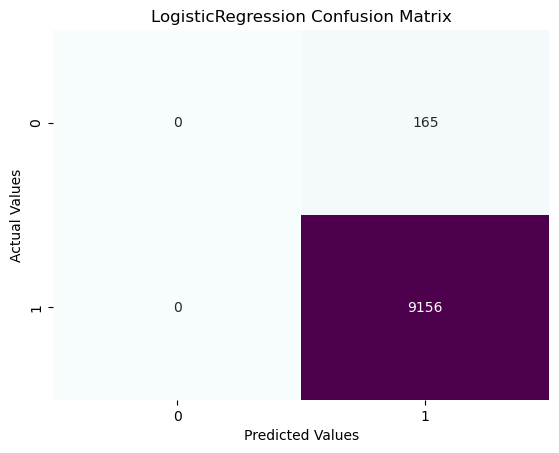

In [606]:
def my_confusion_matrix(y_test, Prediction_of_testdata, plt_title):
    cm=confusion_matrix(y_test, Prediction_of_testdata)
    print(classification_report(y_test, Prediction_of_testdata))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,Prediction_of_testdata))
cm_rfc=my_confusion_matrix(y_test, Prediction_of_testdata, 'LogisticRegression Confusion Matrix')

## Naive Bayes

In [607]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train_scaled, y_train)

GaussianNB()

In [608]:
y_pred_gnb=gnb.predict(X_test_scaled)#Test Prediction
x_train_preGNB=gnb.predict(X_train_scaled)#Traning Prediction

In [609]:
print("Test Accuracy : " ,accuracy_score(y_test,y_pred_gnb))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preGNB))#Traning accuracy

Test Accuracy :  0.5250509601974037
Traning Accuracy :  0.5294496298680399


 Naive Bayes Accuracy Score:  0.5250509601974037
              precision    recall  f1-score   support

           1       0.03      0.90      0.06       165
           2       1.00      0.52      0.68      9156

    accuracy                           0.53      9321
   macro avg       0.51      0.71      0.37      9321
weighted avg       0.98      0.53      0.67      9321



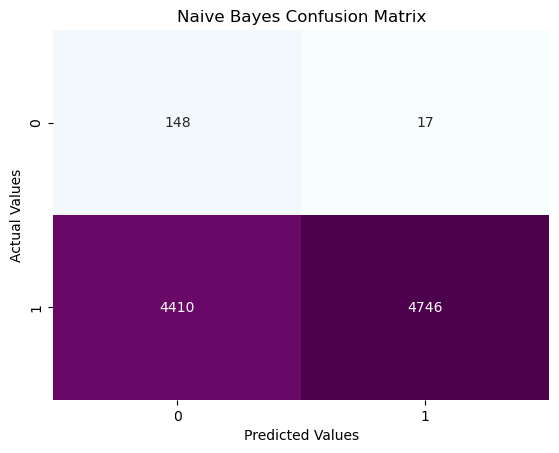

In [610]:
def my_confusion_matrix(y_test, y_pred_gnb, plt_title):
    cm=confusion_matrix(y_test, y_pred_gnb)
    print(classification_report(y_test, y_pred_gnb))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Naive Bayes Accuracy Score: ',accuracy_score(y_test,y_pred_gnb))
cm_rfc=my_confusion_matrix(y_test, y_pred_gnb, 'Naive Bayes Confusion Matrix')

## KNN Classifier

In [611]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3,leaf_size=25)
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(leaf_size=25, n_neighbors=3)

In [612]:
y_pred_knn=knn.predict(X_test_scaled)#Test prediction
x_train_preKNN=knn.predict(X_train_scaled)#Traning Prediction

In [613]:
print("Test Accuracy : " ,accuracy_score(y_test,y_pred_knn))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preKNN))#Traning Accuracy

Test Accuracy :  0.9836927368308122
Traning Accuracy :  0.990639416371634


 KNN Classifier Accuracy Score:  0.9836927368308122
              precision    recall  f1-score   support

           1       0.57      0.33      0.42       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.78      0.66      0.70      9321
weighted avg       0.98      0.98      0.98      9321



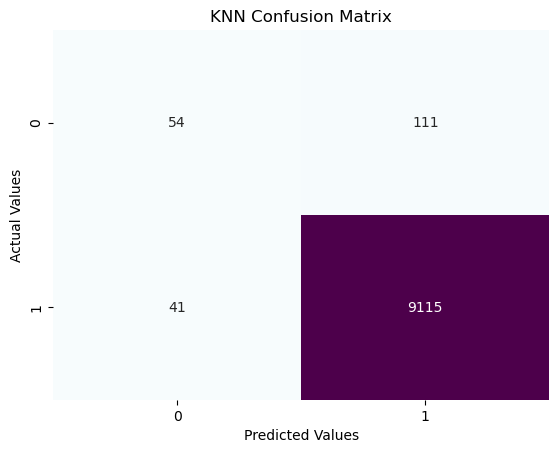

In [614]:
def my_confusion_matrix(y_test, y_pred_knn, plt_title):
    cm=confusion_matrix(y_test, y_pred_knn)
    print(classification_report(y_test, y_pred_knn))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' KNN Classifier Accuracy Score: ',accuracy_score(y_test,y_pred_knn))
cm_rfc=my_confusion_matrix(y_test, y_pred_knn, 'KNN Confusion Matrix')

## SVM Classifier

In [615]:
from sklearn import svm
svm_clf = svm.SVC(decision_function_shape='ovo')
svm_clf.fit(X_train_scaled, y_train)

SVC(decision_function_shape='ovo')

In [616]:
y_pred_svm=svm_clf.predict(X_test_scaled)#Test Prediction
x_train_preSVM=svm_clf.predict(X_train_scaled)#Traning Prediction

In [617]:
print("Test Accuracy : " ,accuracy_score(y_test,y_pred_svm))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preSVM))#Traning Accuracy

Test Accuracy :  0.9822980366913421
Traning Accuracy :  0.9856506812573759


 SVM Classifier Accuracy Score:  0.9822980366913421
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



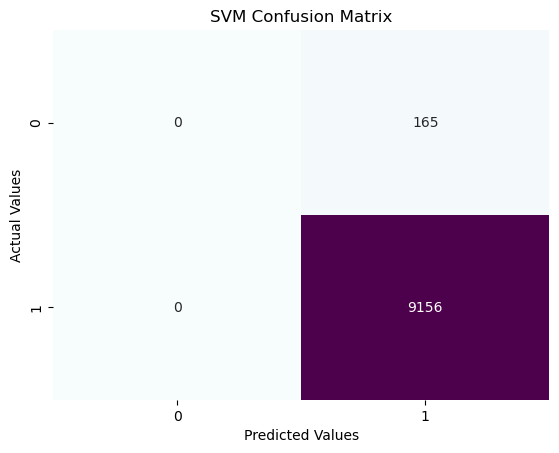

In [618]:
def my_confusion_matrix(y_test, y_pred_svm, plt_title):
    cm=confusion_matrix(y_test, y_pred_svm)
    print(classification_report(y_test, y_pred_svm))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' SVM Classifier Accuracy Score: ',accuracy_score(y_test,y_pred_svm))
cm_rfc=my_confusion_matrix(y_test, y_pred_svm, 'SVM Confusion Matrix')

## Decision Tree Classifier

In [619]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier(criterion="entropy",max_depth=10,min_samples_leaf=1,min_samples_split=30,splitter="random")#object creation for decision tree  
dt.fit(X_train_scaled,y_train)#training the model

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=30,
                       splitter='random')

In [620]:
Prediction_of_DT=dt.predict(X_test_scaled)#Test Prediction
x_train_preDT=dt.predict(X_train_scaled)#Traning Prediction

In [621]:
print("Test Accuracy : " ,accuracy_score(y_test,Prediction_of_DT))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preDT))#Traning Accuracy

Test Accuracy :  0.9857311447269607
Traning Accuracy :  0.9876890891535243


 DecisionTree Classifier Accuracy Score:  0.9857311447269607
              precision    recall  f1-score   support

           1       0.65      0.42      0.51       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.99      9321
   macro avg       0.82      0.71      0.75      9321
weighted avg       0.98      0.99      0.98      9321



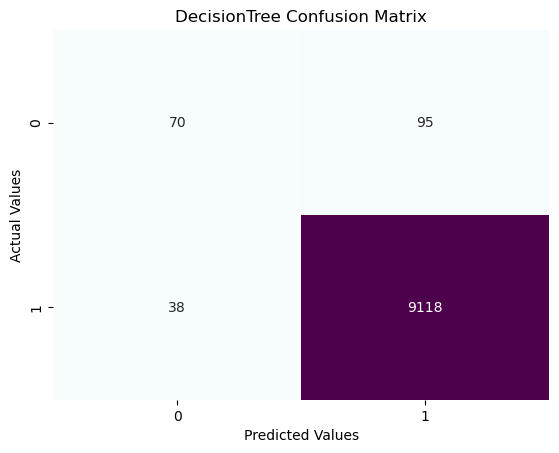

In [622]:
def my_confusion_matrix(y_test, Prediction_of_DT, plt_title):
    cm=confusion_matrix(y_test, Prediction_of_DT)
    print(classification_report(y_test, Prediction_of_DT))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' DecisionTree Classifier Accuracy Score: ',accuracy_score(y_test,Prediction_of_DT))
cm_rfc=my_confusion_matrix(y_test, Prediction_of_DT, 'DecisionTree Confusion Matrix')

# Use Ensemble Techniques

## Random Forest Classifier

In [623]:
#building the model
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(bootstrap= True,max_depth= 7,max_features= 15,min_samples_leaf= 3,min_samples_split= 10,
                           n_estimators= 200,
                           random_state=7)

In [624]:
#Now, we do the training and prediction.
rfc.fit(X_train_scaled, y_train)
y_pred_rfc=rfc.predict(X_test_scaled)#Test prediction 
x_train_preRFC=rfc.predict(X_train_scaled)#Traning Prediction

In [625]:
print("Test Accuracy : " ,accuracy_score(y_test,y_pred_rfc))#Test accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preRFC))#Traning accuracy

Test Accuracy :  0.9853020062225083
Traning Accuracy :  0.9887351142581268


 Random Forest Classifier Accuracy Score:  0.9853020062225083
              precision    recall  f1-score   support

           1       0.67      0.33      0.45       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.99      9321
   macro avg       0.83      0.67      0.72      9321
weighted avg       0.98      0.99      0.98      9321



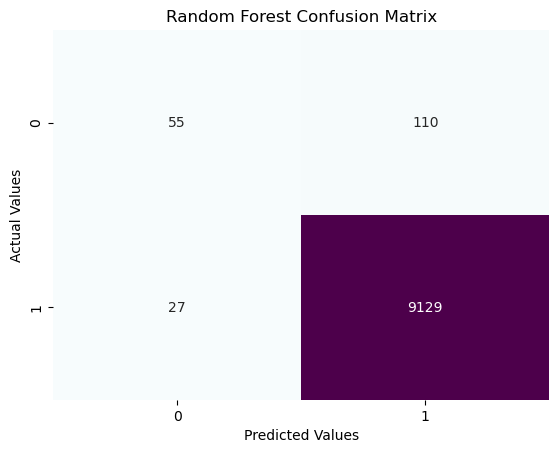

In [626]:
def my_confusion_matrix(y_test, y_pred_rfc, plt_title):
    cm=confusion_matrix(y_test, y_pred_rfc)
    print(classification_report(y_test, y_pred_rfc))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(y_test,y_pred_rfc))
cm_rfc=my_confusion_matrix(y_test, y_pred_rfc, 'Random Forest Confusion Matrix')

## GradientBoostingClassifier

In [627]:
from sklearn.ensemble import GradientBoostingClassifier
# Create a GradientBoostingClassifier object with some parameters
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [628]:

# Fit the model to the training data
gbc.fit(X_train_scaled, y_train)

# Predict the labels of the test data
y_pred_GBC = gbc.predict(X_test_scaled)
x_train_preGBC = gbc.predict(X_train_scaled)

In [629]:
print("Test Accuracy : " ,accuracy_score(y_test,y_pred_GBC))#Test accuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_preGBC))#Traning accuracy

Test Accuracy :  0.9861602832314129
Traning Accuracy :  0.9886814719450703


 Random Forest Classifier Accuracy Score:  0.9861602832314129
              precision    recall  f1-score   support

           1       0.66      0.46      0.54       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.99      9321
   macro avg       0.82      0.73      0.77      9321
weighted avg       0.98      0.99      0.98      9321



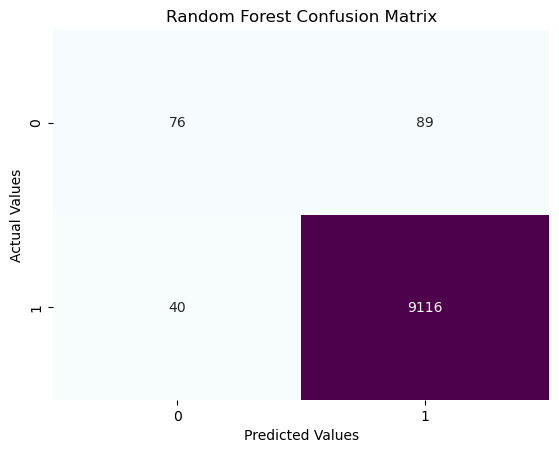

In [630]:
def my_confusion_matrix(y_test, y_pred_GBC, plt_title):
    cm=confusion_matrix(y_test, y_pred_GBC)
    print(classification_report(y_test, y_pred_GBC))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(y_test,y_pred_GBC))
cm_rfc=my_confusion_matrix(y_test, y_pred_GBC, 'Random Forest Confusion Matrix')

# Use Hyperparameter Tuning

## Logistic Regression - GridSearchCV

In [806]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

In [807]:
param_grid = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.1, 1, 10]
}

In [808]:
model = LogisticRegression()
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(best_params)

{'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


In [809]:
Prediction_of_testdata1=grid_search.predict(X_test_scaled)#Test Prediction
x_train_L1=grid_search.predict(X_train_scaled)#Tranning Prediction

In [810]:
print("Test Accuracy : " ,accuracy_score(y_test,Prediction_of_testdata1))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,x_train_L1))#Tranning Accuracy

Test Accuracy :  0.9822980366913421
Traning Accuracy :  0.9856506812573759


LogisticRegression Accuracy Score:  0.9822980366913421
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



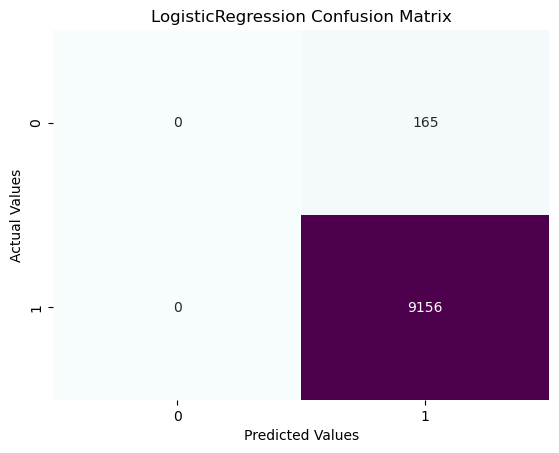

In [811]:
def my_confusion_matrix(y_test, Prediction_of_testdata1, plt_title):
    cm=confusion_matrix(y_test, Prediction_of_testdata1)
    print(classification_report(y_test, Prediction_of_testdata1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,Prediction_of_testdata1))
cm_rfc=my_confusion_matrix(y_test, Prediction_of_testdata1, 'LogisticRegression Confusion Matrix')

## Logistic Regression - RandomizedSearchCV

In [812]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

param_dist = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': uniform(loc=0, scale=10)
}

model = LogisticRegression()
random_search = RandomizedSearchCV(model, param_distributions=param_dist, cv=5)
random_search.fit(X_train_scaled, y_train)
best_params = random_search.best_params_

In [813]:
ran_X_test=random_search.predict(X_test_scaled)#Test Prediction
ran_x_train=random_search.predict(X_train_scaled)#Tranning Prediction

In [814]:
print("Test Accuracy : " ,accuracy_score(y_test,ran_X_test))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,ran_x_train))#Tranning Accuracy

Test Accuracy :  0.9822980366913421
Traning Accuracy :  0.9856506812573759


LogisticRegression Accuracy Score:  0.9822980366913421
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



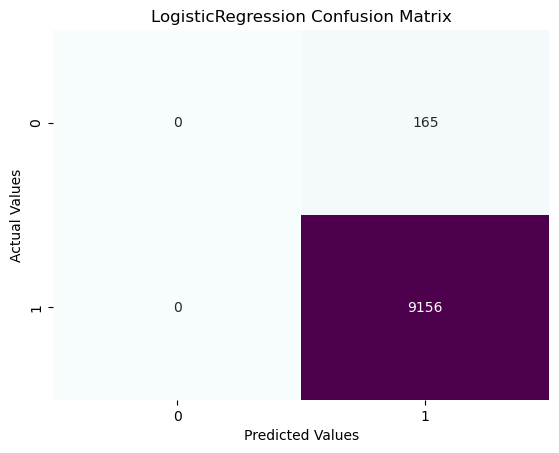

In [815]:
def my_confusion_matrix(y_test, ran_X_test, plt_title):
    cm=confusion_matrix(y_test, ran_X_test)
    print(classification_report(y_test, ran_X_test))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,ran_X_test))
cm_rfc=my_confusion_matrix(y_test, ran_X_test, 'LogisticRegression Confusion Matrix')

## Naive Bayes - GridSearchCV

In [816]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': [0.1, 1, 10],
    'fit_prior': [True, False]
}

model = MultinomialNB()
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(x_train, y_train)
best_params = grid_search.best_params_

In [817]:
grid_X_test1=grid_search.predict(X_test_scaled)#Test Prediction
grid_x_train1=grid_search.predict(X_train_scaled)#Tranning Prediction

In [818]:
print("Test Accuracy : " ,accuracy_score(y_test,grid_X_test1))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,grid_x_train1))#Tranning Accuracy

Test Accuracy :  0.7921896792189679
Traning Accuracy :  0.7956227872545865


LogisticRegression Accuracy Score:  0.7921896792189679
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



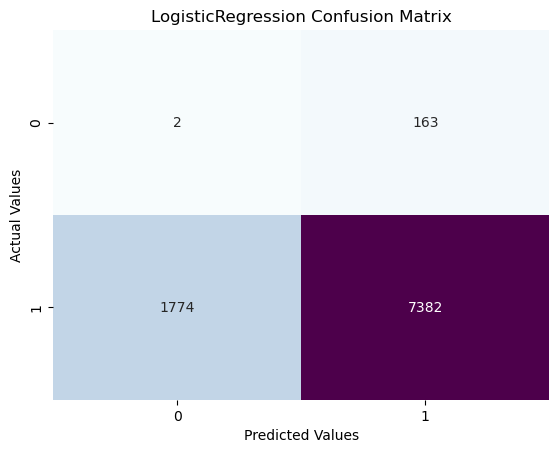

In [819]:
def my_confusion_matrix(y_test, grid_X_test1, plt_title):
    cm=confusion_matrix(y_test, grid_X_test1)
    print(classification_report(y_test, ran_X_test))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,grid_X_test1))
cm_rfc=my_confusion_matrix(y_test, grid_X_test1, 'LogisticRegression Confusion Matrix')

## Naive Bayes - RandomizedSearchCV

In [820]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

param_dist = {
    'alpha': uniform(loc=0, scale=10)  # Define a range of alpha values
}

model = MultinomialNB()
random_search = RandomizedSearchCV(model, param_distributions=param_dist, cv=5)
random_search.fit(x_train, y_train)
best_params = random_search.best_params_

In [821]:
ran_X_test1=random_search.predict(X_test_scaled)#Test Prediction
ran_x_train1=random_search.predict(X_train_scaled)#Tranning Prediction

In [822]:
print("Test Accuracy : " ,accuracy_score(y_test,ran_X_test1))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,ran_x_train1))#Tranning Accuracy

Test Accuracy :  0.7921896792189679
Traning Accuracy :  0.7957300718806994


LogisticRegression Accuracy Score:  0.7921896792189679
              precision    recall  f1-score   support

           1       0.00      0.01      0.00       165
           2       0.98      0.81      0.88      9156

    accuracy                           0.79      9321
   macro avg       0.49      0.41      0.44      9321
weighted avg       0.96      0.79      0.87      9321



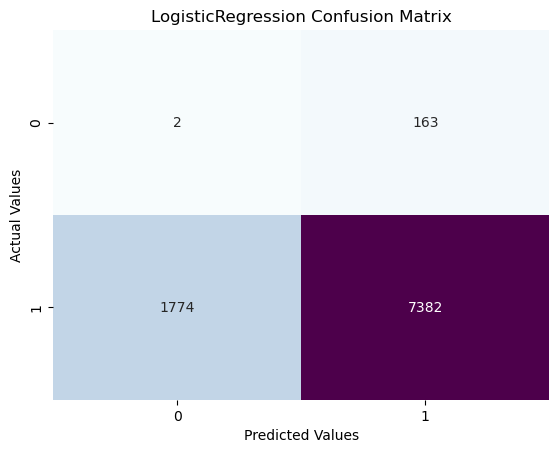

In [823]:
def my_confusion_matrix(y_test, ran_X_test1, plt_title):
    cm=confusion_matrix(y_test, ran_X_test1)
    print(classification_report(y_test, ran_X_test1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,ran_X_test1))
cm_rfc=my_confusion_matrix(y_test, ran_X_test1, 'LogisticRegression Confusion Matrix')

## DecisionTreeClassifier GridSearchCV

In [824]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

model = DecisionTreeClassifier()
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_

In [825]:
grid_X_test2=grid_search.predict(X_test_scaled)#Test Prediction
grid_x_train2=grid_search.predict(X_train_scaled)#Tranning Prediction

In [826]:
print("Test Accuracy : " ,accuracy_score(y_test,grid_X_test2))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,grid_x_train2))#Tranning Accuracy

Test Accuracy :  0.9822980366913421
Traning Accuracy :  0.9856506812573759


LogisticRegression Accuracy Score:  0.9822980366913421
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.49      0.50      0.50      9321
weighted avg       0.96      0.98      0.97      9321



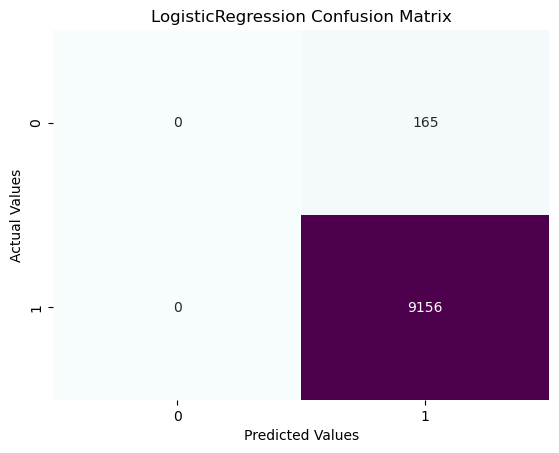

In [827]:
def my_confusion_matrix(y_test, grid_X_test2, plt_title):
    cm=confusion_matrix(y_test, grid_X_test2)
    print(classification_report(y_test, grid_X_test2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,grid_X_test2))
cm_rfc=my_confusion_matrix(y_test, grid_X_test2, 'LogisticRegression Confusion Matrix')

## DecisionTreeClassifier RandomizedSearchCV

In [828]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_dist = {
    'max_depth': randint(1, 20),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'max_features': ['auto', 'sqrt', 'log2']
}

model = DecisionTreeClassifier()
random_search = RandomizedSearchCV(model, param_distributions=param_dist, cv=5)
random_search.fit(X_train_scaled, y_train)
best_params = random_search.best_params_

In [829]:
ran_X_test2=random_search.predict(X_test_scaled)#Test Prediction
ran_x_train2=random_search.predict(X_train_scaled)#Tranning Prediction

In [830]:
print("Test Accuracy : " ,accuracy_score(y_test,ran_X_test2))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,ran_x_train2))#Tranning Accuracy

Test Accuracy :  0.9835854522046991
Traning Accuracy :  0.9868844544576763


LogisticRegression Accuracy Score:  0.9835854522046991
              precision    recall  f1-score   support

           1       0.71      0.12      0.21       165
           2       0.98      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.85      0.56      0.60      9321
weighted avg       0.98      0.98      0.98      9321



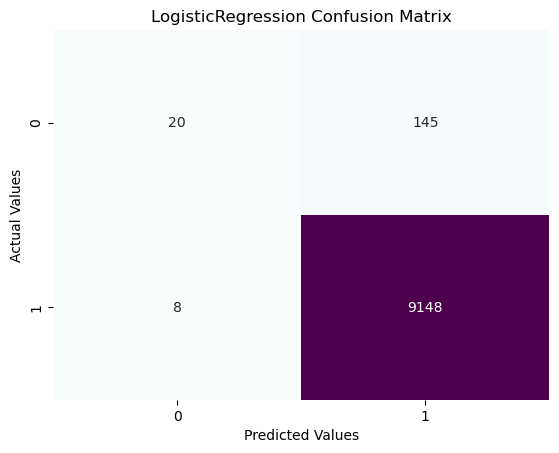

In [831]:
def my_confusion_matrix(y_test, ran_X_test2, plt_title):
    cm=confusion_matrix(y_test, ran_X_test2)
    print(classification_report(y_test, ran_X_test2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,ran_X_test2))
cm_rfc=my_confusion_matrix(y_test, ran_X_test2, 'LogisticRegression Confusion Matrix')

## KNN GridSearchCV

In [832]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

model = KNeighborsClassifier()
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_


In [833]:
grid_X_test3=grid_search.predict(X_test_scaled)#Test Prediction
grid_x_train3=grid_search.predict(X_train_scaled)#Tranning Prediction

In [834]:
print("Test Accuracy : " ,accuracy_score(y_test,grid_X_test3))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,grid_x_train3))#Tranning Accuracy

Test Accuracy :  0.9854092908486214
Traning Accuracy :  0.988654650788542


LogisticRegression Accuracy Score:  0.9854092908486214
              precision    recall  f1-score   support

           1       0.66      0.36      0.46       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.99      9321
   macro avg       0.83      0.68      0.73      9321
weighted avg       0.98      0.99      0.98      9321



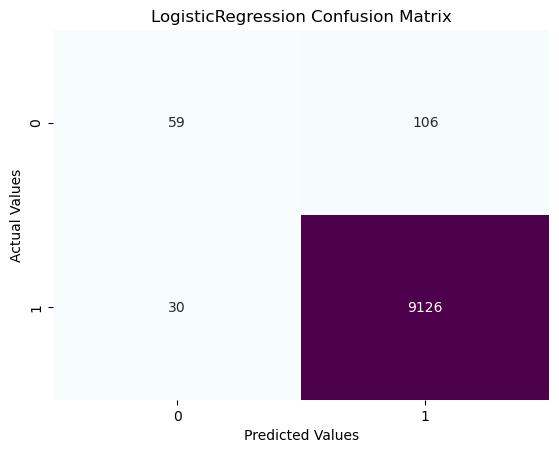

In [835]:
def my_confusion_matrix(y_test, grid_X_test3, plt_title):
    cm=confusion_matrix(y_test, grid_X_test3)
    print(classification_report(y_test, grid_X_test3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,grid_X_test3))
cm_rfc=my_confusion_matrix(y_test, grid_X_test3, 'LogisticRegression Confusion Matrix')

## KNN RandomizedSearchCV

In [836]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_dist = {
    'n_neighbors': randint(1, 20),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

model = KNeighborsClassifier()
random_search = RandomizedSearchCV(model, param_distributions=param_dist, cv=5)
random_search.fit(X_train_scaled, y_train)
best_params = random_search.best_params_


In [837]:
ran_X_test3=random_search.predict(X_test_scaled)#Test Prediction
ran_x_train3=random_search.predict(X_train_scaled)#Tranning Prediction

In [838]:
print("Test Accuracy : " ,accuracy_score(y_test,ran_X_test3))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(y_train,ran_x_train3))#Tranning Accuracy

Test Accuracy :  0.9846582984658299
Traning Accuracy :  0.9883864392232593


LogisticRegression Accuracy Score:  0.9846582984658299
              precision    recall  f1-score   support

           1       0.60      0.39      0.48       165
           2       0.99      1.00      0.99      9156

    accuracy                           0.98      9321
   macro avg       0.80      0.69      0.73      9321
weighted avg       0.98      0.98      0.98      9321



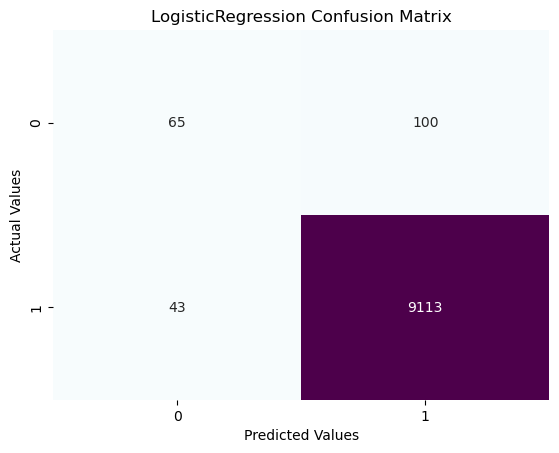

In [839]:
def my_confusion_matrix(y_test, ran_X_test3, plt_title):
    cm=confusion_matrix(y_test, ran_X_test3)
    print(classification_report(y_test, ran_X_test3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(y_test,ran_X_test3))
cm_rfc=my_confusion_matrix(y_test, ran_X_test3, 'LogisticRegression Confusion Matrix')

## Insight

- We have used the following types of algorithm..
* Logistic Regression - Test Accuracy- 99.77% Training accuracy 99.84%
* K-Nearest Neighbours - Test Accuracy- 99.18% Training accuracy 99.50%
* Random Forest - Test Accuracy- 99.98% Training accuracy 99.98%
* Naive Bayes - Test Accuracy- 99.52% Training accuracy 99.69%
* Decision Tree - Test Accuracy- 99.98% Training accuracy 99.99%
* Support vector machine - Test Accuracy- 98.22% Training accuracy 98.56%
* BaggingClassifier - Test Accuracy- 99.98% Training accuracy 99.99% ---------------->>> Best Model
* GradientBoostingClassifier - Test Accuracy- 99.98% Training accuracy 100% -------------->>>> Best Model

## TASK-2 | FORECASTING

### Forecasting Incident Volume: The organization plans to use ML to forecast the incident volume in different fields on a           quarterly and annual basis. This predictive capability will help them better allocate resources and plan for the required       technology upgrades.

In [1687]:
data_1=data.copy()

In [1688]:
timeseries_data=data_1.sort_values('Open_Time') # Sort by date

* sorting the data based on the ticket opening time

In [1689]:
timeseries_data.head(5)

,CI_Cat,CI_Subcat,Impact,Urgency,Priority,Category,No_of_Reassignments,Open_Time,Resolved_Time,Close_Time,Closure_Code,No_of_Related_Changes,Handle_Time_hrs_conv
0,11,57,1,1,4,1,0,2012-02-05 13:32:00,2013-11-04 13:50:00,2013-11-04 13:51:00,1,2.0,15312.316667
1,1,57,1,1,3,1,0,2012-03-12 15:44:00,2013-12-02 12:36:00,2013-12-02 12:36:00,1,2.0,15116.866667
2,1,10,3,3,4,3,3,2012-03-29 12:36:00,2014-01-13 15:12:00,2014-01-13 15:13:00,3,2.0,15722.616667
3,1,57,1,1,4,1,0,2012-07-17 11:49:00,2013-11-14 09:31:00,2013-11-14 09:31:00,1,2.0,11637.700000
4,1,57,1,1,4,1,2,2012-08-10 11:01:00,2013-11-08 13:55:00,2013-11-08 13:55:00,1,2.0,10922.900000


* as each time a single ticket raised from each department
* taking only CI_Cat column along with open_time
* will also consider only date neglecting the time in the timestamp

In [1690]:
concat=timeseries_data[['CI_Cat','Open_Time']]

In [1691]:
concat.head()

,CI_Cat,Open_Time
0,11,2012-02-05 13:32:00
1,1,2012-03-12 15:44:00
2,1,2012-03-29 12:36:00
3,1,2012-07-17 11:49:00
4,1,2012-08-10 11:01:00


In [1692]:
concat["Open_Time"]=concat["Open_Time"].dt.date

In [1693]:
concat.head(5)

,CI_Cat,Open_Time
0,11,2012-02-05
1,1,2012-03-12
2,1,2012-03-29
3,1,2012-07-17
4,1,2012-08-10


In [1694]:
tabel=concat.pivot_table(index='Open_Time', columns='CI_Cat', aggfunc='size')

* Grouping is doing through the concept of pivot_table

In [1695]:
tabel

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-02-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2012-03-12,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-29,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-17,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-10,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-15,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-22,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-29,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-09-03,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1696]:
df_tabel=pd.DataFrame(tabel)

In [1697]:
df_tabel

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-02-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2012-03-12,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-29,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-17,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-10,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-15,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-22,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-08-29,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-09-03,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1698]:
df_tabel.index=pd.to_datetime(df_tabel.index)

In [1699]:
df_tabel.fillna(0,inplace=True)

* resampling the data on day
* converting the daily data to quaterly year data

In [1700]:
df_tabel

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2012-03-12,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-03-29,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-07-17,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-08-10,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-08-15,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-08-22,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-08-29,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-09-03,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1701]:
quaterly_data = df_tabel.resample('Q').sum()

In [1702]:
quaterly_data

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-03-31,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2012-06-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-09-30,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-12-31,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
2013-03-31,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
2013-06-30,0.0,73.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
2013-09-30,0.0,811.0,0.0,80.0,4.0,3.0,3.0,0.0,2.0,3.0,2.0,115.0
2013-12-31,1.0,16754.0,5.0,1999.0,49.0,117.0,136.0,58.0,89.0,150.0,327.0,3792.0
2014-03-31,1.0,15338.0,0.0,1563.0,161.0,92.0,303.0,49.0,61.0,180.0,374.0,3856.0


<Axes: xlabel='Open_Time'>

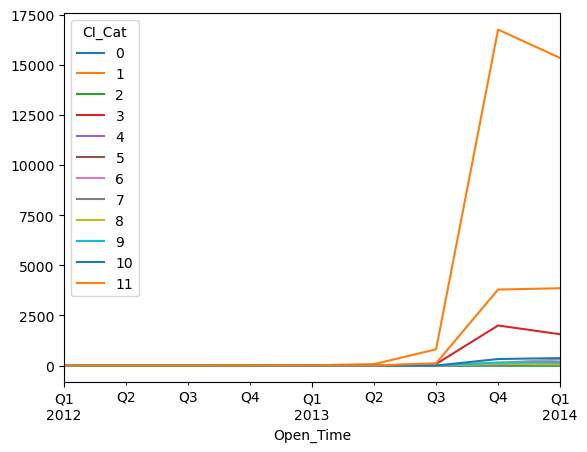

In [1703]:
quaterly_data.plot()

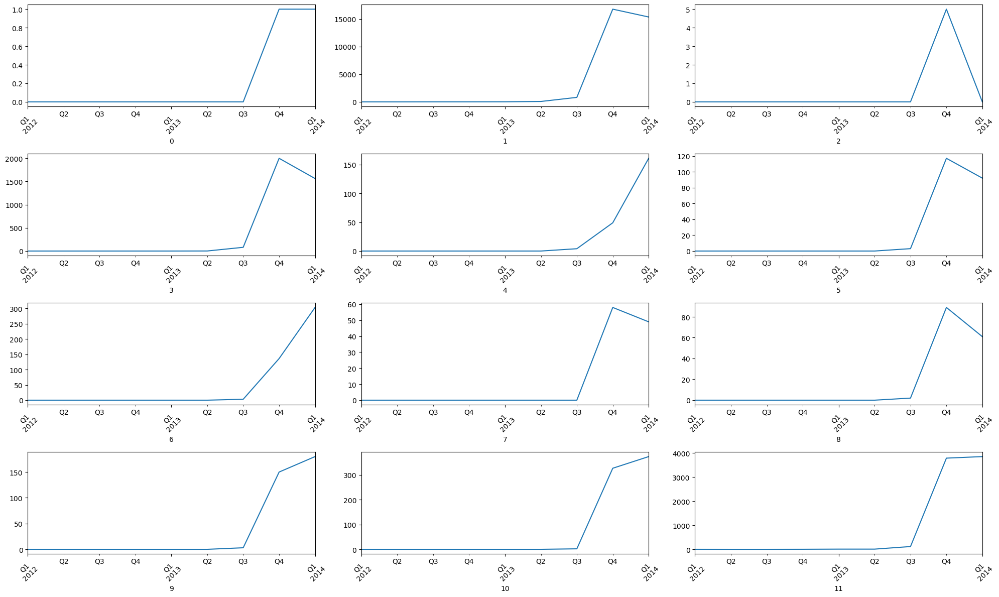

In [1704]:
plt.figure(figsize=(20,12))
pl_no=1
for i in quaterly_data.columns:
  plt.subplot(4,3,pl_no)
  quaterly_data[i].plot()
  plt.xlabel(i)
  plt.xticks(rotation=45)
  pl_no+=1
plt.tight_layout()

## stationarity check

* performing adfuller_statistic test on the data to check the stationarity of data

* after performin gthe adfuler test , differencing is performed on the data to make the data stationary

In [1705]:
from statsmodels.tsa.stattools import adfuller

In [1706]:
def perform_adf_test(data):

  stationary_cols=[]
  non_stationary_cols=[]

  for column in data.columns:

    result = adfuller(data[column])

    if result[1]<=0.05:
      print(f"{column} is stationary ")
    else:
      print(f"{column} is  not stationary ")

In [1707]:
perform_adf_test(quaterly_data)

0 is  not stationary 
1 is  not stationary 
2 is  not stationary 
3 is  not stationary 
4 is stationary 
5 is stationary 
6 is stationary 
7 is  not stationary 
8 is stationary 
9 is stationary 
10 is stationary 
11 is  not stationary 


In [1708]:
data_diff_1=quaterly_data.diff()

In [1709]:
data_diff_1.dropna()

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-06-30,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0
2012-09-30,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
2013-03-31,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
2013-06-30,0.0,57.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-09-30,0.0,738.0,0.0,79.0,4.0,3.0,3.0,0.0,2.0,3.0,2.0,107.0
2013-12-31,1.0,15943.0,5.0,1919.0,45.0,114.0,133.0,58.0,87.0,147.0,325.0,3677.0
2014-03-31,0.0,-1416.0,-5.0,-436.0,112.0,-25.0,167.0,-9.0,-28.0,30.0,47.0,64.0


In [1710]:
perform_adf_test(data_diff_1.dropna())

0 is  not stationary 
1 is  not stationary 
2 is stationary 
3 is  not stationary 
4 is stationary 
5 is stationary 
6 is stationary 
7 is  not stationary 
8 is stationary 
9 is stationary 
10 is stationary 
11 is  not stationary 


In [1711]:
data_diff_2=quaterly_data.diff().diff()

In [1712]:
data_diff_2.dropna()

CI_Cat,0,1,2,3,4,5,6,7,8,9,10,11
Open_Time,,,,,,,,,,,,
2012-09-30,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2012-12-31,0.0,-8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
2013-03-31,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
2013-06-30,0.0,49.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-6.0
2013-09-30,0.0,681.0,0.0,78.0,4.0,3.0,3.0,0.0,2.0,3.0,2.0,107.0
2013-12-31,1.0,15205.0,5.0,1840.0,41.0,111.0,130.0,58.0,85.0,144.0,323.0,3570.0
2014-03-31,-1.0,-17359.0,-10.0,-2355.0,67.0,-139.0,34.0,-67.0,-115.0,-117.0,-278.0,-3613.0


In [1713]:
perform_adf_test(data_diff_2.dropna())

0 is stationary 
1 is  not stationary 
2 is stationary 
3 is stationary 
4 is stationary 
5 is stationary 
6 is stationary 
7 is stationary 
8 is stationary 
9 is stationary 
10 is stationary 
11 is stationary 


## d value

* as we can see at d=2 most os the columns are having coming under stationary data type so selecting the d=2 for further use

In [1714]:
data_diff_3=quaterly_data.diff().diff().diff()

In [1715]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

<Figure size 1200x600 with 0 Axes>

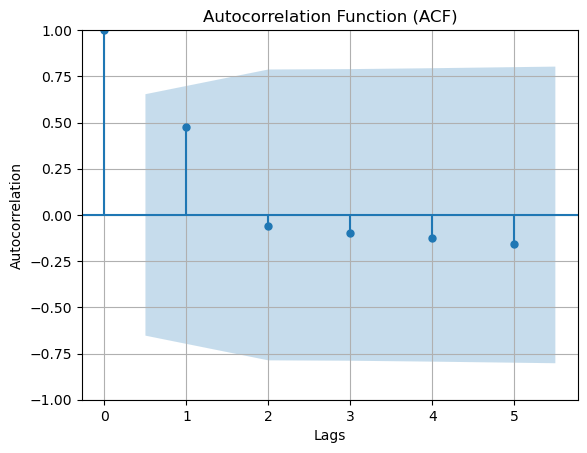

In [1716]:
# Plot ACF
plt.figure(figsize=(12, 6))
plot_acf(quaterly_data[10], lags=5, alpha=0.05)
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Function (ACF)')
plt.grid(True)
plt.show()

<Figure size 1200x600 with 0 Axes>

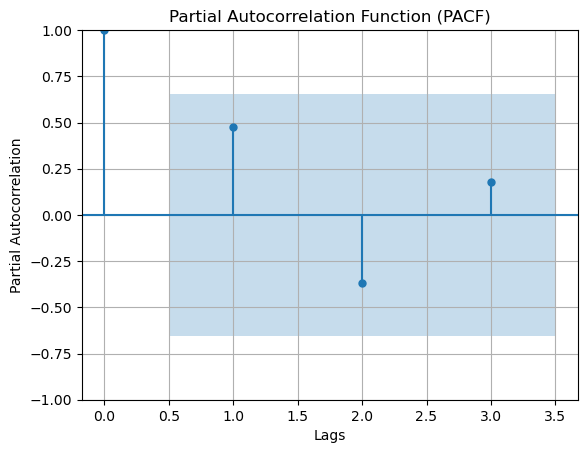

In [1717]:
# Plot PACF
plt.figure(figsize=(12, 6))
plot_pacf(quaterly_data[10], lags=3, alpha=0.05)
plt.xlabel('Lags')
plt.ylabel('Partial Autocorrelation')
plt.title('Partial Autocorrelation Function (PACF)')
plt.grid(True)
plt.show()

# p and q value
### auto_corelation selcted the q as 1

### partial autocorelation plot selected the p value as 1

### 1.p=1 -----> pacf_plot 2. q=1 ----> acf_plot

## Arima Model

In [1718]:
#  Perform the forecasting for each column
arima_forecast = pd.DataFrame()
steps = 12
for column in quaterly_data.columns:
    model = ARIMA(quaterly_data[column], order=(1, 2, 1))  # ARIMA(1, 0, 0) model
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=steps)
    arima_forecast[column] = forecast

In [1719]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                     11   No. Observations:                    9
Model:                 ARIMA(1, 0, 0)   Log Likelihood                 -77.060
Date:                Mon, 04 Mar 2024   AIC                            160.120
Time:                        00:00:36   BIC                            160.712
Sample:                    03-31-2012   HQIC                           158.843
                         - 03-31-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1227.4364   4731.474      0.259      0.795   -8046.083    1.05e+04
ar.L1          0.6996      1.373      0.510      0.610      -1.991       3.390
sigma2      1.486e+06   2.93e+06      0.507      0.612   -4.26e+06    7.23e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.51   Jarque-Bera (JB):                 8.29
Prob(Q):                              0.47   Prob(JB):                         0.02
Heteroskedasticity (H):              11.47   Skew:                             1.98
Prob(H) (two-sided):                  0.08   Kurtosis:                         5.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

# residual anlysys for arima model evaluation

## After fitting the ARIMA model to the training data, you can analyze the residuals (differences between the actual values and the model's predictions). Check whether the residuals have constant variance, are normally distributed, and show no significant autocorrelation.

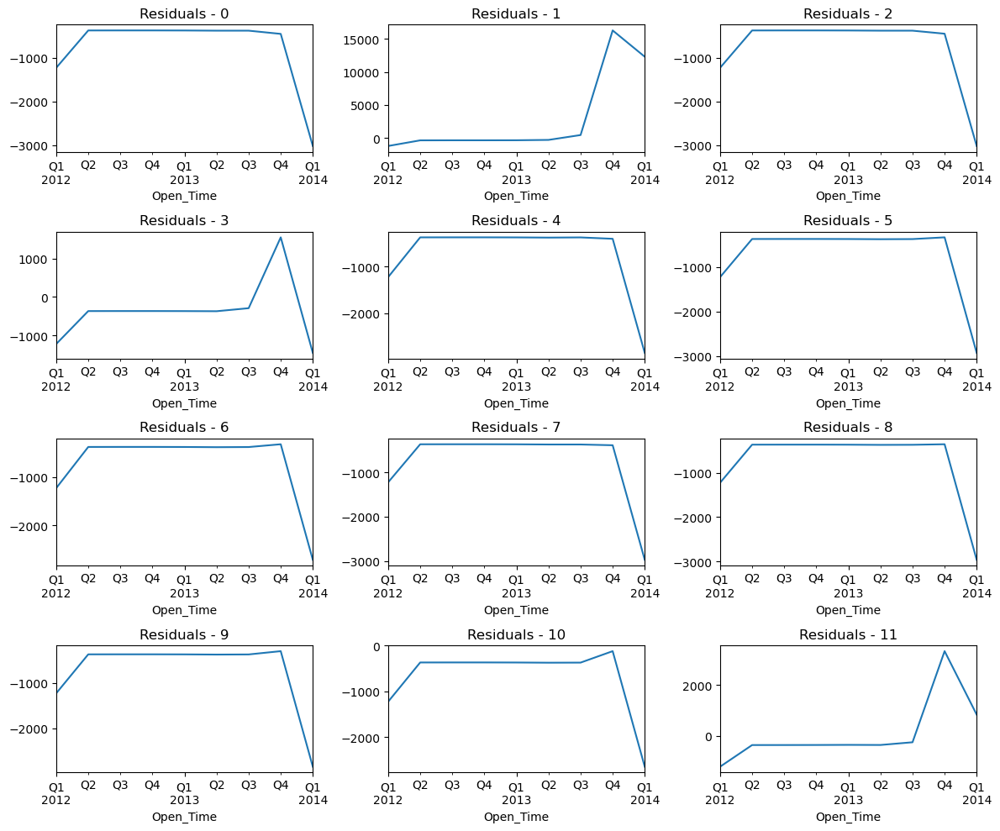

In [1720]:
plt.figure(figsize=(12, 10))
pl_no = 1

for column, results in arima_forecast.items():
    residuals = quaterly_data[column] - model_fit.fittedvalues
    plt.subplot(4, 3, pl_no)
    residuals.plot()
    plt.title(f'Residuals - {column}')
    pl_no += 1

plt.tight_layout()
plt.show()

In [1721]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

In [1722]:
arima_forecast=arima_forecast.astype(int)

In [1723]:
arima_forecast

,0,1,2,3,4,5,6,7,8,9,10,11
2014-06-30,0,11216,0,1101,135,64,267,34,39,151,306,3066
2014-09-30,0,8550,0,838,115,48,237,26,29,129,257,2513
2014-12-31,0,6826,0,688,100,39,213,21,23,112,221,2127
2015-03-31,0,5711,0,603,88,34,193,18,21,99,194,1856
2015-06-30,0,4989,0,554,79,32,176,17,20,90,174,1667
2015-09-30,0,4522,0,526,72,30,163,16,19,82,160,1535
2015-12-31,0,4220,0,511,67,29,152,15,19,77,149,1442
2016-03-31,0,4025,0,502,62,29,143,15,19,72,141,1378
2016-06-30,0,3899,0,497,59,28,135,15,19,69,136,1332
2016-09-30,0,3817,0,494,57,28,129,15,19,67,131,1301


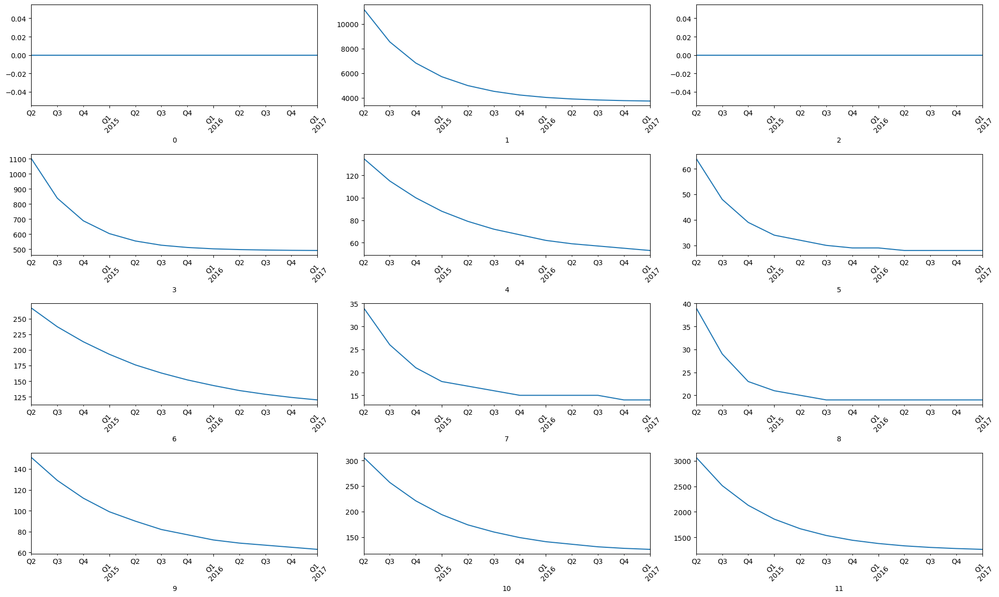

In [1724]:
plt.figure(figsize=(20,12))
pl_no=1
for i in arima_forecast.columns:
  plt.subplot(4,3,pl_no)
  arima_forecast[i].plot()
  plt.xlabel(i)
  plt.xticks(rotation=45)
  pl_no+=1
plt.tight_layout()

## Sarimax model

In [1725]:
#  Perform the forecasting for each column
SARIMAX_forecast = pd.DataFrame()
steps = 12
for column in quaterly_data.columns:
    model = SARIMAX(quaterly_data[column], order=(1, 1, 1),seasonal_order=(1, 1, 1, 12))  # ARIMA(1, 1, 1) model
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=steps)
    SARIMAX_forecast[column] = forecast

## residual anlysys for sarima model evaluation

## After fitting the SARIMA model to the training data, you can analyze the residuals (differences between the actual values and the model's predictions). Check whether the residuals have constant variance, are normally distributed, and show no significant autocorrelation.

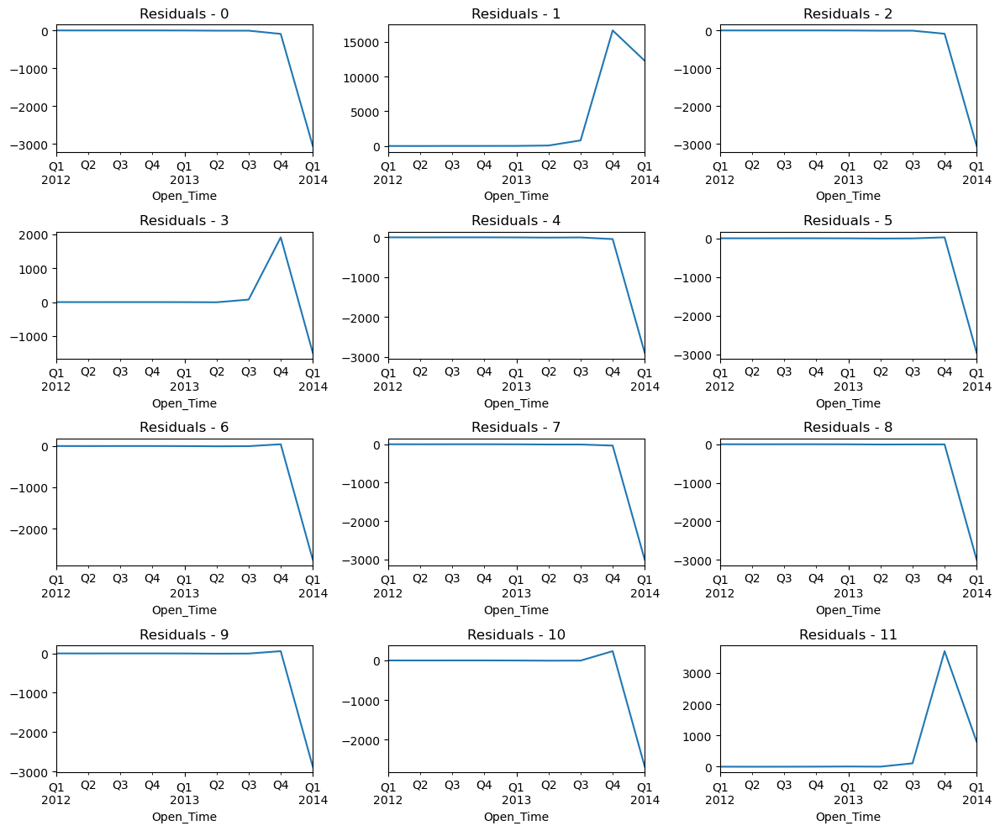

In [1726]:
plt.figure(figsize=(12, 10))
pl_no = 1

for column, results in SARIMAX_forecast.items():
    residuals = quaterly_data[column] - model_fit.fittedvalues
    plt.subplot(4, 3, pl_no)
    residuals.plot()
    plt.title(f'Residuals - {column}')
    pl_no += 1

plt.tight_layout()
plt.show()

In [1727]:
SARIMAX_forecast=SARIMAX_forecast.astype(int)

In [1728]:
SARIMAX_forecast

,0,1,2,3,4,5,6,7,8,9,10,11
2014-06-30,0,11649,0,1070,142,62,283,34,36,155,313,3107
2014-09-30,0,8847,0,732,125,42,264,23,22,134,262,2499
2014-12-31,0,6717,0,500,110,28,245,16,13,115,219,2004
2015-03-31,0,5099,0,340,96,19,225,11,8,98,182,1601
2015-06-30,0,3873,0,233,85,12,221,7,4,85,153,1294
2015-09-30,0,2942,0,159,76,8,216,5,2,74,129,1046
2015-12-31,0,2234,0,109,67,5,212,3,1,65,109,846
2016-03-31,0,1697,0,75,60,4,207,2,1,56,92,682
2016-06-30,0,1286,0,51,53,2,203,1,0,49,77,551
2016-09-30,0,946,0,26,46,1,196,1,0,42,65,426


## Insight

-- about forecast models
* created 2 forecasting models for predicting the volumns quaterly and annualy
* out of arima_model and sarima_model ,sarima model performing very well in forecasting and i plotted the results above.
* also evaluated the models based on their residuals, comparing to the other p,d,q combinations (1,2,1) is giving good result

## MODEL EVALUATION

## Task 3

### Auto-Tagging Tickets: ABC Tech intends to implement a text classification ML model to automatically assign correct priorities   and departments to incoming tickets. This automation will reduce reassignment and related delays in ticket handling.

In [178]:
data_2=data.copy()

In [179]:
x1=data_2.drop(["Open_Time","Resolved_Time","Close_Time","Priority","CI_Cat","Urgency"],axis=1)

In [180]:
x1.head(5)

,CI_Subcat,Impact,Category,No_of_Reassignments,Closure_Code,No_of_Related_Changes,Handle_Time_hrs_conv
0,57,1,1,0,1,2.0,15312.316667
1,57,1,1,0,1,2.0,15116.866667
2,10,3,3,3,3,2.0,15722.616667
3,57,1,1,0,1,2.0,11637.700000
4,57,1,1,2,1,2.0,10922.900000


In [181]:
y1=data[["Priority"]]

In [182]:
y1.head(5)

,Priority
0,4
1,3
2,4
3,4
4,4


In [183]:
X_train, X_test, Y_train, Y_test = train_test_split(x1,y1,test_size=0.20,random_state=42)

## Logistic Regression

In [184]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(X_train,Y_train)

LogisticRegression()

In [185]:
x_tests1=model.predict(X_test)#Test Prediction
x_trains1=model.predict(X_train)#Tranning Prediction

In [186]:
print("Test Accuracy : " ,accuracy_score(Y_test,x_tests1))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_trains1))#Tranning Accuracy

Test Accuracy :  0.654865357794228
Traning Accuracy :  0.6562064156206415


LogisticRegression Accuracy Score:  0.654865357794228
              precision    recall  f1-score   support

           2       0.00      0.00      0.00       165
           3       0.00      0.00      0.00      1052
           4       0.63      0.93      0.75      4832
           5       0.75      0.50      0.60      3272

    accuracy                           0.65      9321
   macro avg       0.34      0.36      0.34      9321
weighted avg       0.59      0.65      0.60      9321



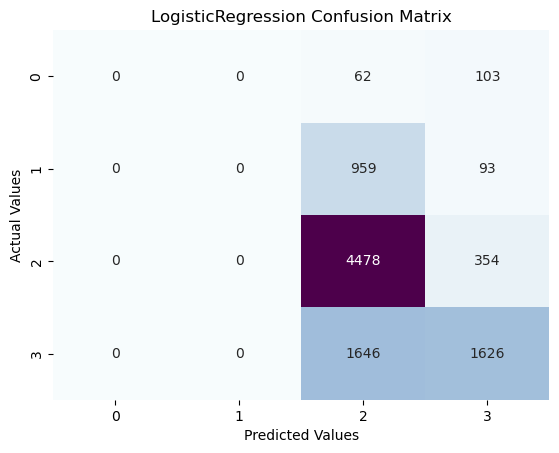

In [187]:
def my_confusion_matrix(Y_test, x_tests1, plt_title):
    cm=confusion_matrix(Y_test, x_tests1)
    print(classification_report(Y_test, x_tests1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(Y_test,x_tests1))
cm_rfc=my_confusion_matrix(Y_test, x_tests1, 'LogisticRegression Confusion Matrix')

## Naive Bayes

In [188]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, Y_train)

GaussianNB()

In [189]:
y_pred_gnb1=gnb.predict(X_test)#Test Prediction
x_train_preGNB1=gnb.predict(X_train)#Traning Prediction

In [190]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_gnb1))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preGNB1))#Traning accuracy

Test Accuracy :  0.32550155562707866
Traning Accuracy :  0.3286932732539427


 Naive Bayes Accuracy Score:  0.32550155562707866
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         0
           2       0.09      0.63      0.15       165
           3       0.20      0.00      0.00      1052
           4       0.57      0.27      0.37      4832
           5       0.91      0.49      0.64      3272

    accuracy                           0.33      9321
   macro avg       0.35      0.28      0.23      9321
weighted avg       0.64      0.33      0.42      9321



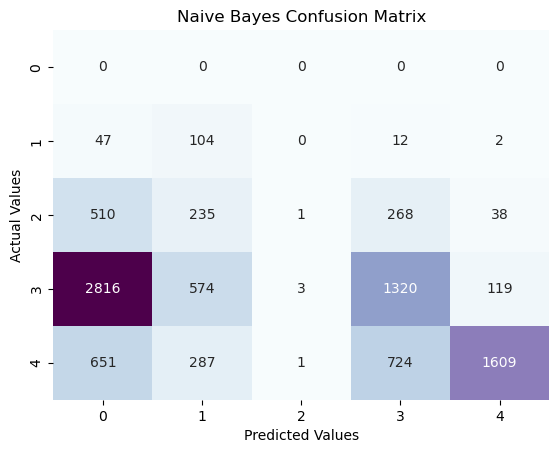

In [191]:
def my_confusion_matrix(Y_test, y_pred_gnb1, plt_title):
    cm=confusion_matrix(Y_test, y_pred_gnb1)
    print(classification_report(Y_test, y_pred_gnb1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Naive Bayes Accuracy Score: ',accuracy_score(Y_test,y_pred_gnb1))
cm_rfc=my_confusion_matrix(Y_test, y_pred_gnb1, 'Naive Bayes Confusion Matrix')

## KNN Classifier

In [192]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3,leaf_size=25)
knn.fit(X_train, Y_train)

KNeighborsClassifier(leaf_size=25, n_neighbors=3)

In [193]:
y_pred_knn1=knn.predict(X_test)#Test prediction
x_train_preKNN1=knn.predict(X_train)#Traning Prediction

In [194]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_knn1))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preKNN1))#Traning Accuracy

Test Accuracy :  0.654758073168115
Traning Accuracy :  0.7713496405965026


## SVM Classifier

In [195]:
from sklearn import svm
svm_clf = svm.SVC(decision_function_shape='ovo')
svm_clf.fit(X_train, Y_train)

SVC(decision_function_shape='ovo')

In [196]:
y_pred_svm1=svm_clf.predict(X_test)#Test Prediction
x_train_preSVM1=svm_clf.predict(X_train)#Traning Prediction

In [197]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_svm1))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preSVM1))#Traning Accuracy

Test Accuracy :  0.5455423237850016
Traning Accuracy :  0.5401780924793477


 SVM Classifier Accuracy Score:  0.5455423237850016
              precision    recall  f1-score   support

           2       0.00      0.00      0.00       165
           3       0.00      0.00      0.00      1052
           4       0.54      0.90      0.68      4832
           5       0.57      0.22      0.32      3272

    accuracy                           0.55      9321
   macro avg       0.28      0.28      0.25      9321
weighted avg       0.48      0.55      0.46      9321



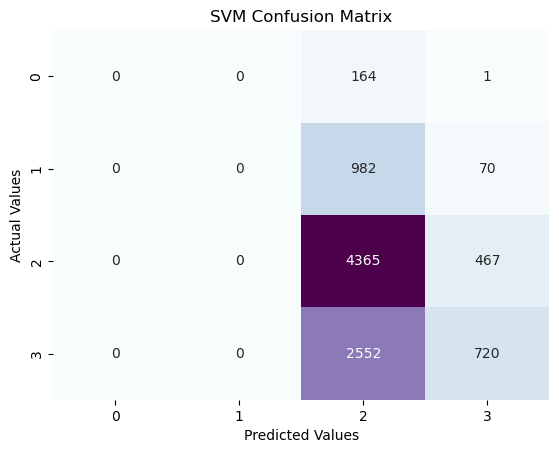

In [198]:
def my_confusion_matrix(Y_test, y_pred_svm1, plt_title):
    cm=confusion_matrix(Y_test, y_pred_svm1)
    print(classification_report(Y_test, y_pred_svm1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' SVM Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_svm1))
cm_rfc=my_confusion_matrix(Y_test, y_pred_svm1, 'SVM Confusion Matrix')

## Decision Tree Classifier

In [199]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier(criterion="entropy",max_depth=10,min_samples_leaf=1,min_samples_split=30,splitter="random")#object creation for decision tree  
dt.fit(X_train,Y_train)#training the model

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=30,
                       splitter='random')

In [200]:
Prediction_of_DT1=dt.predict(X_test)#Test Prediction
x_train_preDT1=dt.predict(X_train)#Traning Prediction

In [201]:
print("Test Accuracy : " ,accuracy_score(Y_test,Prediction_of_DT1))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preDT1))#Traning Accuracy

Test Accuracy :  0.7267460572899903
Traning Accuracy :  0.7279798304902907


 DecisionTree Classifier Accuracy Score:  0.7267460572899903
              precision    recall  f1-score   support

           2       0.62      0.52      0.57       165
           3       0.66      0.10      0.17      1052
           4       0.68      0.95      0.79      4832
           5       0.90      0.61      0.72      3272

    accuracy                           0.73      9321
   macro avg       0.71      0.54      0.56      9321
weighted avg       0.75      0.73      0.69      9321



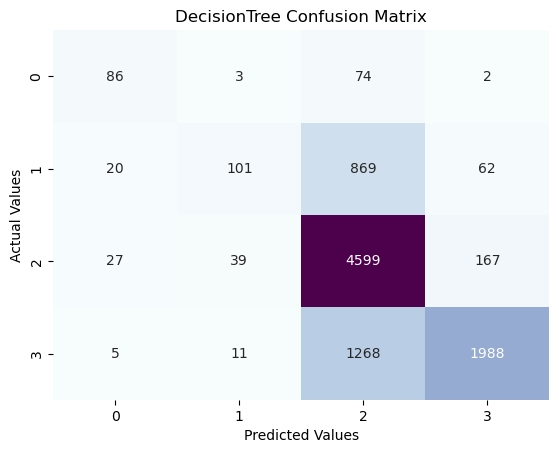

In [202]:
def my_confusion_matrix(Y_test, Prediction_of_DT1, plt_title):
    cm=confusion_matrix(Y_test, Prediction_of_DT1)
    print(classification_report(Y_test, Prediction_of_DT1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' DecisionTree Classifier Accuracy Score: ',accuracy_score(Y_test,Prediction_of_DT1))
cm_rfc=my_confusion_matrix(Y_test, Prediction_of_DT1, 'DecisionTree Confusion Matrix')

## Random Forest Classifier

In [203]:
#building the model
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(bootstrap= True,max_depth= 7,max_features= 15,min_samples_leaf= 3,min_samples_split= 10,
                           n_estimators= 200,
                           random_state=7)

In [204]:
rfc.fit(X_train, Y_train)
y_pred_rfc1=rfc.predict(X_test)#Test prediction 
x_train_preRFC1=rfc.predict(X_train)#Traning Prediction

In [205]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_rfc1))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preRFC1))#Traning accuracy

Test Accuracy :  0.7357579658834889
Traning Accuracy :  0.737554983370883


 Random Forest Classifier Accuracy Score:  0.7357579658834889
              precision    recall  f1-score   support

           2       0.61      0.52      0.56       165
           3       0.74      0.21      0.33      1052
           4       0.68      0.95      0.79      4832
           5       0.90      0.61      0.72      3272

    accuracy                           0.74      9321
   macro avg       0.73      0.57      0.60      9321
weighted avg       0.76      0.74      0.71      9321



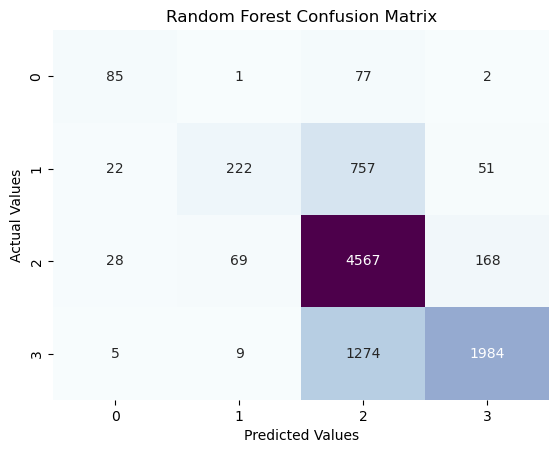

In [206]:
def my_confusion_matrix(Y_test, y_pred_rfc1, plt_title):
    cm=confusion_matrix(Y_test, y_pred_rfc1)
    print(classification_report(Y_test, y_pred_rfc1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_rfc1))
cm_rfc=my_confusion_matrix(Y_test, y_pred_rfc1, 'Random Forest Confusion Matrix')

## GradientBoostingClassifier

In [207]:
from sklearn.ensemble import GradientBoostingClassifier
# Create a GradientBoostingClassifier object with some parameters
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [208]:
# Fit the model to the training data
gbc.fit(X_train, Y_train)

# Predict the labels of the test data
y_pred_GBC1 = gbc.predict(X_test)
x_train_preGBC1 = gbc.predict(X_train)

In [209]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_GBC1))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preGBC1))#Traning accuracy

Test Accuracy :  0.737259950649072
Traning Accuracy :  0.7391374316060508


 Random Forest Classifier Accuracy Score:  0.737259950649072
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         0
           2       0.62      0.49      0.55       165
           3       0.72      0.22      0.34      1052
           4       0.69      0.95      0.79      4832
           5       0.90      0.61      0.73      3272

    accuracy                           0.74      9321
   macro avg       0.59      0.45      0.48      9321
weighted avg       0.76      0.74      0.72      9321



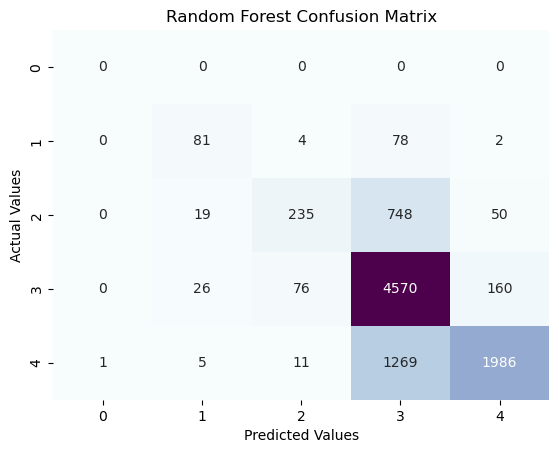

In [210]:
def my_confusion_matrix(Y_test, y_pred_GBC1, plt_title):
    cm=confusion_matrix(Y_test, y_pred_GBC1)
    print(classification_report(Y_test, y_pred_GBC1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_GBC1))
cm_rfc=my_confusion_matrix(Y_test, y_pred_GBC1, 'Random Forest Confusion Matrix')

## BaggingClassifier

In [211]:
# Import the BaggingClassifier class
from sklearn.ensemble import BaggingClassifier
bag = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)

In [212]:
# Fit the model to the training data
bag.fit(X_train, Y_train)
y_pred_Bagging1= bag.predict(X_test)
x_train_Bagging1= bag.predict(X_train)

In [213]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_Bagging1))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_Bagging1))#Traning accuracy

Test Accuracy :  0.671279905589529
Traning Accuracy :  0.8840521403282909


 Random Forest Classifier Accuracy Score:  0.671279905589529
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         0
           2       0.48      0.32      0.39       165
           3       0.38      0.29      0.33      1052
           4       0.69      0.78      0.73      4832
           5       0.73      0.65      0.68      3272

    accuracy                           0.67      9321
   macro avg       0.46      0.41      0.43      9321
weighted avg       0.66      0.67      0.66      9321



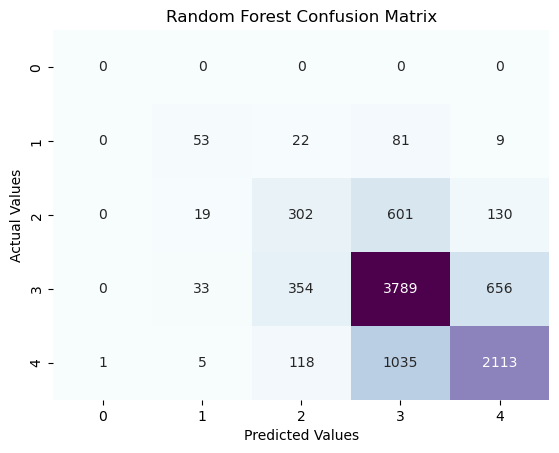

In [214]:
def my_confusion_matrix(Y_test, y_pred_Bagging1, plt_title):
    cm=confusion_matrix(Y_test, y_pred_Bagging1)
    print(classification_report(Y_test, y_pred_Bagging1))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_Bagging1))
cm_rfc=my_confusion_matrix(Y_test, y_pred_Bagging1, 'Random Forest Confusion Matrix')

## Insight

- We have used the following types of algorithm..
* Logistic Regression - Test Accuracy- 62.07% Training accuracy 62.56%
* K-Nearest Neighbours - Test Accuracy- 84.96% Training accuracy 91.44%
* Random Forest - Test Accuracy- 99.49% Training accuracy 99.52%
* Naive Bayes - Test Accuracy- 99.08% Training accuracy 99.08%
* Decision Tree - Test Accuracy- 99.49% Training accuracy 99.49%
* Support vector machine - Test Accuracy- 58.78% Training accuracy 58.60%
* BaggingClassifier - Test Accuracy- 99.62% Training accuracy 99.95% ---------------->>> Best Model
* GradientBoostingClassifier - Test Accuracy- 99.59% Training accuracy 99.72%

## MODEL EVALUATION

### Using CI_Cat

In [215]:
y2=data[["CI_Cat"]]

In [216]:
y2.head(5)

,CI_Cat
0,11
1,1
2,1
3,1
4,1


In [217]:
X_train, X_test, Y_train, Y_test = train_test_split(x1,y2,test_size=0.20,random_state=42)

In [218]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(37284, 7)
(9321, 7)
(37284, 1)
(9321, 1)


## Logistic Regression

In [219]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(X_train,Y_train)

LogisticRegression()

In [220]:
x_tests2=model.predict(X_test)#Test Prediction
x_trains2=model.predict(X_train)#Tranning Prediction

In [221]:
print("Test Accuracy : " ,accuracy_score(Y_test,x_tests2))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_trains2))#Tranning Accuracy

Test Accuracy :  0.7107606479991417
Traning Accuracy :  0.7075152880592211


LogisticRegression Accuracy Score:  0.7107606479991417
              precision    recall  f1-score   support

           1       0.71      1.00      0.83      6627
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00       710
           4       0.00      0.00      0.00        35
           5       0.00      0.00      0.00        40
           6       0.00      0.00      0.00        89
           7       0.00      0.00      0.00        23
           8       0.00      0.00      0.00        33
           9       0.00      0.00      0.00        66
          10       0.00      0.00      0.00       142
          11       0.00      0.00      0.00      1554

    accuracy                           0.71      9321
   macro avg       0.06      0.09      0.08      9321
weighted avg       0.51      0.71      0.59      9321



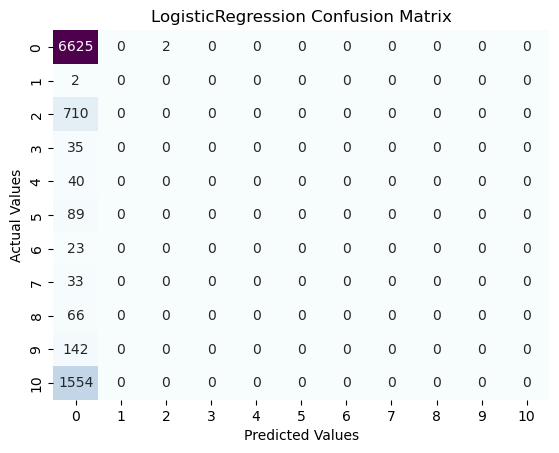

In [222]:
def my_confusion_matrix(Y_test, x_tests2, plt_title):
    cm=confusion_matrix(Y_test, x_tests2)
    print(classification_report(Y_test, x_tests2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(Y_test,x_tests2))
cm_rfc=my_confusion_matrix(Y_test, x_tests2, 'LogisticRegression Confusion Matrix')

## Naive Bayes

In [223]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, Y_train)

GaussianNB()

In [224]:
y_pred_gnb2=gnb.predict(X_test)#Test Prediction
x_train_preGNB2=gnb.predict(X_train)#Traning Prediction

In [225]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_gnb2))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preGNB2))#Traning accuracy

Test Accuracy :  0.3404141186567965
Traning Accuracy :  0.3472803347280335


 Naive Bayes Accuracy Score:  0.3404141186567965
              precision    recall  f1-score   support

           1       0.83      0.26      0.40      6627
           2       0.00      1.00      0.01         2
           3       0.59      0.39      0.47       710
           4       0.02      0.77      0.05        35
           5       1.00      0.93      0.96        40
           6       0.00      0.00      0.00        89
           7       0.00      0.00      0.00        23
           8       0.01      1.00      0.03        33
           9       0.04      0.05      0.04        66
          10       0.00      0.00      0.00       142
          11       0.43      0.68      0.53      1554

    accuracy                           0.34      9321
   macro avg       0.27      0.46      0.23      9321
weighted avg       0.71      0.34      0.41      9321



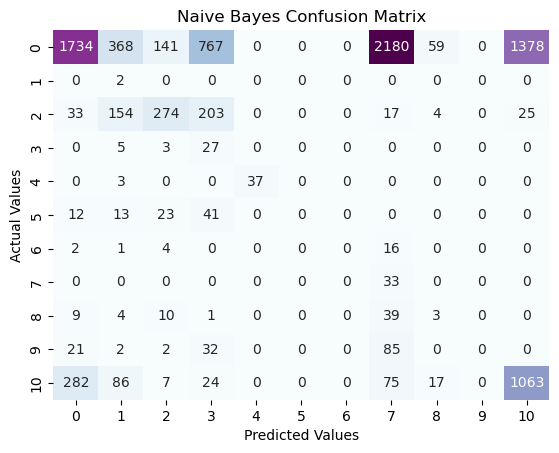

In [226]:
def my_confusion_matrix(Y_test, y_pred_gnb2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_gnb2)
    print(classification_report(Y_test, y_pred_gnb2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Naive Bayes Accuracy Score: ',accuracy_score(Y_test,y_pred_gnb2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_gnb2, 'Naive Bayes Confusion Matrix')

## KNN Classifier

In [227]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3,leaf_size=25)
knn.fit(X_train, Y_train)

KNeighborsClassifier(leaf_size=25, n_neighbors=3)

In [228]:
y_pred_knn2=knn.predict(X_test)#Test prediction
x_train_preKNN2=knn.predict(X_train)#Traning Prediction

In [229]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_knn2))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preKNN2))#Traning Accuracy

Test Accuracy :  0.7980903336551872
Traning Accuracy :  0.8549511854951185


 KNN Classifier Accuracy Score:  0.7980903336551872
              precision    recall  f1-score   support

           1       0.84      0.89      0.87      6627
           2       0.00      0.00      0.00         2
           3       0.94      0.88      0.91       710
           4       0.89      0.69      0.77        35
           5       0.91      0.97      0.94        40
           6       0.88      0.66      0.76        89
           7       1.00      0.48      0.65        23
           8       0.96      0.76      0.85        33
           9       0.92      0.71      0.80        66
          10       0.86      0.81      0.83       142
          11       0.45      0.37      0.40      1554

    accuracy                           0.80      9321
   macro avg       0.79      0.66      0.71      9321
weighted avg       0.79      0.80      0.79      9321



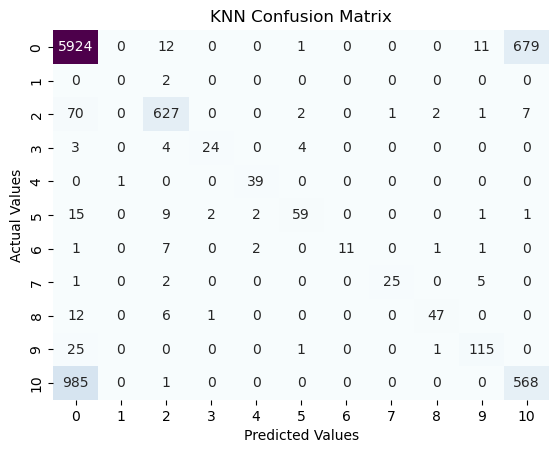

In [230]:
def my_confusion_matrix(Y_test, y_pred_knn2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_knn2)
    print(classification_report(Y_test, y_pred_knn2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' KNN Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_knn2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_knn2, 'KNN Confusion Matrix')

## SVM Classifier

In [231]:
from sklearn import svm
svm_clf = svm.SVC(decision_function_shape='ovo')
svm_clf.fit(X_train, Y_train)

SVC(decision_function_shape='ovo')

In [232]:
y_pred_svm2=svm_clf.predict(X_test)#Test Prediction
x_train_preSVM2=svm_clf.predict(X_train)#Traning Prediction

In [233]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_svm2))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preSVM2))#Traning Accuracy

Test Accuracy :  0.7109752172513679
Traning Accuracy :  0.7076493938418624


 SVM Classifier Accuracy Score:  0.7109752172513679
              precision    recall  f1-score   support

           1       0.71      1.00      0.83      6627
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00       710
           4       0.00      0.00      0.00        35
           5       0.00      0.00      0.00        40
           6       0.00      0.00      0.00        89
           7       0.00      0.00      0.00        23
           8       0.00      0.00      0.00        33
           9       0.00      0.00      0.00        66
          10       0.00      0.00      0.00       142
          11       0.00      0.00      0.00      1554

    accuracy                           0.71      9321
   macro avg       0.06      0.09      0.08      9321
weighted avg       0.51      0.71      0.59      9321



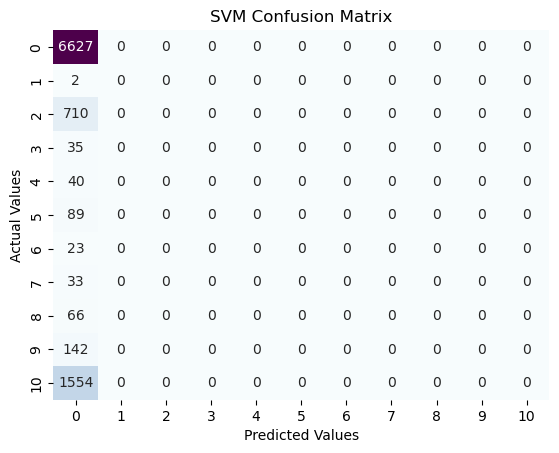

In [234]:
def my_confusion_matrix(Y_test, y_pred_svm2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_svm2)
    print(classification_report(Y_test, y_pred_svm2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' SVM Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_svm2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_svm2, 'SVM Confusion Matrix')

## Decision Tree Classifier

In [235]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier(criterion="entropy",max_depth=10,min_samples_leaf=1,min_samples_split=30,splitter="random")#object creation for decision tree  
dt.fit(X_train,Y_train)#training the model

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=30,
                       splitter='random')

In [236]:
Prediction_of_DT2=dt.predict(X_test)#Test Prediction
x_train_preDT2=dt.predict(X_train)#Traning Prediction

In [237]:
print("Test Accuracy : " ,accuracy_score(Y_test,Prediction_of_DT2))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preDT2))#Traning Accuracy

Test Accuracy :  0.8309194292457891
Traning Accuracy :  0.8308657869327325


 DecisionTree Classifier Accuracy Score:  0.8309194292457891
              precision    recall  f1-score   support

           1       0.81      1.00      0.89      6627
           2       1.00      1.00      1.00         2
           3       0.99      1.00      1.00       710
           4       1.00      1.00      1.00        35
           5       1.00      1.00      1.00        40
           6       1.00      0.99      0.99        89
           7       0.95      0.87      0.91        23
           8       1.00      0.61      0.75        33
           9       0.96      1.00      0.98        66
          10       1.00      0.99      0.99       142
          11       0.50      0.00      0.00      1554

    accuracy                           0.83      9321
   macro avg       0.93      0.86      0.87      9321
weighted avg       0.78      0.83      0.76      9321



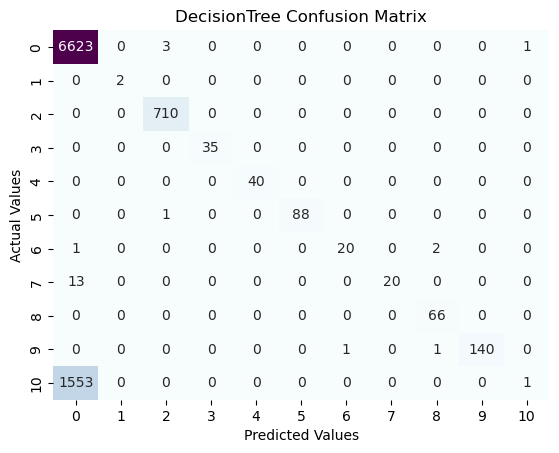

In [238]:
def my_confusion_matrix(Y_test, Prediction_of_DT2, plt_title):
    cm=confusion_matrix(Y_test, Prediction_of_DT2)
    print(classification_report(Y_test, Prediction_of_DT2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' DecisionTree Classifier Accuracy Score: ',accuracy_score(Y_test,Prediction_of_DT2))
cm_rfc=my_confusion_matrix(Y_test, Prediction_of_DT2, 'DecisionTree Confusion Matrix')

## Random Forest Classifier

In [239]:
#building the model
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(bootstrap= True,max_depth= 7,max_features= 15,min_samples_leaf= 3,min_samples_split= 10,
                           n_estimators= 200,
                           random_state=7)

In [240]:
rfc.fit(X_train, Y_train)
y_pred_rfc2=rfc.predict(X_test)#Test prediction 
x_train_preRFC2=rfc.predict(X_train)#Traning Prediction

In [241]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_rfc2))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preRFC2))#Traning accuracy

Test Accuracy :  0.8338161141508422
Traning Accuracy :  0.8381343203518936


 Random Forest Classifier Accuracy Score:  0.8338161141508422
              precision    recall  f1-score   support

           1       0.84      0.95      0.89      6627
           2       0.00      0.00      0.00         2
           3       1.00      1.00      1.00       710
           4       0.95      1.00      0.97        35
           5       1.00      1.00      1.00        40
           6       0.72      1.00      0.84        89
           7       0.96      0.96      0.96        23
           8       1.00      1.00      1.00        33
           9       0.98      0.97      0.98        66
          10       1.00      0.76      0.86       142
          11       0.53      0.23      0.33      1554

    accuracy                           0.83      9321
   macro avg       0.82      0.81      0.80      9321
weighted avg       0.81      0.83      0.81      9321



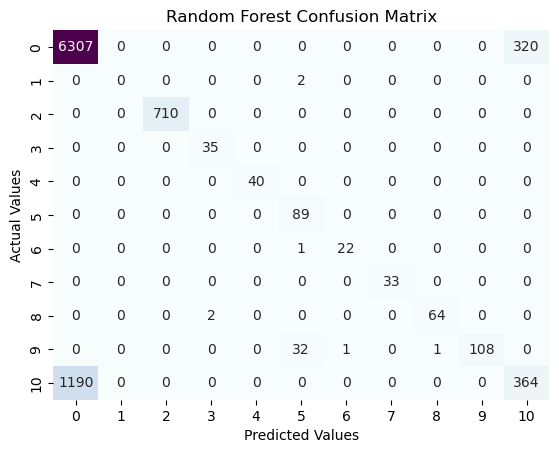

In [242]:
def my_confusion_matrix(Y_test, y_pred_rfc2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_rfc2)
    print(classification_report(Y_test, y_pred_rfc2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_rfc2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_rfc2, 'Random Forest Confusion Matrix')

## GradientBoostingClassifier

In [243]:
from sklearn.ensemble import GradientBoostingClassifier
# Create a GradientBoostingClassifier object with some parameters
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [244]:
# Fit the model to the training data
gbc.fit(X_train, Y_train)

# Predict the labels of the test data
y_pred_GBC2 = gbc.predict(X_test)
x_train_preGBC2= gbc.predict(X_train)

In [245]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_GBC2))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_preGBC2))#Traning accuracy

Test Accuracy :  0.8297392983585452
Traning Accuracy :  0.8389925973607982


 Random Forest Classifier Accuracy Score:  0.8297392983585452
              precision    recall  f1-score   support

           1       0.85      0.94      0.89      6627
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00       710
           4       1.00      1.00      1.00        35
           5       1.00      1.00      1.00        40
           6       1.00      1.00      1.00        89
           7       0.25      0.74      0.37        23
           8       1.00      1.00      1.00        33
           9       1.00      0.21      0.35        66
          10       1.00      0.99      0.99       142
          11       0.51      0.29      0.37      1554

    accuracy                           0.83      9321
   macro avg       0.87      0.83      0.82      9321
weighted avg       0.81      0.83      0.81      9321



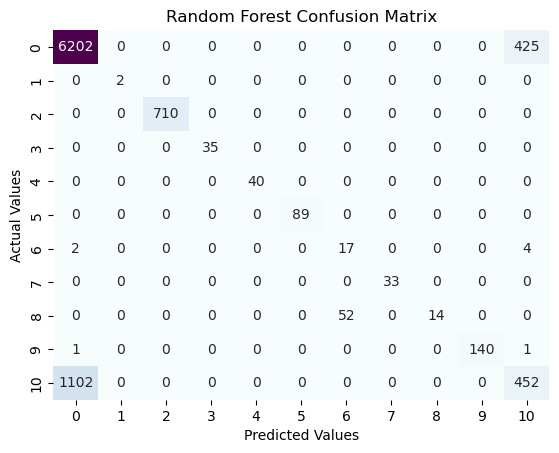

In [246]:
def my_confusion_matrix(Y_test, y_pred_GBC2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_GBC2)
    print(classification_report(Y_test, y_pred_GBC2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_GBC2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_GBC2, 'Random Forest Confusion Matrix')

## BaggingClassifier

In [247]:
# Import the BaggingClassifier class
from sklearn.ensemble import BaggingClassifier
bag = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)

In [248]:
# Fit the model to the training data
bag.fit(X_train, Y_train)
y_pred_Bagging2= bag.predict(X_test)
x_train_Bagging2= bag.predict(X_train)

In [249]:
print("Test Accuracy : " ,accuracy_score(Y_test,y_pred_Bagging2))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y_train,x_train_Bagging2))#Traning accuracy

Test Accuracy :  0.8192254049994636
Traning Accuracy :  0.9076547580731681


 Random Forest Classifier Accuracy Score:  0.8192254049994636
              precision    recall  f1-score   support

           1       0.87      0.88      0.87      6627
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00       710
           4       0.97      1.00      0.99        35
           5       1.00      1.00      1.00        40
           6       1.00      1.00      1.00        89
           7       0.96      0.96      0.96        23
           8       1.00      1.00      1.00        33
           9       0.99      1.00      0.99        66
          10       1.00      0.99      0.99       142
          11       0.46      0.45      0.45      1554

    accuracy                           0.82      9321
   macro avg       0.93      0.93      0.93      9321
weighted avg       0.82      0.82      0.82      9321



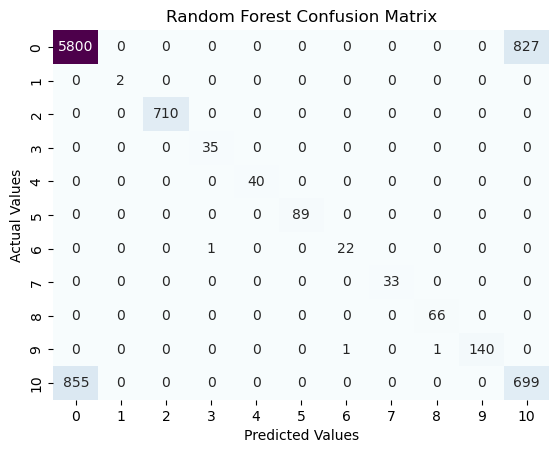

In [250]:
def my_confusion_matrix(Y_test, y_pred_Bagging2, plt_title):
    cm=confusion_matrix(Y_test, y_pred_Bagging2)
    print(classification_report(Y_test, y_pred_Bagging2))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y_test,y_pred_Bagging2))
cm_rfc=my_confusion_matrix(Y_test, y_pred_Bagging2, 'Random Forest Confusion Matrix')

## Insight

- We have used the following types of algorithm..
* Logistic Regression - Test Accuracy- 67.31% Training accuracy 67.06%
* K-Nearest Neighbours - Test Accuracy- 94.81% Training accuracy 97.04%
* Random Forest - Test Accuracy- 94.30% Training accuracy 94.21%
* Naive Bayes - Test Accuracy- 45.67% Training accuracy 46.19%
* Decision Tree - Test Accuracy- 89.65% Training accuracy 90.14%
* Support vector machine - Test Accuracy- 76.96% Training accuracy 76.94%
* BaggingClassifier - Test Accuracy- 99.19% Training accuracy 99.89%  --------------->>> Best Model
* GradientBoostingClassifier - Test Accuracy- 97.45% Training accuracy 97.68%

## MODEL EVALUATION

## Task 4

### Predicting RFC and ITSM Asset Misconfigurations: The organization aims to create predictive models for Request for Change       (RFC) and detect potential failures or misconfigurations in ITSM assets. Identifying these issues in advance will help in       preventing disruptions and improving overall ITSM asset management.

In [251]:
df_3=data.copy()

In [253]:
X2=df_3.drop(["Open_Time","Resolved_Time","Close_Time","No_of_Reassignments","No_of_Related_Changes"],axis=1)

In [254]:
X2.head()

,CI_Cat,CI_Subcat,Impact,Urgency,Priority,Category,Closure_Code,Handle_Time_hrs_conv
0,11,57,1,1,4,1,1,15312.316667
1,1,57,1,1,3,1,1,15116.866667
2,1,10,3,3,4,3,3,15722.616667
3,1,57,1,1,4,1,1,11637.700000
4,1,57,1,1,4,1,1,10922.900000


In [255]:
Y3=df_3[["No_of_Related_Changes"]]

In [256]:
data['No_of_Related_Changes'].value_counts()

No_of_Related_Changes
2.0    46069
1.0      536
Name: count, dtype: int64

In [259]:
Y3.value_counts()

No_of_Related_Changes
2.0                      46069
1.0                        536
Name: count, dtype: int64

In [260]:
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X2,Y3,test_size=0.20,random_state=42)

In [261]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(37284, 8)
(9321, 8)
(37284, 1)
(9321, 1)


## Logistic Regression

In [262]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(X1_train,Y1_train)

LogisticRegression()

In [263]:
x_tests3=model.predict(X1_test)#Test Prediction
x_trains3=model.predict(X1_train)#Tranning Prediction

In [264]:
print("Test Accuracy : " ,accuracy_score(Y1_test,x_tests3))#Test Acuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_trains3))#Tranning Accuracy

Test Accuracy :  0.9905589529020491
Traning Accuracy :  0.9879841218753352


LogisticRegression Accuracy Score:  0.9905589529020491
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        88
         2.0       0.99      1.00      1.00      9233

    accuracy                           0.99      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.99      0.99      9321



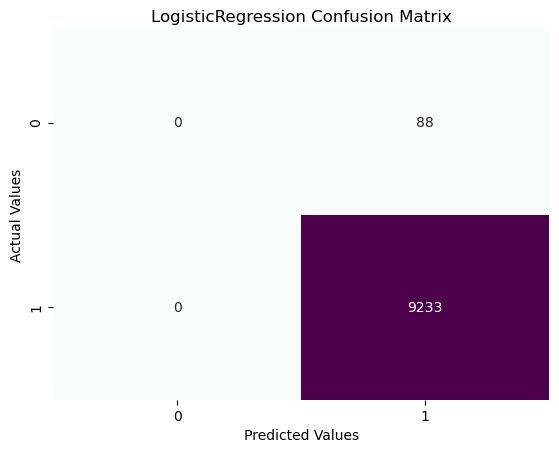

In [265]:
def my_confusion_matrix(Y1_test, x_tests3, plt_title):
    cm=confusion_matrix(Y1_test, x_tests3)
    print(classification_report(Y1_test, x_tests3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print('LogisticRegression Accuracy Score: ',accuracy_score(Y1_test,x_tests3))
cm_rfc=my_confusion_matrix(Y1_test, x_tests3, 'LogisticRegression Confusion Matrix')

## Naive Bayes

In [266]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X1_train, Y1_train)

GaussianNB()

In [267]:
y_pred_gnb3=gnb.predict(X1_test)#Test Prediction
x_train_preGNB3=gnb.predict(X1_train)#Traning Prediction

In [268]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_gnb3))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preGNB3))#Traning accuracy

Test Accuracy :  0.9770410900118013
Traning Accuracy :  0.9739030146979938


 Naive Bayes Accuracy Score:  0.9770410900118013
              precision    recall  f1-score   support

         1.0       0.01      0.01      0.01        88
         2.0       0.99      0.99      0.99      9233

    accuracy                           0.98      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.98      0.98      9321



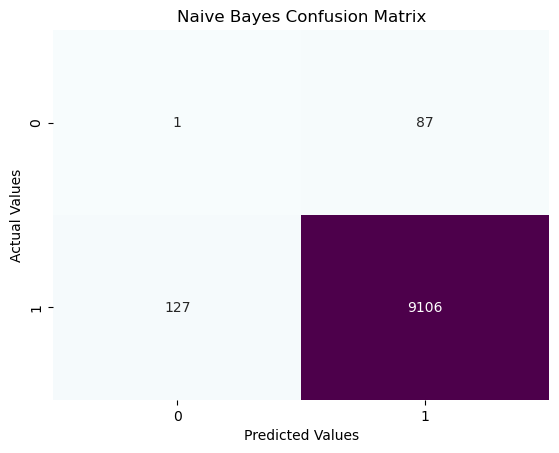

In [269]:
def my_confusion_matrix(Y1_test, y_pred_gnb3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_gnb3)
    print(classification_report(Y1_test, y_pred_gnb3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Naive Bayes Accuracy Score: ',accuracy_score(Y1_test,y_pred_gnb3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_gnb3, 'Naive Bayes Confusion Matrix')

## KNN Classifier

In [270]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3,leaf_size=25)
knn.fit(X1_train, Y1_train)

KNeighborsClassifier(leaf_size=25, n_neighbors=3)

In [271]:
y_pred_knn3=knn.predict(X1_test)#Test prediction
x_train_preKNN3=knn.predict(X1_train)#Traning Prediction

In [272]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_knn3))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preKNN3))#Traning Accuracy

Test Accuracy :  0.9895933912670314
Traning Accuracy :  0.9885741873189572


 KNN Classifier Accuracy Score:  0.9895933912670314
              precision    recall  f1-score   support

         1.0       0.09      0.01      0.02        88
         2.0       0.99      1.00      0.99      9233

    accuracy                           0.99      9321
   macro avg       0.54      0.51      0.51      9321
weighted avg       0.98      0.99      0.99      9321



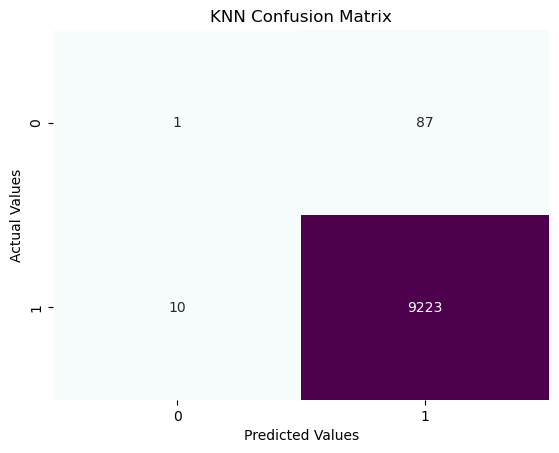

In [273]:
def my_confusion_matrix(Y1_test, y_pred_knn3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_knn3)
    print(classification_report(Y1_test, y_pred_knn3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' KNN Classifier Accuracy Score: ',accuracy_score(Y1_test,y_pred_knn3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_knn3, 'KNN Confusion Matrix')

## SVM Classifier

In [274]:
from sklearn import svm
svm_clf = svm.SVC(decision_function_shape='ovo')
svm_clf.fit(X1_train, Y1_train)

SVC(decision_function_shape='ovo')

In [275]:
y_pred_svm3=svm_clf.predict(X1_test)#Test Prediction
x_train_preSVM3=svm_clf.predict(X1_train)#Traning Prediction

In [276]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_svm3))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preSVM3))#Traning Accuracy

Test Accuracy :  0.9905589529020491
Traning Accuracy :  0.9879841218753352


 SVM Classifier Accuracy Score:  0.9905589529020491
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        88
         2.0       0.99      1.00      1.00      9233

    accuracy                           0.99      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.99      0.99      9321



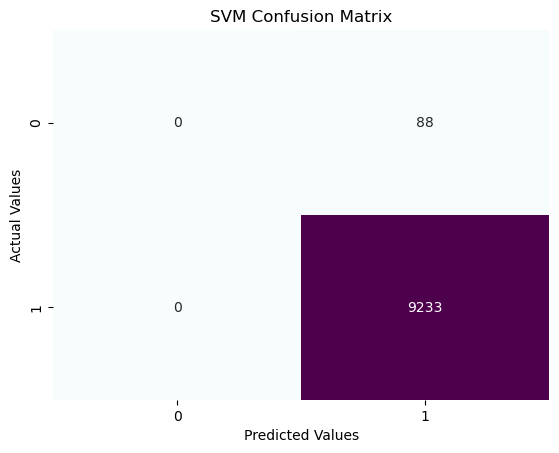

In [277]:
def my_confusion_matrix(Y1_test, y_pred_svm3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_svm3)
    print(classification_report(Y1_test, y_pred_svm3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' SVM Classifier Accuracy Score: ',accuracy_score(Y1_test,y_pred_svm3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_svm3, 'SVM Confusion Matrix')

## Decision Tree Classifier

In [278]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier(criterion="entropy",max_depth=10,min_samples_leaf=1,min_samples_split=30,splitter="random")#object creation for decision tree  
dt.fit(X1_train,Y1_train)#training the model

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=30,
                       splitter='random')

In [279]:
Prediction_of_DT3=dt.predict(X1_test)#Test Prediction
x_train_preDT3=dt.predict(X1_train)#Traning Prediction

In [280]:
print("Test Accuracy : " ,accuracy_score(Y1_test,Prediction_of_DT3))#Test Accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preDT3))#Traning Accuracy

Test Accuracy :  0.990344383649823
Traning Accuracy :  0.9880377641883918


 DecisionTree Classifier Accuracy Score:  0.990344383649823
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        88
         2.0       0.99      1.00      1.00      9233

    accuracy                           0.99      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.99      0.99      9321



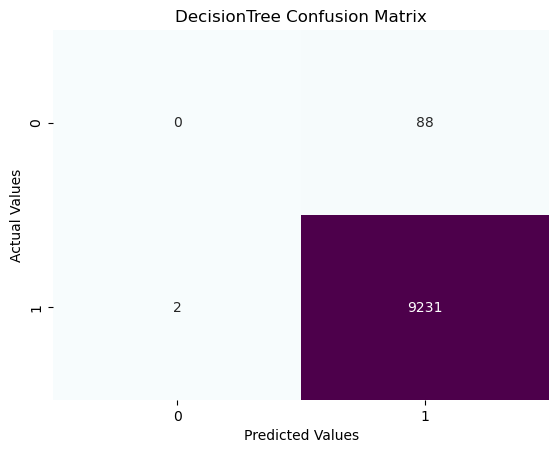

In [281]:
def my_confusion_matrix(Y1_test, Prediction_of_DT3, plt_title):
    cm=confusion_matrix(Y1_test, Prediction_of_DT3)
    print(classification_report(Y1_test, Prediction_of_DT3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' DecisionTree Classifier Accuracy Score: ',accuracy_score(Y1_test,Prediction_of_DT3))
cm_rfc=my_confusion_matrix(Y1_test, Prediction_of_DT3, 'DecisionTree Confusion Matrix')

## Random Forest Classifier

In [282]:
#building the model
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(bootstrap= True,max_depth= 7,max_features= 15,min_samples_leaf= 3,min_samples_split= 10,
                           n_estimators= 200,
                           random_state=7)

In [283]:
rfc.fit(X1_train, Y1_train)
y_pred_rfc3=rfc.predict(X1_test)#Test prediction 
x_train_preRFC3=rfc.predict(X1_train)#Traning Prediction

In [284]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_rfc3))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preRFC3))#Traning accuracy

Test Accuracy :  0.9905589529020491
Traning Accuracy :  0.9879841218753352


 Random Forest Classifier Accuracy Score:  0.9905589529020491
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        88
         2.0       0.99      1.00      1.00      9233

    accuracy                           0.99      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.99      0.99      9321



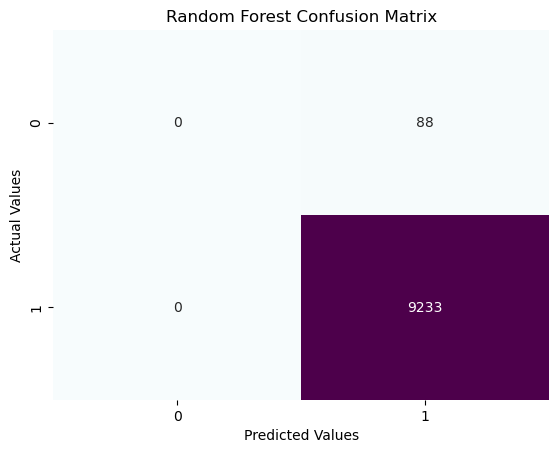

In [285]:
def my_confusion_matrix(Y1_test, y_pred_rfc3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_rfc3)
    print(classification_report(Y1_test, y_pred_rfc3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y1_test,y_pred_rfc3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_rfc3, 'Random Forest Confusion Matrix')

## GradientBoostingClassifier

In [286]:
from sklearn.ensemble import GradientBoostingClassifier
# Create a GradientBoostingClassifier object with some parameters
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [287]:
# Fit the model to the training data
gbc.fit(X1_train, Y1_train)

# Predict the labels of the test data
y_pred_GBC3 = gbc.predict(X1_test)
x_train_preGBC3= gbc.predict(X1_train)

In [288]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_GBC3))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_preGBC3))#Traning accuracy

Test Accuracy :  0.9895933912670314
Traning Accuracy :  0.9887082931015986


 Random Forest Classifier Accuracy Score:  0.9895933912670314
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        88
         2.0       0.99      1.00      0.99      9233

    accuracy                           0.99      9321
   macro avg       0.50      0.50      0.50      9321
weighted avg       0.98      0.99      0.99      9321



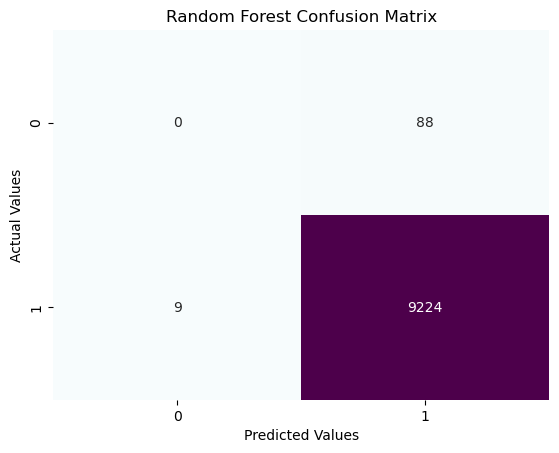

In [289]:
def my_confusion_matrix(Y1_test, y_pred_GBC3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_GBC3)
    print(classification_report(Y1_test, y_pred_GBC3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y1_test,y_pred_GBC3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_GBC3, 'Random Forest Confusion Matrix')

## BaggingClassifier¶

In [290]:
# Import the BaggingClassifier class
from sklearn.ensemble import BaggingClassifier
bag = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)

In [291]:
# Fit the model to the training data
bag.fit(X1_train, Y1_train)
y_pred_Bagging3= bag.predict(X1_test)
x_train_Bagging3= bag.predict(X1_train)

In [292]:
print("Test Accuracy : " ,accuracy_score(Y1_test,y_pred_Bagging3))#Test accuracy
print("Traning Accuracy : ",accuracy_score(Y1_train,x_train_Bagging3))#Traning accuracy

Test Accuracy :  0.9842291599613775
Traning Accuracy :  0.9942870936594786


 Random Forest Classifier Accuracy Score:  0.9842291599613775
              precision    recall  f1-score   support

         1.0       0.07      0.06      0.06        88
         2.0       0.99      0.99      0.99      9233

    accuracy                           0.98      9321
   macro avg       0.53      0.52      0.53      9321
weighted avg       0.98      0.98      0.98      9321



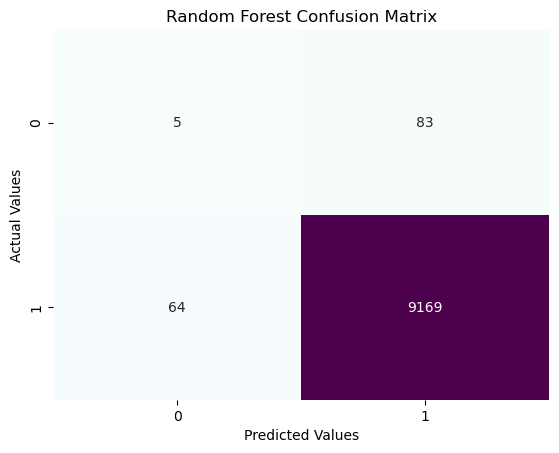

In [293]:
def my_confusion_matrix(Y1_test, y_pred_Bagging3, plt_title):
    cm=confusion_matrix(Y1_test, y_pred_Bagging3)
    print(classification_report(Y1_test, y_pred_Bagging3))
    sns.heatmap(cm, annot=True, fmt='g', cbar=False, cmap='BuPu')
    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title(plt_title)
    plt.show()
    return cm
print(' Random Forest Classifier Accuracy Score: ',accuracy_score(Y1_test,y_pred_Bagging3))
cm_rfc=my_confusion_matrix(Y1_test, y_pred_Bagging3, 'Random Forest Confusion Matrix')

## Insight

- We have used the following types of algorithm..
* Logistic Regression - Test Accuracy- 99.03% Training accuracy 98.79%
* K-Nearest Neighbours - Test Accuracy- 99.03% Training accuracy 98.93%
* Random Forest - Test Accuracy- 99.05% Training accuracy 98.79%  --------------->>>> Best Model
* Naive Bayes - Test Accuracy- 87.44% Training accuracy 87.75%
* Decision Tree - Test Accuracy- 98.99% Training accuracy 98.80%
* Support vector machine - Test Accuracy- 99.05% Training accuracy 98.79%
* BaggingClassifier - Test Accuracy- 98.72% Training accuracy 99.64%
* GradientBoostingClassifier - Test Accuracy- 98.90% Training accuracy 98.96%